# Packages

In [3]:
import freenect
import cv2
import numpy as np
from numba import njit, prange
import math
import os
import re
import sys
import time
import pickle
from pathlib import Path
import tifffile as tiff
import sys

import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.colors as mcolors
import matplotlib.cm as cm
import seaborn as sns
from matplotlib.collections import LineCollection
from matplotlib import animation, rc
rc('animation', html='jshtml')

from IPython.display import HTML
from collections import deque
from tqdm.notebook import tqdm
from behavior_functions import *
from hmmlearn import hmm

from scipy.ndimage import median_filter
from scipy.optimize import curve_fit
from scipy.stats import norm
from scipy.ndimage import gaussian_filter1d, median_filter

import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors
import matplotlib.cm as cm
import seaborn as sns
from matplotlib.collections import LineCollection

colors = {'blue':'#59D0FF', 'orange':'#FFA81C', 'purple':'#B482FF', 'red':'#FF5E5E', 'green':'#71F66D', 'pink':'#EFAAEC', 'gray':'#999999', 'black': '#434343', 'yellow': '#EEE30C', 'turquoise': '#5DF1D9', 'darkblue': '#495FFC', 'palegray': '#D7D7D7'}

### Additional infos

- If a gif is needed, screenshots of a code snipped dating back to 13-12-23 can be found and used
- Every function used in behavior preprocessing is found in behavior_functions.py

## Functions in behavior_functions.py

- Main functions: behavior_preprocessing, open_coords, total_movement, show_coords

# Dataset_list creation

In [4]:
# Behavior folder in which all sessions are.

behavior_path = "/Users/vincentchouinard/Documents/Maitrise/Behavior"

# session_keywords and mouse_keywords are lists of form ['S1', 'S2', 'S5'] or ['M29', 'M33', 'M37'], respectively.
# It can also be "all" if all sessions and mice are selected for analysis.
session_keywords = ['S1', 'S10']
mouse_keywords = ['M33','M212']

#conversion factor for x and y scale in arena (5.77 pixel per cm)
pixel_cm = 5.77

In [5]:
dataset_list = dataset_paths(behavior_path, session_keywords, mouse_keywords, verbose = True)
print("Number of datasets: " ,len(dataset_list))

Mouse keywords:  ['M33', 'M212']
Session keywords:  ['S1', 'S10']
Number of datasets:  2


# Behavior preprocessing

In [5]:
behavior_preprocessing(dataset_list, verbose=False, transform='v2')

Batch processing:   0%|          | 0/1 [00:00<?, ?it/s]

# Opening a stack of coordinates from dataset_list

In [42]:
# Stack is the full set of coordinates as an array of dim (t,3,n).
#    t is length of timeseries
#    3 accounts for the three needed dimensions
#    n is the number of datasets

# Pad is an array of dim (n) that records the number of padded (positive pad) or cropped (negative pad)
# datapoints for stack to be of the same length. Pad can be used to discredit datasets or to normalize
# them if kept.
#    n is the number of datasets

# , remove_tuples = [('S2', 'M39'),('S1', 'M34'),('S1', 'M35'),('S1', 'M37'),('S1', 'M38')]
session_stack, session_datainfo = open_coords(dataset_list, order='session_ordered', verbose = True)
mouse_stack, mouse_datainfo = open_coords(dataset_list, order='mouse_ordered', verbose = False)

ValueError: negative dimensions are not allowed

(array([ 867,  868,  869,  870,  871,  872,  873,  874,  875,  876,  877,
        878,  879,  880,  881,  882,  883,  884,  885,  886,  887,  888,
        889,  890,  891,  892,  893,  894,  895,  896,  897,  898,  899,
        900, 1137, 1138, 1139, 1140, 1141, 1142, 1143, 1144, 1145, 1146,
       1147, 1148, 1149, 1150, 1151, 1152, 1153, 1154, 1155, 1156, 1157,
       1158, 1159, 1160, 1161, 1353, 1354, 1355, 1356, 1357, 1358, 1359,
       1360, 1361, 1362, 1363, 1364, 1365, 1366, 1367, 1368, 1369, 1370,
       1371, 1372, 1373, 1374, 1375, 1376, 1377, 1378, 1379, 1380, 1381,
       1382, 1383, 1384, 1385, 1386, 1387, 1388, 1389, 1390, 1391, 1392,
       1393, 1394, 1395, 1396, 1397, 1398, 1399, 1400, 1401, 1402, 1403,
       1404, 1405, 1406, 1407, 1408, 1409, 1410, 1411, 1412, 1413, 1414,
       1415, 1416, 1417, 1418, 1419, 1420, 1421, 1422, 1423, 1424, 1425,
       1426, 1427, 1428, 1429, 2108, 2109, 2110, 2111, 2112, 2113, 2114,
       2115, 2116, 2117, 2118, 2119, 2120, 2121, 2

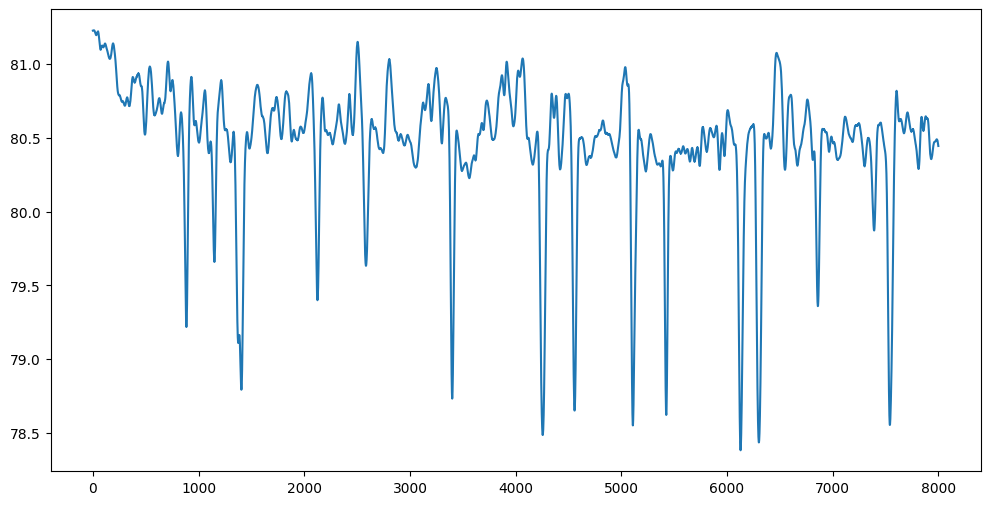

In [19]:
coords = session_stack[:,:,0]
fig,ax = plt.subplots(figsize=(12,6))
plt.plot(coords[:8000,2])
print(np.where(coords[:8000,2]<80))

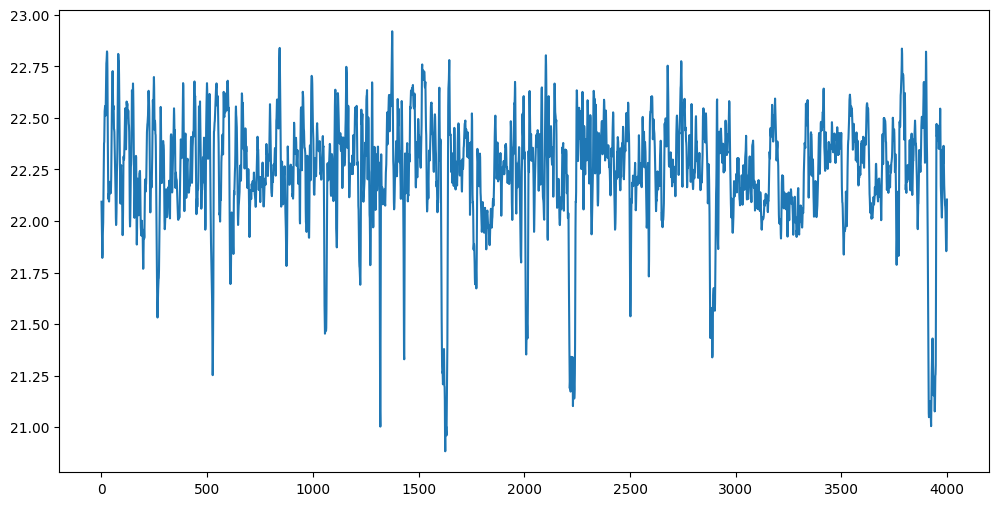

In [16]:
coords = session_stack[:,:,1]
fig,ax = plt.subplots(figsize=(12,6))
plt.plot(coords[:4000,2])

In [17]:
np.where(coords[:4000,2]<21.75)

(array([ 263,  264,  265,  266,  267,  268,  269,  270,  271,  521,  522,
         523,  524,  525,  526,  527,  528,  529,  608,  609,  610,  611,
         612, 1055, 1056, 1057, 1058, 1059, 1060, 1061, 1062, 1063, 1064,
        1065, 1222, 1223, 1224, 1225, 1317, 1318, 1319, 1320, 1430, 1431,
        1432, 1433, 1608, 1609, 1610, 1611, 1612, 1613, 1614, 1615, 1616,
        1617, 1618, 1619, 1620, 1621, 1622, 1623, 1624, 1625, 1626, 1627,
        1628, 1629, 1630, 1631, 1632, 1633, 1634, 1635, 1636, 1637, 1766,
        1767, 1768, 1772, 1773, 1774, 2006, 2007, 2008, 2009, 2010, 2011,
        2012, 2013, 2014, 2015, 2016, 2017, 2211, 2212, 2213, 2214, 2215,
        2216, 2217, 2218, 2219, 2220, 2221, 2222, 2223, 2224, 2225, 2226,
        2227, 2228, 2229, 2230, 2231, 2232, 2233, 2234, 2235, 2236, 2237,
        2238, 2239, 2240, 2241, 2500, 2501, 2502, 2503, 2589, 2878, 2879,
        2880, 2881, 2882, 2883, 2884, 2885, 2886, 2887, 2888, 2889, 2890,
        2891, 2892, 2893, 2894, 2895, 

# Par thresholding simple, les évènements détectés sont V1:  100% sur 15 events (+ 1 event qui n'avait pas été détecté par l'observation initiale) V2:  29.4% sur 34 events.

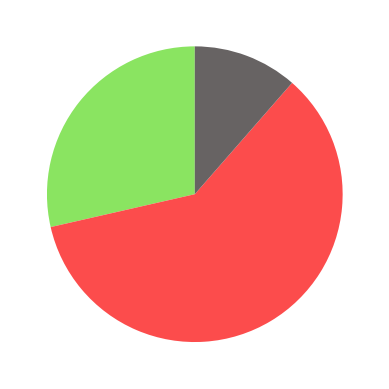

In [41]:
import matplotlib.pyplot as plt
import numpy as np

y = np.array([10, 0, 21, 4])
colors = ['#8AE461','#6BA1DF', '#FC4C4C','#676363']  # You can choose your own colors here

# Create a pie chart
wedges, texts = plt.pie(y, colors=colors, startangle=90)

# Add contour lines
# for wedge in wedges:
#     wedge.set_edgecolor('black')
#     wedge.set_linewidth(1.5)
    
plt.savefig('/Users/vincentchouinard/Documents/Maitrise/Inkscape_figures/kinect_v1_v2/pie_v2.svg')

-----

-----

# Functions:

In [9]:
def show_coords(coord):
    # Creating a 3x1 subplot layout with more horizontal orientation
    plt.figure(figsize=(12, 6))

    # Plotting x(t)
    plt.subplot(3, 1, 1)
    plt.plot(coord[:,0], color='red')
    plt.title('x(t)')

    # Plotting y(t)
    plt.subplot(3, 1, 2)
    plt.plot(coord[:,1], color='green')
    plt.title('y(t)')

    # Plotting z(t)
    plt.subplot(3, 1, 3)
    plt.plot(coord[:,2], color='blue')
    plt.title('z(t)')

    # Adjust layout to prevent overlapping
    plt.tight_layout()

    # Show the plot
    plt.show()
    
def total_movement(coord):
    # Select x,y only
    coordinates = np.copy(coord[:,:2])
    
    # Calculate the differences between consecutive coordinates
    differences = np.diff(coordinates.astype(np.float32()), axis=0)
    
    # Calculate the Euclidean distance for each pair of points
    distances = np.sqrt(np.sum(differences**2, axis=1))
    
    # Sum up the distances to get the total movement
    total_distance = np.sum(distances)
    
    return total_distance

# Creating Session/Mouse arrays for plots and scatters

In [203]:
S_total_mvt = np.zeros(session_stack.shape[2])
M_total_mvt = np.zeros(mouse_stack.shape[2])
for i in range(session_stack.shape[2]):
    S_total_mvt[i] = total_movement(session_stack[:,:,i])
    M_total_mvt[i] = total_movement(mouse_stack[:,:,i])

In [204]:
for i in range(session_stack.shape[2]):
    print(str(i) + '    ' + session_datainfo[i]['path'])

0    /Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M28_S1
1    /Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M29_S1
2    /Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M31_S1
3    /Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M33_S1
4    /Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M34_S1
5    /Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M35_S1
6    /Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M39_S1
7    /Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M40_S1
8    /Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M41_S1
9    /Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M42_S1
10    /Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M44_S1
11    /Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S2/BH_M28_S2
12    /Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S2/BH_M29_S2
13    /Users/vincentchouinard/Documents/Maitrise

In [206]:
S1_old = np.zeros(4)
S2_old = np.zeros(6)
S3_old = np.zeros(6)
S4_old = np.zeros(6)

S1_young = np.zeros(5)
S2_young = np.zeros(5)
S3_young = np.zeros(5)
S4_young = np.zeros(2)


S1_old[:] = S_total_mvt[:4]
S1_young[:] = S_total_mvt[6:11]

S2_old[:] = S_total_mvt[11:17]
S2_young[:] = S_total_mvt[17:22]

S3_old[:] = S_total_mvt[22:28]
S3_young[:] = S_total_mvt[28:33]

S4_old[:] = S_total_mvt[33:39]
S4_young[:] = S_total_mvt[39:]

In [183]:
S1_old = np.zeros(4)
S2_old = np.zeros(4)
S3_old = np.zeros(4)
S4_old = np.zeros(4)

S1_young = np.zeros(5)
S2_young = np.zeros(5)
S3_young = np.zeros(5)
S4_young = np.zeros(2)


S1_old[:] = S_total_mvt[:4]
S1_young[:] = S_total_mvt[4:9]

S2_old[:] = S_total_mvt[9:13]
S2_young[:] = S_total_mvt[13:18]

S3_old[:] = S_total_mvt[18:22]
S3_young[:] = S_total_mvt[22:27]

S4_old[:] = S_total_mvt[27:31]
S4_young[:] = S_total_mvt[31:]

In [176]:
S1_old = np.zeros(6)
S2_old = np.zeros(6)
S3_old = np.zeros(6)
S4_old = np.zeros(6)

S1_young = np.zeros(7)
S2_young = np.zeros(6)
S3_young = np.zeros(7)
S4_young = np.zeros(4)


S1_old[:4] = S_total_mvt[4:8]
S1_old[4:] = S_total_mvt[:2]*5
S1_young[:2] = S_total_mvt[2:4]*5
S1_young[2:] = S_total_mvt[8:13]

S2_old[:] = S_total_mvt[13:19]
S2_young[:] = S_total_mvt[19:25]

S3_old[:] = S_total_mvt[25:31]
S3_young[:] = S_total_mvt[31:38]

S4_old[:] = S_total_mvt[38:44]
S4_young[:] = S_total_mvt[44:]

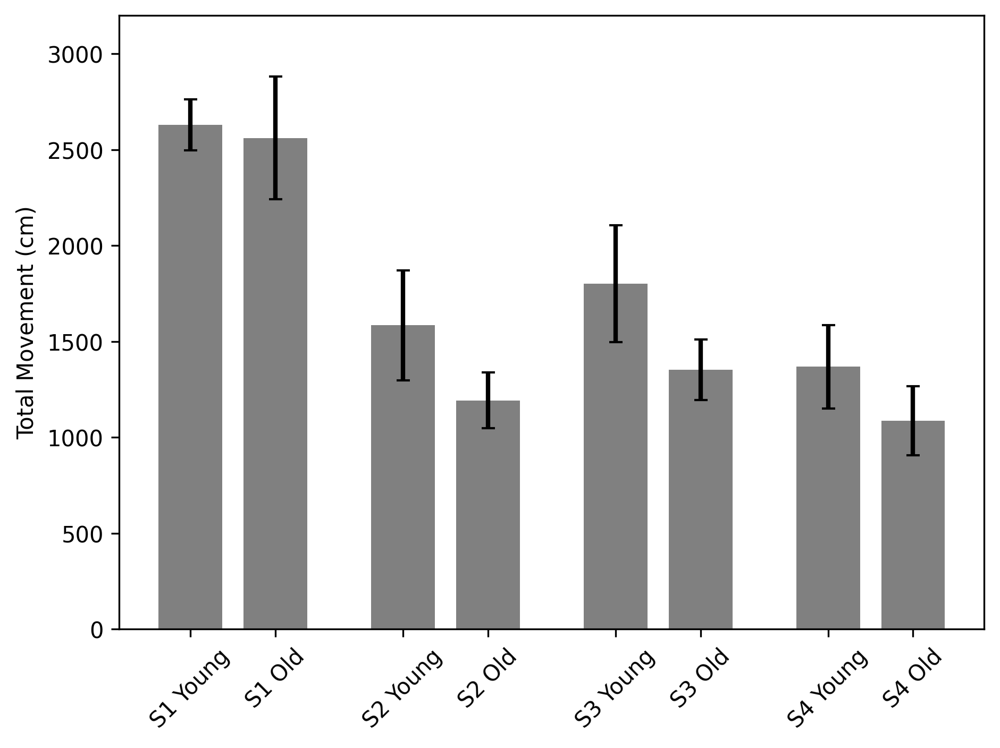

In [207]:
import numpy as np
import matplotlib.pyplot as plt


# Create figure and axis
fig, ax = plt.subplots(figsize=(7, 5),dpi=300)  # Adjust the figure size as needed

# Calculate means and standard deviations, make sure to replace the dataset names with your variables
means = np.array([
    np.mean(S1_young), np.mean(S1_old),
    np.mean(S2_young), np.mean(S2_old),
    np.mean(S3_young), np.mean(S3_old),
    np.mean(S4_young), np.mean(S4_old)
]) / pixel_cm


# Function to calculate SEM
def sem(data):
    return np.std(data, ddof=1) / np.sqrt(len(data))

sems = np.array([
    sem(S1_young/ pixel_cm), sem(S1_old/ pixel_cm),
    sem(S2_young/ pixel_cm), sem(S2_old/ pixel_cm),
    sem(S3_young/ pixel_cm), sem(S3_old/ pixel_cm),
    sem(S4_young/ pixel_cm), sem(S4_old/ pixel_cm)
]) 

# Indices for the bars
indices = np.array([0, 1, 2.5, 3.5, 5, 6, 7.5, 8.5])  # Adjusted indices for better spacing

# Bar widtha
bar_width = 0.75  # Adjust the bar width

# Define error bar attributes
error_attributes = {'elinewidth': 2, 'ecolor': 'black', 'capsize': 3}

# Create bars with error bars
ax.bar(indices, means, width=bar_width, color='gray', yerr=stds, error_kw=error_attributes)

# Adding labels and title
ax.set_xticks(indices)  # Set x-ticks to be where the bars are
ax.set_xticklabels(['S1 Young', 'S1 Old', 'S2 Young', 'S2 Old', 'S3 Young', 'S3 Old', 'S4 Young', 'S4 Old'], rotation=45)
ax.set_ylim([0, 3200])
ax.set_ylabel('Total Movement (cm)')  # Y-axis label, with unit added
plt.show()

In [185]:
from scipy import stats

def p_value(dist1, dist2):
    # Perform a two-sample t-test
    t_stat, p_value = stats.ttest_ind(dist1, dist2, equal_var=False)  # Set equal_var=False for Welch's t-test
    
    return p_value

In [212]:
young = np.concatenate((S2_young, S3_young, S4_young))
old = np.concatenate((S2_old, S3_old, S4_old))

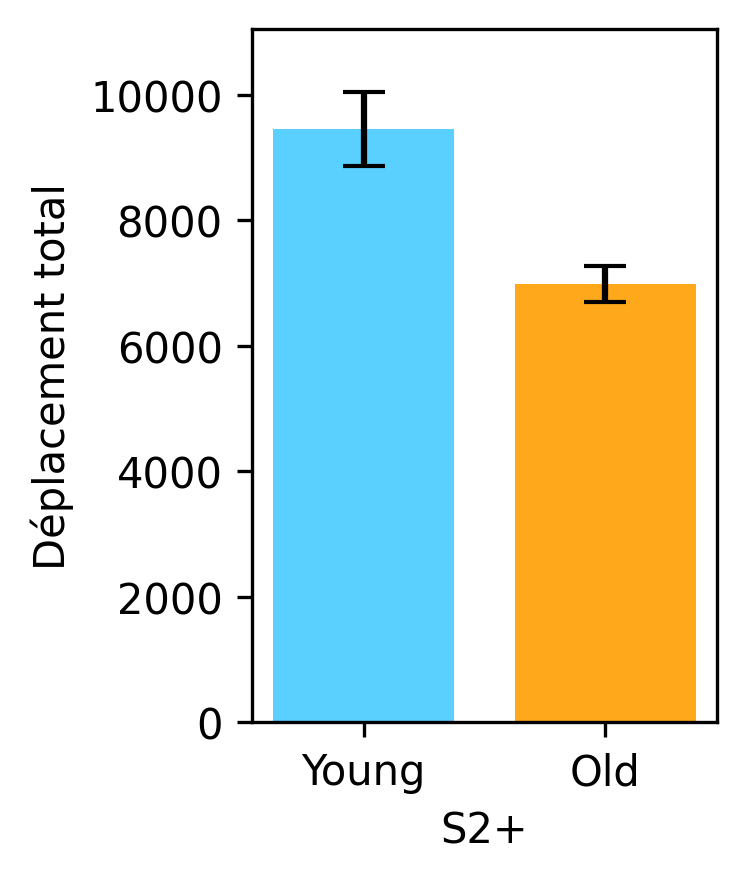

In [230]:
# Function to calculate the mean and SEM
def mean_and_sem(data):
    mean = np.mean(data)
    sem = np.std(data, ddof=1) / np.sqrt(len(data))
    return mean, sem

# Calculate mean and SEM for both young and old
young_mean, young_sem = mean_and_sem(young)
old_mean, old_sem = mean_and_sem(old)

# Prepare data for plotting
labels = ['Young', 'Old']
means = [young_mean, old_mean]
sems = [young_sem, old_sem]

# Plotting
fig, ax = plt.subplots(figsize=(2, 3), dpi=300)
x = np.arange(len(labels))  # Label locations
width = 0.75  # Width of the bars

# Create bars with error bars
ax.bar(x, means, width, yerr=sems, capsize=5, color=[colors['blue'],colors['orange']])

# Adding labels and title
ax.set_xlabel('S2+')
ax.set_ylabel('Déplacement total (cm)')
#ax.set_title('Comparison of Mean Values with SEM')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.set_ylim([0, max(means) + max(sems) + 1000])  # Adjust y-axis limit for better visibility

# Show plot
plt.savefig('')


In [224]:
print(p_value(young,old))

0.0017181826479547616


In [11]:
M28 = M_total_mvt[0:6]
M29 = M_total_mvt[8:14]
M31 = M_total_mvt[14:18]
M33 = M_total_mvt[18:24]
M34 = M_total_mvt[24:29]
M35 = M_total_mvt[29:34]
M37 = M_total_mvt[34:43]
M38 = M_total_mvt[43:52]
M39 = M_total_mvt[52:59]
M40 = M_total_mvt[59:62]
M41 = M_total_mvt[62:65]
M42 = M_total_mvt[65:73]
M44 = M_total_mvt[73:]

In [133]:
for i in range(76):
    print(str(i) + '    ' + session_datainfo[i]['path'])

0    /Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S0/BH_M34_S0
1    /Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S0/BH_M35_S0
2    /Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S0/BH_M37_S0
3    /Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S0/BH_M38_S0
4    /Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M28_S1
5    /Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M29_S1
6    /Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M31_S1
7    /Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M33_S1
8    /Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M34_S1
9    /Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M35_S1
10    /Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M37_S1
11    /Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M38_S1
12    /Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M39_S1
13    /Users/vincentchouinard/Documents/Maitrise

In [134]:
S0 = S_total_mvt[:4]
S1 = S_total_mvt[4:17]
S2 = S_total_mvt[17:29]
S3 = S_total_mvt[29:42]
S4 = S_total_mvt[42:52]
S5 = S_total_mvt[52:59]
S6 = S_total_mvt[59:66]
S7 = S_total_mvt[67:71]
S8 = S_total_mvt[72:]

# Bar chart of sessions

In [137]:
real_S1 = np.zeros(S1.shape)
real_S1[:4] = S1[:4]
real_S1[4:8] = np.array(S0)*5
real_S1[8:13] = S1[8:13]

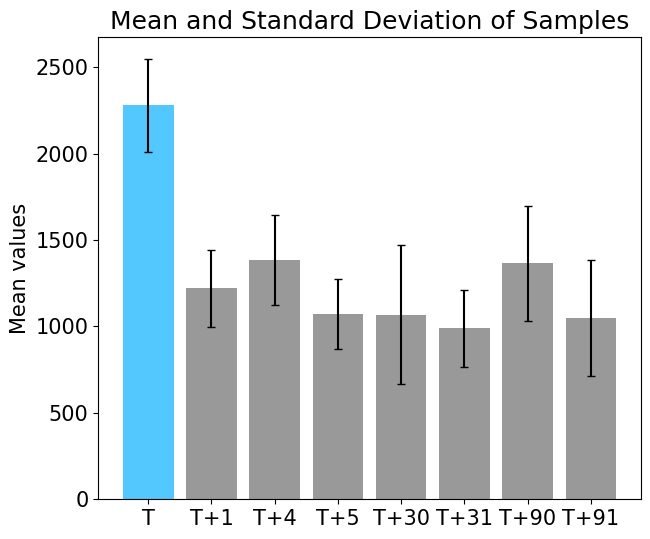

In [244]:
# Create subplots

import numpy as np
import matplotlib.pyplot as plt

# Assuming the variables real_S1, S2, ..., S8 are defined and contain your data

# Create figure and axis
fig, ax = plt.subplots(figsize=(7, 6))  # Adjust the figure size as needed

# Calculate means and standard deviations
means = np.array([np.mean(real_S1), np.mean(S2), np.mean(S3), np.mean(S4),
         np.mean(S5), np.mean(S6), np.mean(S7), np.mean(S8)])/pixel_cm
stds = np.array([np.std(real_S1), np.std(S2), np.std(S3), np.std(S4),
        np.std(S5), np.std(S6), np.std(S7), np.std(S8)])/pixel_cm

# Indices for the bars
indices = range(len(means))

# Create bars with error bars
ax.bar(indices, means, color=colours, yerr=stds, capsize=3)  # capsize specifies the width of the cap on the error bars

# Adding labels and title
ax.set_xticks(indices)  # Set x-ticks to be where the bars are
ax.set_xticklabels(['T', 'T+1', 'T+4', 'T+5', 'T+30', 'T+31', 'T+90', 'T+91'])  # Label names
ax.set_ylabel('Mean values')  # Y-axis label
ax.set_title('Mean and Standard Deviation of Samples')  # Title

plt.show()  # Display the plot


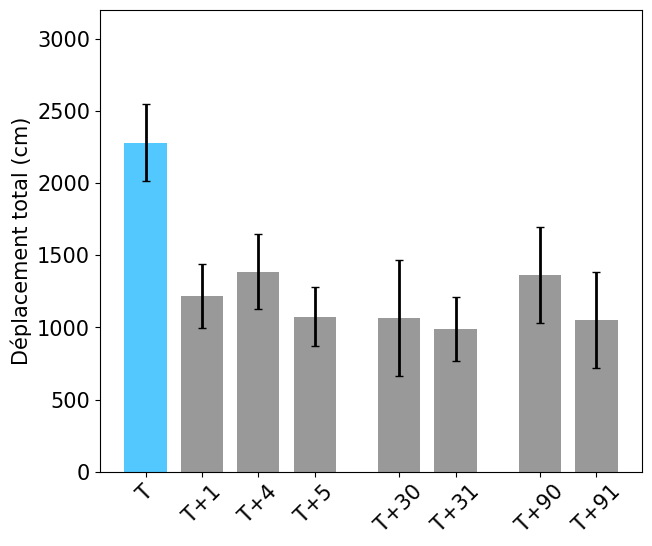

In [256]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming the variables real_S1, S2, ..., S8 are defined and contain your data

# Create figure and axis
fig, ax = plt.subplots(figsize=(7, 6))  # Adjust the figure size as needed

# Calculate means and standard deviations
means = np.array([np.mean(real_S1), np.mean(S2), np.mean(S3), np.mean(S4),
         np.mean(S5), np.mean(S6), np.mean(S7), np.mean(S8)])/pixel_cm
stds = np.array([np.std(real_S1), np.std(S2), np.std(S3), np.std(S4),
        np.std(S5), np.std(S6), np.std(S7), np.std(S8)])/pixel_cm

# Indices for the bars
indices = np.array([0, 1, 2, 3, 4.5, 5.5, 7, 8])  # Add gaps by adjusting positions

# Bar width
bar_width = 0.75  # Decrease the width for thinner bars

# Define error bar attributes
error_attributes = {'elinewidth': 2, 'ecolor': 'black', 'capsize': 3}

# Create bars with error bars
ax.bar(indices, means, width=bar_width, color=colours, yerr=stds, error_kw=error_attributes)

# Adding labels and title
ax.set_xticks(indices)  # Set x-ticks to be where the bars are
ax.set_xticklabels(['T', 'T+1', 'T+4', 'T+5', 'T+30', 'T+31', 'T+90', 'T+91'], rotation=45)  # Label names
ax.set_ylim([0,3200])
ax.set_ylabel('Déplacement total (cm)')  # Y-axis label, with unit added
#ax.set_title('Mean and Standard Deviation of Samples')  # Title

plt.savefig('/Users/vincentchouinard/Documents/Maitrise/Inkscape_figures/finished_figures/BH_mvt_habituation/barplot.svg')  # Display the plot

/var/folders/w6/s9qjh5156jg5p8dh9sd4bysr0000gn/T/ipykernel_96188/2361087673.py:20: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(data=data_list, scale='width', ax=ax, palette=colours)
/var/folders/w6/s9qjh5156jg5p8dh9sd4bysr0000gn/T/ipykernel_96188/2361087673.py:25: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels, fontsize=font_size, rotation=45)  # Set the font size for x-tick labels specifically if needed


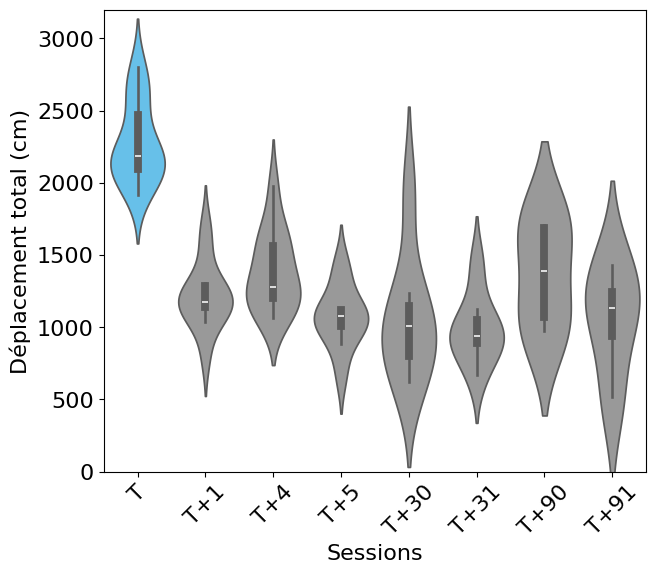

In [241]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns  # Importing seaborn for better aesthetics and easier violin plot creation

# Font size variable
font_size = 16  # You can adjust this value to change the font size globally

# Assuming the variables real_S1, S2, ..., S8 are defined and contain your data
data_list = [real_S1/pixel_cm, S2/pixel_cm, S3/pixel_cm, S4/pixel_cm, S5/pixel_cm, S6/pixel_cm, S7/pixel_cm, S8/pixel_cm]
labels = ['T', 'T+1', 'T+4', 'T+5', 'T+30', 'T+31', 'T+90', 'T+91']

# Create figure and axis
fig, ax = plt.subplots(figsize=(7, 6))  # Adjust the figure size as needed

# Define colors for each violin
# Assuming you want to highlight the third violin plot
colours = ['#52C8FE', colors['gray'], colors['gray'], colors['gray'], colors['gray'], colors['gray'], colors['gray'], colors['gray']]

# Create violin plots with specific colors
sns.violinplot(data=data_list, scale='width', ax=ax, palette=colours)


# Set font size for tick labels and axis labels
ax.tick_params(axis='both', which='major', labelsize=font_size)  # Set the font size for major ticks
ax.set_xticklabels(labels, fontsize=font_size, rotation=45)  # Set the font size for x-tick labels specifically if needed
ax.set_ylim([0,3200])
ax.set_ylabel('Déplacement total (cm)', fontsize=font_size)  # Set font size for the y-axis label
ax.set_xlabel('Sessions', fontsize=font_size)
#ax.set_title('Distribution of Sample Values Over Time', fontsize=font_size)  # Set font size for the title

plt.savefig('/Users/vincentchouinard/Documents/Maitrise/Inkscape_figures/finished_figures/BH_mvt_habituation/sessions.svg')

In [229]:
data_list

[array([2804.95778948, 2095.92534797, 2121.08934955, 2005.07474003,
        2668.71746202, 1912.97254116, 2184.69132501, 2629.7046787 ,
        2191.21161449, 2292.91865251, 2166.22498511, 2468.71631959,
        2076.60159635]),
 array([1177.61429335,  803.86478417, 1170.75999242, 1155.62911273,
        1152.93789604, 1222.83692252, 1308.0228756 , 1275.93788927,
        1702.72337386, 1090.0730814 , 1538.39701581, 1033.88485702]),
 array([1277.45460761, 1062.60290295, 1272.11143983, 1559.44777675,
        1200.86578951, 1214.9829567 , 1503.67556461, 1165.04346295,
        1696.95928564, 1621.89124783, 1380.70975953, 1975.91004793,
        1075.93331957]),
 array([1107.69055662,  671.80281561,  885.00748077, 1121.44917136,
        1009.13779855, 1334.17469468, 1104.02540078, 1057.73143008,
        1005.69385019, 1439.78197438]),
 array([1234.75657022,  621.91887761, 1011.64191129, 1053.42084597,
         747.31301451,  858.58808018, 1938.66307409]),
 array([ 969.74627992,  665.9458524 ,

In [55]:
def scatter_x(array, value):
    return np.ones(array.shape)*value

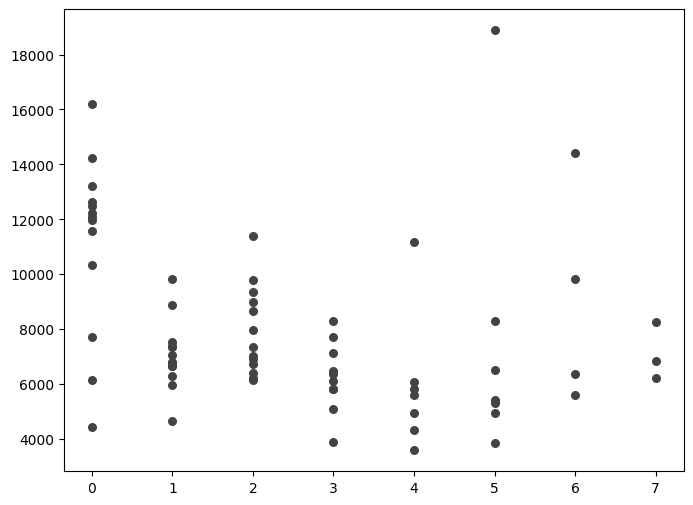

In [56]:
fig,ax = plt.subplots(figsize=(8,6))


# plt.plot(M28, color=colors['blue'], linewidth=1)
# plt.plot(M29, color=colors['orange'], linewidth=1)
# plt.plot(M31, color=colors['purple'], linewidth=1)
# plt.plot(M33, color=colors['red'], linewidth=1)
# plt.plot(M34, color=colors['green'], linewidth=1)
# plt.plot(M35, color=colors['pink'], linewidth=1)
# plt.plot(M37, color=colors['gray'], linewidth=1)
# plt.plot(M38, color=colors['black'], linewidth=1)
# plt.plot(M39, color=colors['yellow'], linewidth=1)
# plt.plot(M40, color=colors['turquoise'], linewidth=1)
# plt.plot(M41, color=colors['darkblue'], linewidth=1)
# plt.plot(M42, color=colors['palegray'], linewidth=1)
# plt.plot(M44, color=colors['black'], linewidth=1)

plt.scatter(scatter_x(S1,0),S1, color=colors['black'], s=30)
plt.scatter(scatter_x(S2,1),S2, color=colors['black'], s=30)
plt.scatter(scatter_x(S3,2),S3, color=colors['black'], s=30)
plt.scatter(scatter_x(S4,3),S4, color=colors['black'], s=30)
plt.scatter(scatter_x(S5,4),S5, color=colors['black'], s=30)
plt.scatter(scatter_x(S6,5),S6, color=colors['black'], s=30)
plt.scatter(scatter_x(S7,6),S7, color=colors['black'], s=30)
plt.scatter(scatter_x(S8,7),S8, color=colors['black'], s=30)

#mean = np.array([np.mean(S1), np.mean(S2), np.mean(S3), np.mean(S4), np.mean(S5), np.mean(S6), np.mean(S7), np.mean(S8)])

#plt.plot(mean, color=colors['black'], linewidth=5)
plt.show()

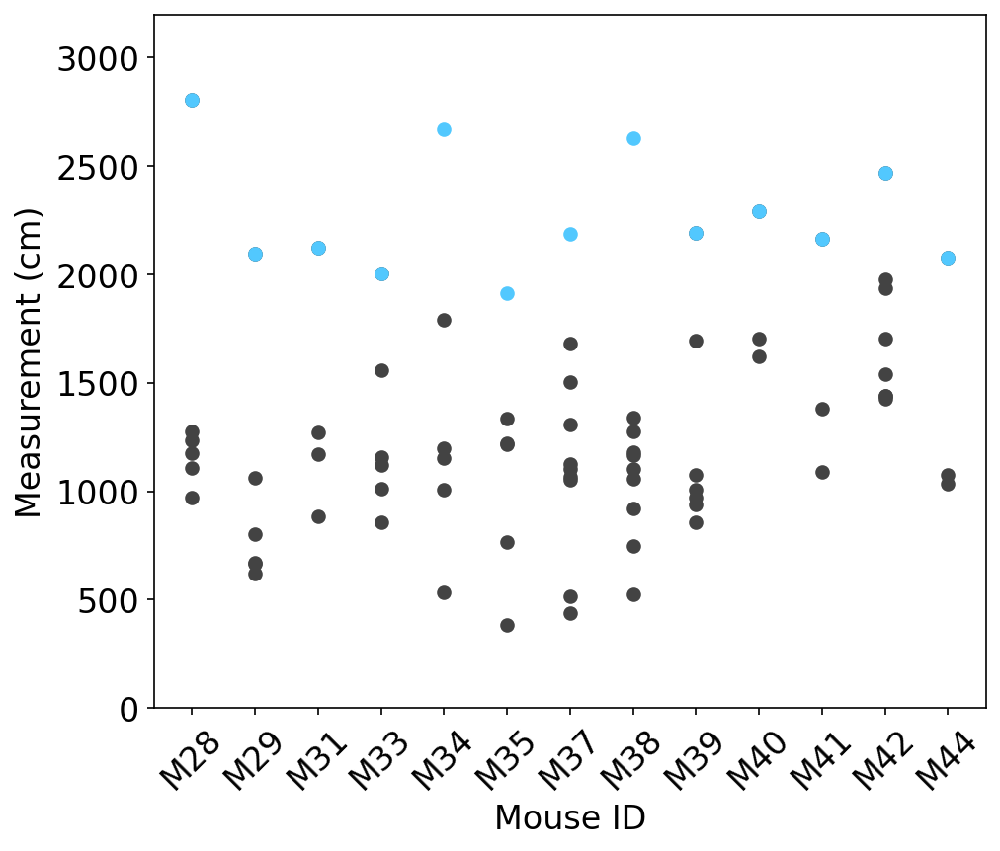

In [208]:
fig, ax = plt.subplots(figsize=(7,6), dpi=150)
plt.scatter(scatter_x(M28,0), M28/pixel_cm, color=colors['black'])
plt.scatter(scatter_x(M29,1), M29/pixel_cm, color=colors['black'])
plt.scatter(scatter_x(M31,2), M31/pixel_cm, color=colors['black'])
plt.scatter(scatter_x(M33,3), M33/pixel_cm, color=colors['black'])
plt.scatter(scatter_x(M34,4), M34/pixel_cm, color=colors['black'])
plt.scatter(scatter_x(M35,5), M35/pixel_cm, color=colors['black'])
plt.scatter(scatter_x(M37,6), M37/pixel_cm, color=colors['black'])
plt.scatter(scatter_x(M38,7), M38/pixel_cm, color=colors['black'])
plt.scatter(scatter_x(M39,8), M39/pixel_cm, color=colors['black'])
plt.scatter(scatter_x(M40,9), M40/pixel_cm, color=colors['black'])
plt.scatter(scatter_x(M41,10), M41/pixel_cm, color=colors['black'])
plt.scatter(scatter_x(M42,11), M42/pixel_cm, color=colors['black'])
plt.scatter(scatter_x(M44,12), M44/pixel_cm, color=colors['black'])

plt.scatter([0], M28[0]/pixel_cm, color='#52C8FE')
plt.scatter([1], M29[0]/pixel_cm, color='#52C8FE')
plt.scatter([2], M31[0]/pixel_cm, color='#52C8FE')
plt.scatter([3], M33[0]/pixel_cm, color='#52C8FE')
#plt.scatter([4], M34[0]/pixel_cm, color=colors['green'])
#plt.scatter([5], M35[0]/pixel_cm, color=colors['pink'])
#plt.scatter([6], M37[0]/pixel_cm, color=colors['gray'])
#plt.scatter([7], M38[0]/pixel_cm, color='crimson')
plt.scatter([8], M39[0]/pixel_cm, color='#52C8FE')
plt.scatter([9], M40[0]/pixel_cm, color='#52C8FE')
plt.scatter([10], M41[0]/pixel_cm, color='#52C8FE')
plt.scatter([11], M42[0]/pixel_cm, color='#52C8FE')
plt.scatter([12], M44[0]/pixel_cm, color='#52C8FE')

plt.scatter([4], 5*S0[0]/pixel_cm, color='#52C8FE')
plt.scatter([5], 5*S0[1]/pixel_cm, color='#52C8FE')
plt.scatter([6], 5*S0[2]/pixel_cm, color='#52C8FE')
plt.scatter([7], 5*S0[3]/pixel_cm, color='#52C8FE')

mice_labels = ['M28', 'M29', 'M31', 'M33', 'M34', 'M35', 'M37', 'M38', 'M39', 'M40', 'M41', 'M42', 'M44']

ax.set_xticks(range(len(mice_labels)))
ax.set_xticklabels(mice_labels, rotation=45)
ax.set_xlabel('Mouse ID')
ax.set_ylabel('Measurement (cm)')
ax.tick_params(axis='x')
ax.tick_params(axis='y')
#ax.set_title('Mouse Measurements')
ax.set_ylim([0,3200])

plt.rcParams.update({'font.size': 15})

plt.tight_layout()


plt.savefig('/Users/vincentchouinard/Documents/Maitrise/Inkscape_figures/finished_figures/BH_mvt_habituation/mvt_habituation_v2.svg')

In [228]:
import numpy as np
from scipy import stats

def compare_distributions(dist1, dist2):
    """
    Compare deux distributions pour voir si elles sont significativement différentes.
    
    Parameters:
        dist1 (np.array): Première distribution de données.
        dist2 (np.array): Deuxième distribution de données.
    
    Returns:
        None: Affiche le résultat des tests statistiques.
    """
    # Test de normalité (Test de Shapiro-Wilk)
    normality_dist1 = stats.shapiro(dist1)
    normality_dist2 = stats.shapiro(dist2)
    
    print("Résultat du test de Shapiro-Wilk :")
    print(f"Distribution 1: Statistique={normality_dist1[0]}, p-value={normality_dist1[1]}")
    print(f"Distribution 2: Statistique={normality_dist2[0]}, p-value={normality_dist2[1]}")
    
    # Vérifie si les deux distributions sont normales
    if normality_dist1[1] > 0.05 and normality_dist2[1] > 0.05:
        print("Les deux distributions semblent normales, on utilise un test t de Student.")
        test_result = stats.ttest_ind(dist1, dist2, equal_var=False)  # Test t pour échantillons indépendants
        print(f"Test t de Student: Statistique={test_result.statistic}, p-value={test_result.pvalue}")
    else:
        print("Au moins une des distributions n'est pas normale, on utilise le test de Mann-Whitney.")
        test_result = stats.mannwhitneyu(dist1, dist2, alternative='two-sided')  # Test de Mann-Whitney
        print(f"Test de Mann-Whitney: Statistique={test_result.statistic}, p-value={test_result.pvalue}")
        
    # Check pour la significativité
    if test_result.pvalue < 0.05:
        print("Il y a une différence statistiquement significative entre les deux distributions.")
    else:
        print("Il n'y a pas de différence statistiquement significative entre les deux distributions.")

compare_distributions(S2, S3)

Résultat du test de Shapiro-Wilk :
Distribution 1: Statistique=0.9317798614501953, p-value=0.39936044812202454
Distribution 2: Statistique=0.9282928109169006, p-value=0.32368355989456177
Les deux distributions semblent normales, on utilise un test t de Student.
Test t de Student: Statistique=-1.6523228597941506, p-value=0.11214251103650441
Il n'y a pas de différence statistiquement significative entre les deux distributions.


In [217]:
M34/pixel_cm

array([ 533.7434924 , 1791.08992499, 1152.93789604, 1200.86578951,
       1009.13779855])

# Attention M34 à M38 avaient déjà été habituées

In [300]:
Sfirst = S1/pixel_cm
Sothers = np.hstack((S2,S3,S4,S5,S6,S7,S8))/pixel_cm

T-statistic: 10.46794143598418, P-value: 1.997334644368526e-10


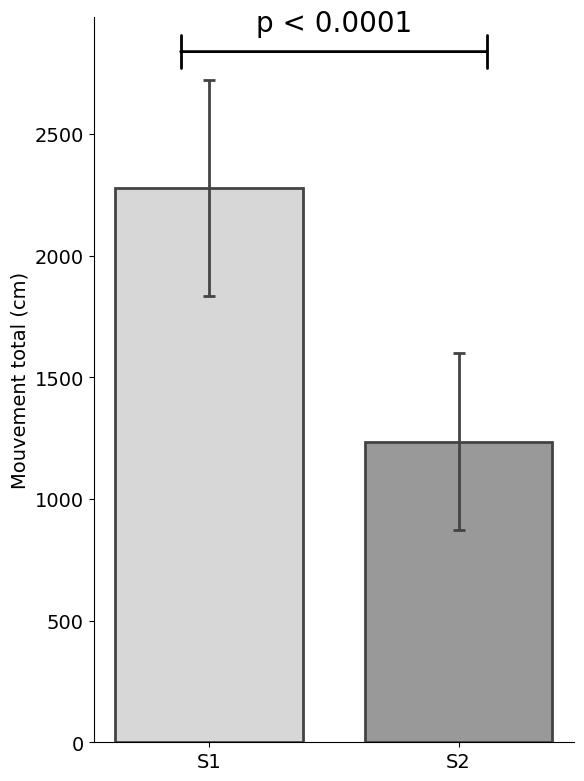

In [356]:
from scipy.stats import ttest_ind, sem # Import sem for standard error of the mean
import matplotlib.pyplot as plt
import numpy as np


# Perform two-sample t-test
t_stat, p_value = ttest_ind(nonhabit, habit)

# Print t-statistic and p-value
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# Create a barplot
labels = ['S1', 'S2']
means = [np.mean(nonhabit/pixel_cm), np.mean(habit/pixel_cm)]
errors = [sem(nonhabit), sem(habit)] # Use sem instead of std

# Figure adjustments for aesthetics
plt.figure(figsize=(6, 8)) # Make the figure square and smaller
width = 0.3  # Make bars narrower

# Adjust bar positions to be closer to each other
positions = [0,0.4]

alpha_inf = 0.0001
alpha2 = 0.001 # Common significance level
alpha = 0.05 # Common significance level
# Determine the height at which to place the star and bracket

star_position = max(means) + max(errors) + 0.05*max(means)
highest_point = max(max(means) + max(errors), star_position) + 0.5  # Adjust as needed

# Place the star between the bars
midpoint = np.mean([positions[0] + width/2, positions[1] - width/2])
if p_value < alpha_inf:
    plt.text(midpoint, highest_point + 0.03*highest_point, 'p < 0.0001', fontsize=20, ha='center')
elif p_value < alpha2:
    plt.text(midpoint, highest_point, '*', fontsize=20, ha='center')
elif p_value < alpha:
    plt.text(midpoint, highest_point, '*', fontsize=20, ha='center')

# Draw the bracket
bracket_height = highest_point + 0.8  # Adjust as needed for visual appearance
plt.annotate('', xy=(positions[0] + 3*width/2, bracket_height), xytext=(positions[1] - 3*width/2, bracket_height),
             arrowprops=dict(arrowstyle='|-|', lw=2, color='black'))
# Add a line connecting the top of the bars/error bars to the bracket
plt.plot([midpoint, midpoint], [highest_point, bracket_height - 0.05], color='black', lw=1.5)

# Customization for bar and error bar appearance
bar_properties = {
    'linewidth': 2,        # Width of the bar border
    'color': [colors['palegray'], colors['gray']],  # Bar fill color
    'capsize': 4, # Cap size for error bars
    'yerr': errors,        # Error values
    'error_kw': {'elinewidth': 2, 'ecolor': colors['black'], 'capthick': 2},
    'zorder': 3,
    'edgecolor': colors['black'] # Ensure bars are plotted over the grid
}  # Error bar properties


#plt.grid(axis='y', linestyle='-', linewidth=2, color='black', alpha=0.5)
plt.bar(positions, means, width, **bar_properties)  # Color of the bar border  # Width of the border around bars)


#plt.bar(positions, means, width, yerr=errors, capsize=5, color=[colors['blue'], colors['red']])
plt.xticks(positions, labels, fontsize=14)
plt.yticks(fontsize=14)# Set custom x-ticks to correspond to the labels
plt.ylabel('Mouvement total (cm)', fontsize=14)
plt.tight_layout() # Optional: may help with fitting everything neatly into the figure
plt.gca().spines['top'].set_visible(False)  # Remove the top spine
plt.gca().spines['right'].set_visible(False)  # Remove the right spine
#plt.gca().spines['bottom'].set_visible(False)  # Optionally, remove the bottom spine
#plt.gca().spines['left'].set_visible(False)  # Optionally, remove the left spine
#plt.ylim([-0.1,300])
#plt.xlim([-0.2,0.6])

plt.savefig('/Users/vincentchouinard/Documents/Maitrise/Inkscape_figures/BH_habituation/habituation_stats.svg')

{'whiskers': [<matplotlib.lines.Line2D at 0x7fb0cfab0340>,
 'caps': [<matplotlib.lines.Line2D at 0x7fb0cfab0880>,
 'boxes': [<matplotlib.lines.Line2D at 0x7fb0cfab00a0>],
 'medians': [<matplotlib.lines.Line2D at 0x7fb0cfab0dc0>],
 'fliers': [<matplotlib.lines.Line2D at 0x7fb0cfa960a0>],
 'means': []}

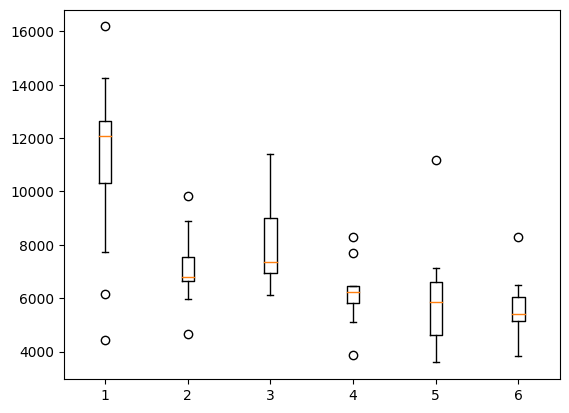

In [251]:
plt.boxplot(S1, positions=[1])
plt.boxplot(S2, positions=[2])
plt.boxplot(S3, positions=[3])
plt.boxplot(S4, positions=[4])
plt.boxplot(S5, positions=[5])
plt.boxplot(S6, positions=[6])
plt.boxplot(S7, positions=[7])
plt.boxplot(S8, positions=[8])

In [ ]:
total_mvt = np.zeros(stack.shape[2])
for i in range(stack.shape[2]):
    total_mvt[i] = total_movement(stack[:,:,i])

In [48]:
total_mvt = []
for i in range(len(dataset_list)):
    coord_dict = load_dict(dataset_list[i] + "/metadata.pkl")
    #show_coords(coord_dict)
    total_mvt.append(total_movement(coord_dict['coords']))

In [58]:
S1 = dataset_list[0:13]
S2 = dataset_list[13:26]
S3 = dataset_list[26:38]
S4 = dataset_list[38:48]
S5 = dataset_list[48:55]
S6 = dataset_list[55:]

['/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S6/BH_M28_S6',
 '/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S6/BH_M29_S6',
 '/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S6/BH_M33_S6',
 '/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S6/BH_M37_S6',
 '/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S6/BH_M38_S6',
 '/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S6/BH_M39_S6',
 '/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S6/BH_M42_S6']

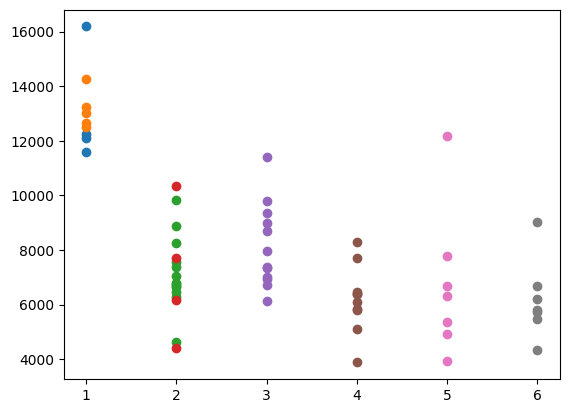

In [59]:
plt.scatter([1]*len(total_mvt[:4]),total_mvt[:4])
plt.scatter([1]*len(total_mvt[8:13]),total_mvt[8:13])
plt.scatter([2]*len(total_mvt[13:26]),total_mvt[13:26])
plt.scatter([2]*len(total_mvt[4:8]),total_mvt[4:8])
plt.scatter([3]*len(total_mvt[26:38]),total_mvt[26:38])
plt.scatter([4]*len(total_mvt[38:48]),total_mvt[38:48])
plt.scatter([5]*len(total_mvt[48:55]),total_mvt[48:55])
plt.scatter([6]*len(total_mvt[55:]),total_mvt[55:])

In [152]:
dist_s1 = []
dist_s2 = []
dist_s3 = []
dist_s4 = []
dist_s5 = []
dist_s6 = []

for i in tqdm(range(len(dataset_list))):
    data_dict = load_dict(dataset_list[i] + "/metadata.pkl")
    distance = total_movement(data_dict['coords']) / pixel_cm
    distance = distance / (data_dict["coords"].shape[0]/17980)
    
    
    if "BH_S1" in dataset_list[i]:
        dist_s1.append(distance)
    elif "BH_S2" in dataset_list[i]:
        dist_s2.append(distance)
    elif "BH_S3" in dataset_list[i]:
        dist_s3.append(distance)
    elif "BH_S4" in dataset_list[i]:
        dist_s4.append(distance)
    elif "BH_S5" in dataset_list[i]:
        dist_s5.append(distance)
    elif "BH_S6" in dataset_list[i]:
        dist_s6.append(distance)
        


  0%|          | 0/62 [00:00<?, ?it/s]

In [153]:
dist_M28 = []
dist_M29 = []
dist_M31 = []
dist_M33 = []
dist_M34 = []
dist_M35 = []
dist_M37 = []
dist_M38 = []
dist_M39 = []
dist_M40 = []
dist_M41 = []
dist_M42 = []
dist_M43 = []
dist_M44 = []

for i in tqdm(range(len(dataset_list))):
    data_dict = load_dict(dataset_list[i] + "/metadata.pkl")
    distance = total_movement(data_dict["coords"]) / pixel_cm
    distance = distance / (data_dict["coords"].shape[0]/17980)

    
    if "M28" in dataset_list[i]:
        dist_M28.append(distance)
    elif "M29" in dataset_list[i]:
        dist_M29.append(distance)
    elif "M31" in dataset_list[i]:
        dist_M31.append(distance)
    elif "M33" in dataset_list[i]:
        dist_M33.append(distance)
    elif "M34" in dataset_list[i]:
        dist_M34.append(distance)
    elif "M35" in dataset_list[i]:
        dist_M35.append(distance)
    elif "M37" in dataset_list[i]:
        dist_M37.append(distance)
    elif "M38" in dataset_list[i]:
        dist_M38.append(distance)
    elif "M39" in dataset_list[i]:
        dist_M39.append(distance)
    elif "M40" in dataset_list[i]:
        dist_M40.append(distance)
    elif "M41" in dataset_list[i]:
        dist_M41.append(distance)
    elif "M42" in dataset_list[i]:
        dist_M42.append(distance)
    elif "M43" in dataset_list[i]:
        dist_M43.append(distance)
    elif "M44" in dataset_list[i]:
        dist_M44.append(distance)

  0%|          | 0/62 [00:00<?, ?it/s]

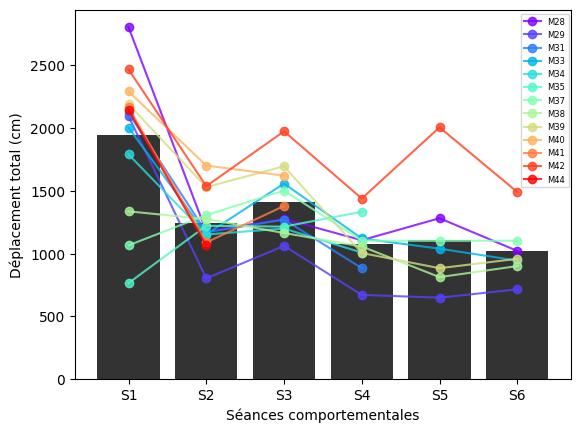

In [154]:
# Create subplots
fig, ax = plt.subplots()

# Define the number of colors
num_colors = 13

# Create a list of colors ranging from red to blue
colors = plt.cm.(np.linspace(0, 1, num_colors))

ax.bar(0,np.mean(dist_s1), color = 'black', alpha=0.8)
ax.bar(1,np.mean(dist_s2), color = 'black', alpha=0.8)
ax.bar(2,np.mean(dist_s3), color = 'black', alpha=0.8)
ax.bar(3,np.mean(dist_s4), color = 'black', alpha=0.8)
ax.bar(4,np.mean(dist_s5), color = 'black', alpha=0.8)
ax.bar(5,np.mean(dist_s6), color = 'black', alpha=0.8)

ax.plot([0,1,2,3,4,5], dist_M28, color = colors[0], marker='o', label= 'M28', alpha=0.8)
ax.plot([0,1,2,3,4,5], dist_M29, color = colors[1], marker='o', label= 'M29', alpha=0.8)
ax.plot([0,1,2,3], dist_M31, color = colors[2], marker='o', label= 'M31', alpha=0.8)
ax.plot([0,1,2,3,4,5], dist_M33, color = colors[3], marker='o', label= 'M33', alpha=0.8)
ax.plot([0,1,2,3], dist_M34, color = colors[4], marker='o', label= 'M34', alpha=0.8)
ax.plot([0,1,2,3], dist_M35, color = colors[5], marker='o', label= 'M35', alpha=0.8)
ax.plot([0,1,2,3,4,5], dist_M37, color = colors[6], marker='o', label= 'M37', alpha=0.8)
ax.plot([0,1,2,3,4,5], dist_M38, color = colors[7], marker='o', label= 'M38', alpha=0.8)
ax.plot([0,1,2,3,4,5], dist_M39, color = colors[8], marker='o', label= 'M39', alpha=0.8)
ax.plot([0,1,2], dist_M40, color = colors[9], marker='o', label= 'M40', alpha=0.8)
ax.plot([0,1,2], dist_M41, color = colors[10], marker='o', label= 'M41', alpha=0.8)
ax.plot([0,1,2,3,4,5], dist_M42, color = colors[11], marker='o', label= 'M42', alpha=0.8)
ax.plot([0,1], dist_M44, color = colors[12], marker='o', label= 'M44', alpha=0.8)


ax.set_xticks([0, 1, 2, 3, 4, 5])
ax.set_xticklabels(['S1', 'S2', 'S3', 'S4', 'S5', 'S6'])
ax.set_xlabel("Séances comportementales")
ax.set_ylabel("Déplacement total (cm)")



# Adjust legend size and placement
legend = ax.legend(prop={'size': 6}, bbox_to_anchor=(0.89, 1), loc='upper left')


plt.show()

In [115]:
length = []
for i in range(len(dataset_list)):
    coord_dict = load_dict(dataset_list[i] + "/metadata.pkl")
    length.append(coord_dict["coords"].shape[0])

In [158]:
def wall_crawling(coord_dict, r, center):
    
    coords = coord_dict['coords']
    
    x, y = coords[:, 0], coords[:, 1]
    cx, cy = center
    
    total_len = coords.shape[0]

    # Calculate the squared distance from the center for each point
    squared_distances = (x - cx)**2 + (y - cy)**2

    # Count the number of points outside the radius
    outside_count = np.sum(squared_distances > r**2)
    
    wall_crawl_ratio = outside_count / total_len * 100

    return wall_crawl_ratio

In [159]:
wall_crawling(coord_dict , r=55 , center=[130,130])

68.44279661016948

In [162]:
# Wall crawling percentage

wc = []
for i in range(len(dataset_list)):
    coord_dict = load_dict(dataset_list[i] + "/metadata.pkl")
    wc.append(wall_crawling(coord_dict, r=55, center=[130,130]))

wc_dist_M28 = []
wc_dist_M29 = []
wc_dist_M31 = []
wc_dist_M33 = []
wc_dist_M34 = []
wc_dist_M35 = []
wc_dist_M37 = []
wc_dist_M38 = []
wc_dist_M39 = []
wc_dist_M40 = []
wc_dist_M41 = []
wc_dist_M42 = []
wc_dist_M43 = []
wc_dist_M44 = []

for i in tqdm(range(len(dataset_list))):
    
    if "M28" in dataset_list[i]:
        wc_dist_M28.append(wc[i])
    elif "M29" in dataset_list[i]:
        wc_dist_M29.append(wc[i])
    elif "M31" in dataset_list[i]:
        wc_dist_M31.append(wc[i])
    elif "M33" in dataset_list[i]:
        wc_dist_M33.append(wc[i])
    elif "M34" in dataset_list[i]:
        wc_dist_M34.append(wc[i])
    elif "M35" in dataset_list[i]:
        wc_dist_M35.append(wc[i])
    elif "M37" in dataset_list[i]:
        wc_dist_M37.append(wc[i])
    elif "M38" in dataset_list[i]:
        wc_dist_M38.append(wc[i])
    elif "M39" in dataset_list[i]:
        wc_dist_M39.append(wc[i])
    elif "M40" in dataset_list[i]:
        wc_dist_M40.append(wc[i])
    elif "M41" in dataset_list[i]:
        wc_dist_M41.append(wc[i])
    elif "M42" in dataset_list[i]:
        wc_dist_M42.append(wc[i])
    elif "M43" in dataset_list[i]:
        wc_dist_M43.append(wc[i])
    elif "M44" in dataset_list[i]:
        wc_dist_M44.append(wc[i])

  0%|          | 0/62 [00:00<?, ?it/s]

In [169]:
wc_dist_s1 = []
wc_dist_s2 = []
wc_dist_s3 = []
wc_dist_s4 = []
wc_dist_s5 = []
wc_dist_s6 = []

for i in tqdm(range(len(dataset_list))):
    
    
    if "BH_S1" in dataset_list[i]:
        wc_dist_s1.append(wc[i])
    elif "BH_S2" in dataset_list[i]:
        wc_dist_s2.append(wc[i])
    elif "BH_S3" in dataset_list[i]:
        wc_dist_s3.append(wc[i])
    elif "BH_S4" in dataset_list[i]:
        wc_dist_s4.append(wc[i])
    elif "BH_S5" in dataset_list[i]:
        wc_dist_s5.append(wc[i])
    elif "BH_S6" in dataset_list[i]:
        wc_dist_s6.append(wc[i])

  0%|          | 0/62 [00:00<?, ?it/s]

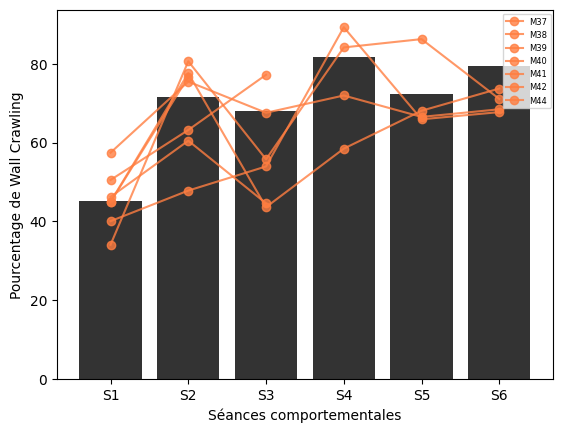

In [184]:
# Create subplots
fig, ax = plt.subplots()

# Define the number of colors
num_colors = 13

# Create a list of colors ranging from red to blue
colors = plt.cm.rainbow(np.linspace(0, 1, num_colors))

ax.bar(0,np.mean(wc_dist_s1), color = 'black', alpha=0.8)
ax.bar(1,np.mean(wc_dist_s2), color = 'black', alpha=0.8)
ax.bar(2,np.mean(wc_dist_s3), color = 'black', alpha=0.8)
ax.bar(3,np.mean(wc_dist_s4), color = 'black', alpha=0.8)
ax.bar(4,np.mean(wc_dist_s5), color = 'black', alpha=0.8)
ax.bar(5,np.mean(wc_dist_s6), color = 'black', alpha=0.8)

ax.plot([0,1,2,3,4,5], wc_dist_M28, color = colors[1], marker='o', label= 'M28', alpha=0.8)
ax.plot([0,1,2,3,4,5], wc_dist_M29, color = colors[1], marker='o', label= 'M29', alpha=0.8)
ax.plot([0,1,2,3], wc_dist_M31, color = colors[1], marker='o', label= 'M31', alpha=0.8)
ax.plot([0,1,2,3,4,5], wc_dist_M33, color = colors[1], marker='o', label= 'M33', alpha=0.8)
ax.plot([0,1,2,3], wc_dist_M34, color = colors[1], marker='o', label= 'M34', alpha=0.8)
ax.plot([0,1,2,3], wc_dist_M35, color = colors[1], marker='o', label= 'M35', alpha=0.8)
ax.plot([0,1,2,3,4,5], wc_dist_M37, color = colors[10], marker='o', label= 'M37', alpha=0.8)
ax.plot([0,1,2,3,4,5], wc_dist_M38, color = colors[10], marker='o', label= 'M38', alpha=0.8)
ax.plot([0,1,2,3,4,5], wc_dist_M39, color = colors[10], marker='o', label= 'M39', alpha=0.8)
ax.plot([0,1,2], wc_dist_M40, color = colors[10], marker='o', label= 'M40', alpha=0.8)
ax.plot([0,1,2], wc_dist_M41, color = colors[10], marker='o', label= 'M41', alpha=0.8)
ax.plot([0,1,2,3,4,5], wc_dist_M42, color = colors[10], marker='o', label= 'M42', alpha=0.8)
ax.plot([0,1], wc_dist_M44, color = colors[10], marker='o', label= 'M44', alpha=0.8)


ax.set_xticks([0, 1, 2, 3, 4, 5])
ax.set_xticklabels(['S1', 'S2', 'S3', 'S4', 'S5', 'S6'])
ax.set_xlabel("Séances comportementales")
ax.set_ylabel("Pourcentage de Wall Crawling")



# Adjust legend size and placement
legend = ax.legend(prop={'size': 6}, bbox_to_anchor=(0.89, 1), loc='upper left')


plt.show()

In [177]:
110**2 / 170**2

0.4186851211072664

# Avg position map for NOR figure

In [13]:
img = tiff.imread('/Users/vincentchouinard/Documents/Maitrise/Behavior/NOR_2min_15mars/Testing/NOR_RMOB_M39/AVG_bg_sub_cropped_video.tif')

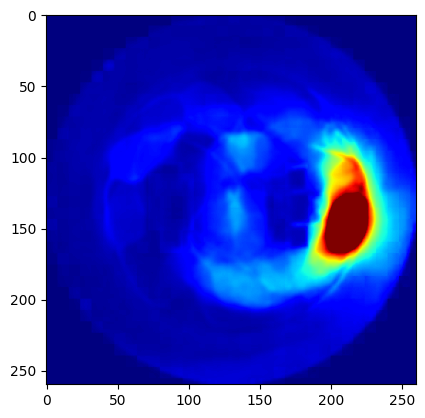

In [38]:
fix,ax=plt.subplots()
plt.imshow(img,cmap='jet', vmin=0, vmax=50)
plt.savefig('/Users/vincentchouinard/Documents/Maitrise/Inkscape_figures/NOR/spacial_field.svg')

# Behavior figures

In [20]:
S_total_mvt = np.zeros(session_stack.shape[2])
M_total_mvt = np.zeros(mouse_stack.shape[2])
for i in range(session_stack.shape[2]):
    S_total_mvt[i] = total_movement(session_stack[:,:,i])
    M_total_mvt[i] = total_movement(mouse_stack[:,:,i])

In [21]:
def behavior_coord_panel_v2(session_stack, session_datainfo, space_between=0.05):
    n_plots = session_stack.shape[2]
    n_cols = 4
    n_rows = int(np.ceil(n_plots / n_cols))

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 3, n_rows * 3))

    # Flatten the axes array for easy indexing
    axes = axes.flatten()

    for i in range(session_stack.shape[2]):
        ax = axes[i]

        xyz = session_stack[:,:,i]
        z = xyz[:,2]  # Assuming this is the corresponding 3rd dimension data

        # Create a Seaborn palette and convert it to a colormap
        n_colors = 256  # Adjust the number of colors
        palette = sns.color_palette("mako", n_colors)
        cmap = mcolors.ListedColormap(palette)
        norm = mcolors.Normalize(vmin=np.min(z), vmax=np.max(z))

        # Prepare line segments and colors
        points = np.array([xyz[:-1, 0], xyz[:-1, 1]]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)
        colors = cmap(norm(z[:-1]))

        # Create a LineCollection
        lc = LineCollection(segments, colors=colors, linewidth=2)

        ax.add_collection(lc)
        ax.autoscale()
        ax.set_xlim([50,210])
        ax.set_ylim([50,210])
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_aspect('equal', adjustable='box')
        ax.set_title("{}".format(session_datainfo[i]['path'].split('/')[-1]))

    # Hide any unused axes
    for ax in axes[n_plots:]:
        ax.axis('off')

    # Adjust the layout to minimize space between subplots and ensure square plots
    plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=space_between+0.1, hspace=space_between)
    plt.show()

    return None

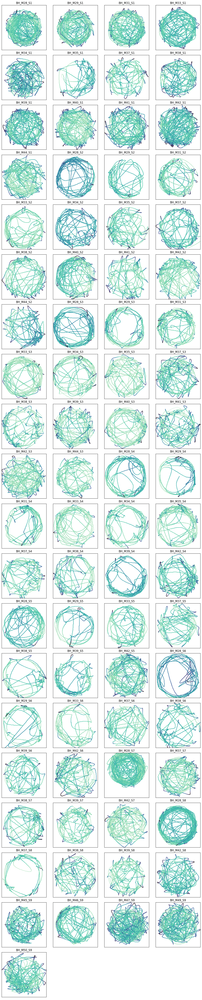

In [20]:
behavior_coord_panel_v2(session_stack, session_datainfo)

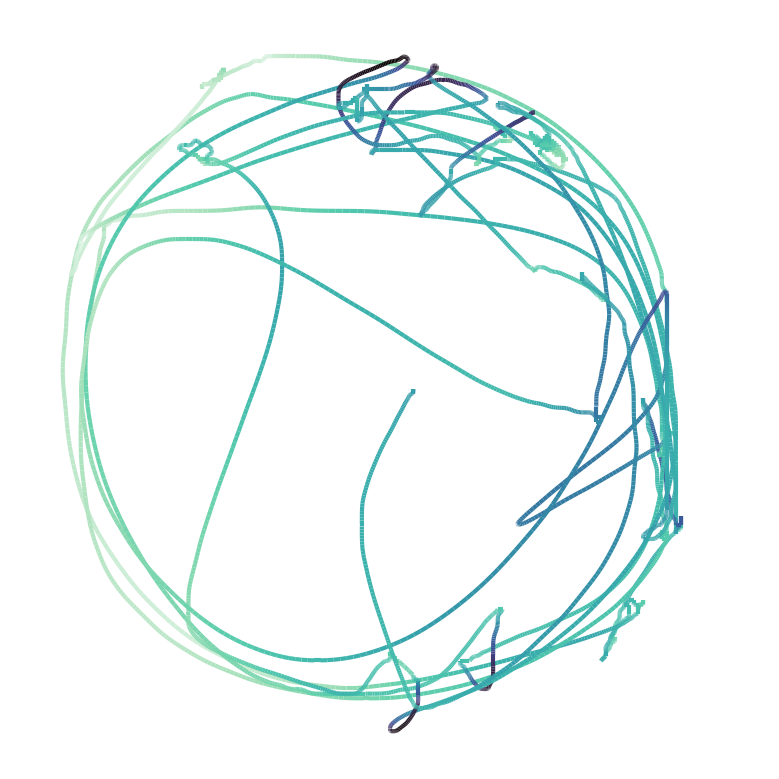

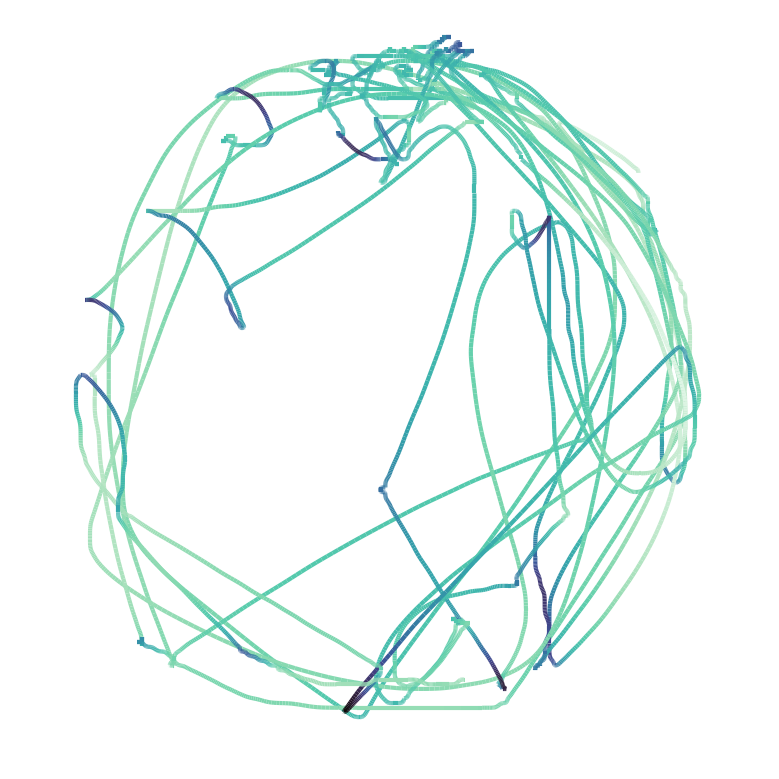

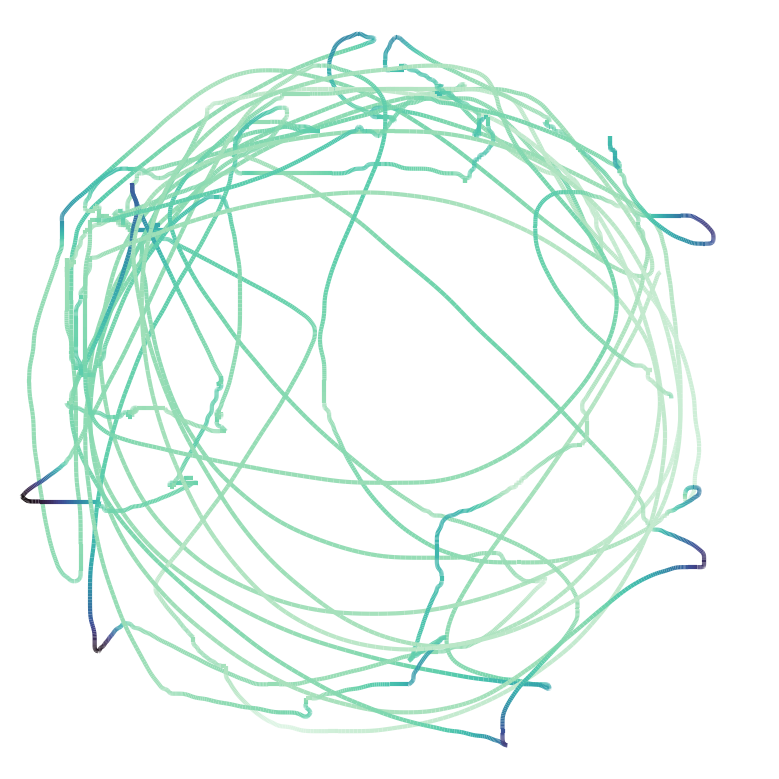

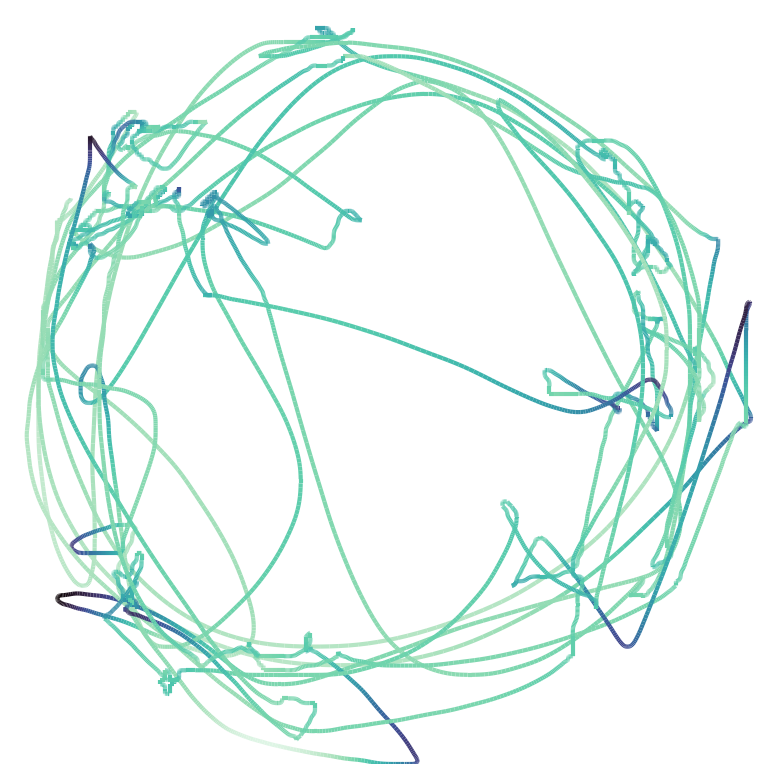

In [40]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from scipy.ndimage import gaussian_filter1d
import seaborn as sns
import matplotlib.colors as mcolors

# Assuming session_stack and session_datainfo are defined

for i in range(4):
    dataset = session_stack[:, :, i+39]
    datainfo = session_datainfo[i+39]

    # Create figure and axis
    fig, ax = plt.subplots(figsize=(5, 5), dpi=150)  # Adjust the figure size as needed

    # Filter dataset
    filtered_dataset = np.zeros(dataset.shape)
    for j in range(dataset.shape[1]):
        filtered_dataset[:, j] = gaussian_filter1d(dataset[:, j], sigma=3)

    xyz = filtered_dataset
    z = xyz[:, 2]  # Assuming this is the corresponding 3rd dimension data

    # Create a Seaborn palette and convert it to a colormap
    n_colors = 256
    palette = sns.color_palette("mako", n_colors)
    cmap = mcolors.ListedColormap(palette)
    norm = mcolors.Normalize(vmin=np.min(z), vmax=np.max(z))

    # Prepare line segments and colors
    points = np.array([xyz[:-1, 0], xyz[:-1, 1]]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)
    colors = cmap(norm(z[:-1]))

    # Create a LineCollection
    lc = LineCollection(segments, colors=colors, linewidth=2)
    ax.add_collection(lc)

    ax.autoscale()
    ax.set_xlim([50, 210])
    ax.set_ylim([50, 210])
    
    # Remove frame
    for spine in ax.spines.values():
        spine.set_visible(False)
    
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal', adjustable='box')
    #ax.set_title("{}".format(datainfo['path'].split('/')[-1]))

    # Adjust the layout to minimize space between subplots and ensure square plots
    plt.subplots_adjust(left=0, bottom=0, right=1, top=1)
    plt.savefig(f"/Users/vincentchouinard/Documents/Maitrise/Inkscape_figures/BH_panel/{datainfo['path'].split('/')[-1]}.png")

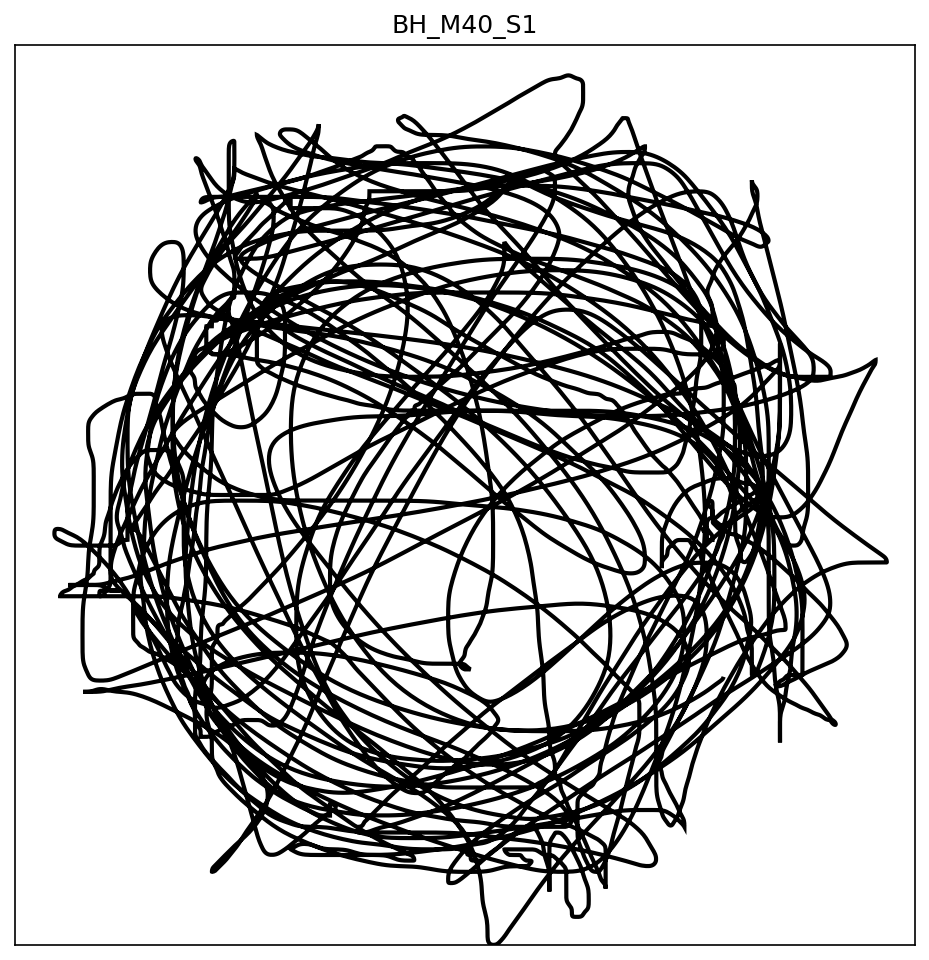

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import PathPatch
from matplotlib.path import Path
from scipy.ndimage import gaussian_filter1d
import seaborn as sns
import matplotlib.colors as mcolors

# Assuming dataset and session_datainfo are defined as provided
dataset = session_stack[:,:,9]
datainfo = session_datainfo[9]

# Apply Gaussian filter to smooth the data
filtered_dataset = np.zeros(dataset.shape)
for i in range(dataset.shape[1]):
    filtered_dataset[:, i] = gaussian_filter1d(dataset[:, i], sigma=3)

xyz = filtered_dataset
z = xyz[:, 2]  # Assuming z-axis data

# Prepare the path
vertices = np.column_stack([xyz[:, 0], xyz[:, 1]])
codes = np.full(len(vertices), Path.LINETO)
codes[0] = Path.MOVETO  # Start of the path

path = Path(vertices, codes)

# Color mapping
n_colors = 256
palette = sns.color_palette("mako", n_colors)
cmap = mcolors.ListedColormap(palette)
norm = mcolors.Normalize(vmin=np.min(z), vmax=np.max(z))
colors = cmap(norm(z))

# Create PathPatch
patch = PathPatch(path, facecolor='none', edgecolor='black', linewidth=2)

# Plotting
fig, ax = plt.subplots(figsize=(6, 6), dpi=150)
ax.add_patch(patch)
ax.set_xlim([50, 210])
ax.set_ylim([50, 210])
ax.set_aspect('equal', adjustable='box')
ax.set_xticks([])
ax.set_yticks([])
ax.set_title(datainfo['path'].split('/')[-1])

plt.subplots_adjust(left=0, bottom=0, right=1, top=1)
#plt.savefig('/Users/vincentchouinard/Documents/Maitrise/Inkscape_figures/BH_setup_experience/BH_M40_S1.svg', format='svg')

In [23]:
for i in range(len(session_datainfo)):
    print(session_datainfo[i]['path'])

/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M28_S1
/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M29_S1
/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M31_S1
/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M33_S1
/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M34_S1
/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M35_S1
/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M37_S1
/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M38_S1
/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M39_S1
/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M40_S1
/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M41_S1
/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M42_S1
/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M44_S1
/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S2/BH_M28_S2
/Users/vincentchouinard/Documents/Maitrise/Behav

In [424]:
#stack = tiff.imread(session_datainfo[9]['path'] + '/cropped_depth.tif')
stack = tiff.imread('/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M28_S1/cropped_video.avi')

TiffFileError: not a TIFF file b'RIFF'

[]

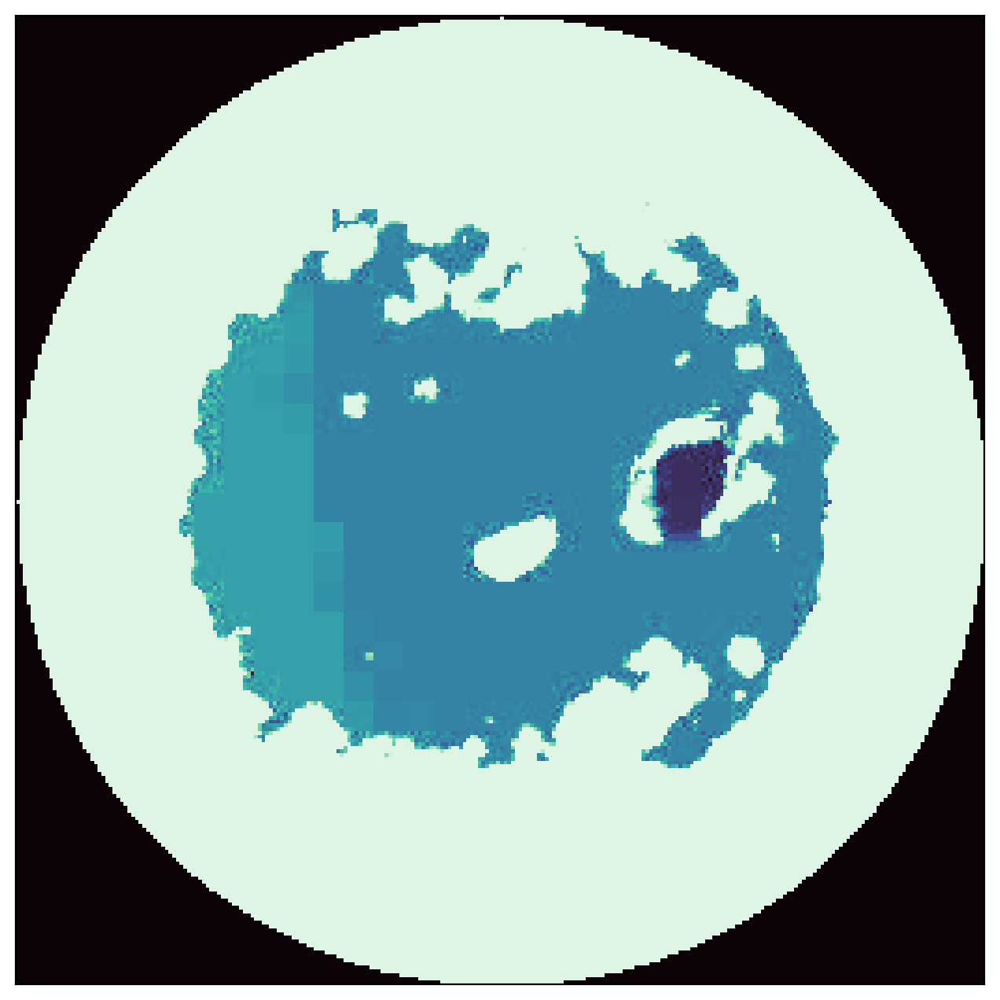

In [19]:
fig,ax = plt.subplots(figsize=(8,8),dpi=200)
plt.imshow(np.mean(stack[-30:,:,:],axis=0),cmap=cmap, vmin=20000,vmax=22500)
ax.set_xticks([])
ax.set_yticks([])
#plt.savefig('/Users/vincentchouinard/Documents/Maitrise/Inkscape_figures/BH_setup_experience/depth_with_cmap.svg')

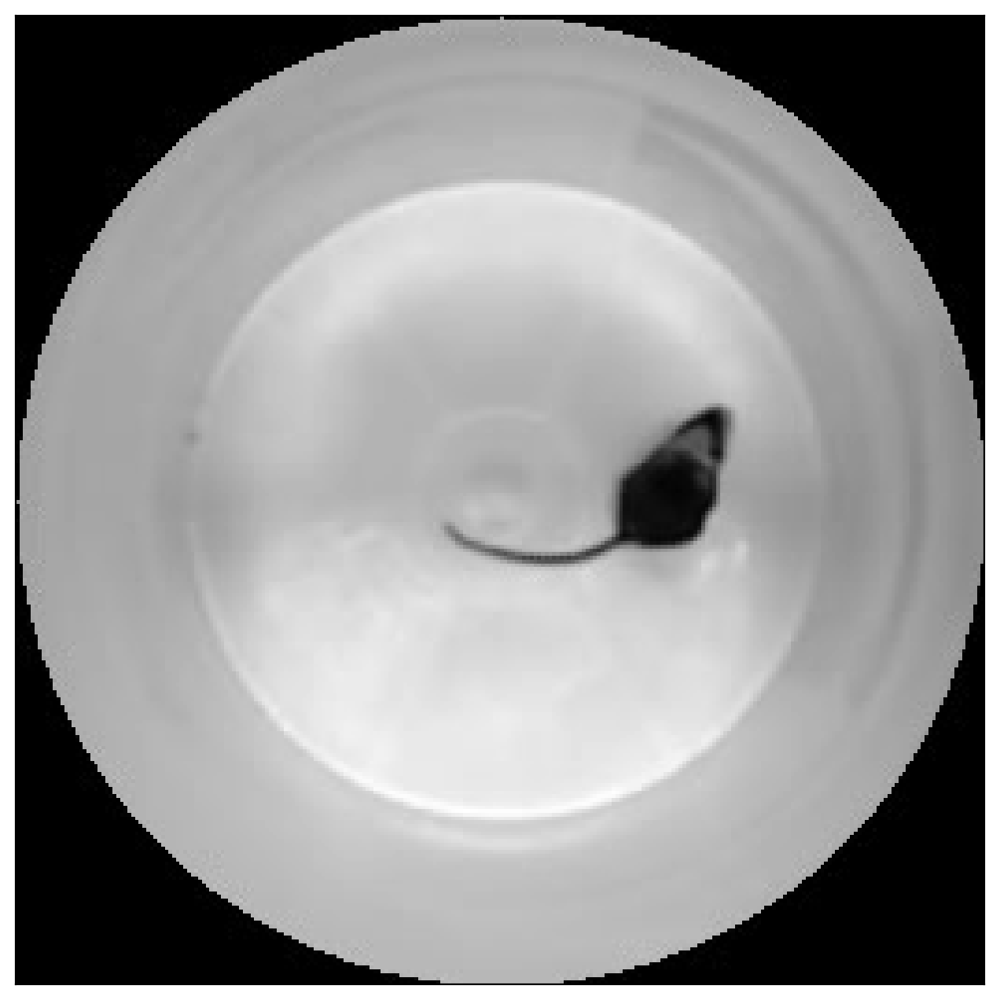

In [155]:
fig,ax = plt.subplots(figsize=(8,8),dpi=200)
plt.imshow(np.mean(stack[-3:,:,:],axis=0),cmap='gray')
ax.set_xticks([])
ax.set_yticks([])
plt.savefig('/Users/vincentchouinard/Documents/Maitrise/Inkscape_figures/BH_setup_experience/video.svg')

65535

In [63]:
depth_color = '#76BD95'

NameError: name 'depth_color' is not defined

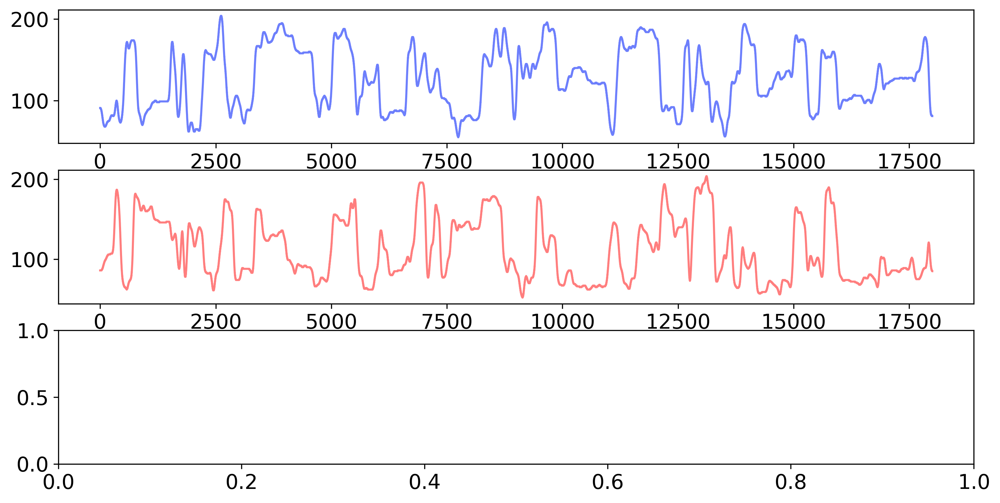

In [262]:
coord = session_stack[:,:,-1]

fig, ax = plt.subplots(3,1, figsize=(12,6),dpi=300)
# Creating a 3x1 subplot layout with more horizontal orientation
#plt.figure(figsize=(12, 6))

# Plotting x(t)
# plt.subplot(3, 1, 1)
ax[0].plot(coord[:,0], color=colors['darkblue'],alpha=0.8)
#plt.title('x(t)')


# Plotting y(t)
# plt.subplot(3, 1, 2)
ax[1].plot(coord[:,1], color=colors['red'],alpha=0.8)
#plt.title('y(t)')

# Plotting z(t)
# plt.subplot(3, 1, 3)
ax[2].plot(coord[:,2], color=depth_color)
#plt.title('z(t)')

# Adjust layout to prevent overlapping
plt.tight_layout()

# Show the plot
plt.show()

In [339]:
session_datainfo

[{'path': '/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S0/BH_M34_S0',
  'session': 0,
  'mouse': 34,
  'index': 0,
  'padding': 14407},
 {'path': '/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S0/BH_M35_S0',
  'session': 0,
  'mouse': 35,
  'index': 1,
  'padding': 14407},
 {'path': '/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S0/BH_M37_S0',
  'session': 0,
  'mouse': 37,
  'index': 2,
  'padding': 14406},
 {'path': '/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S0/BH_M38_S0',
  'session': 0,
  'mouse': 38,
  'index': 3,
  'padding': 14407},
 {'path': '/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M28_S1',
  'session': 1,
  'mouse': 28,
  'index': 4,
  'padding': 20},
 {'path': '/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M29_S1',
  'session': 1,
  'mouse': 29,
  'index': 5,
  'padding': 20},
 {'path': '/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M31_S1',
  'session': 1,
  'mouse': 31,
  'index': 6

In [74]:
coord = session_stack[:,:,4]

NameError: name 'session_stack' is not defined

NameError: name 'depth_color' is not defined

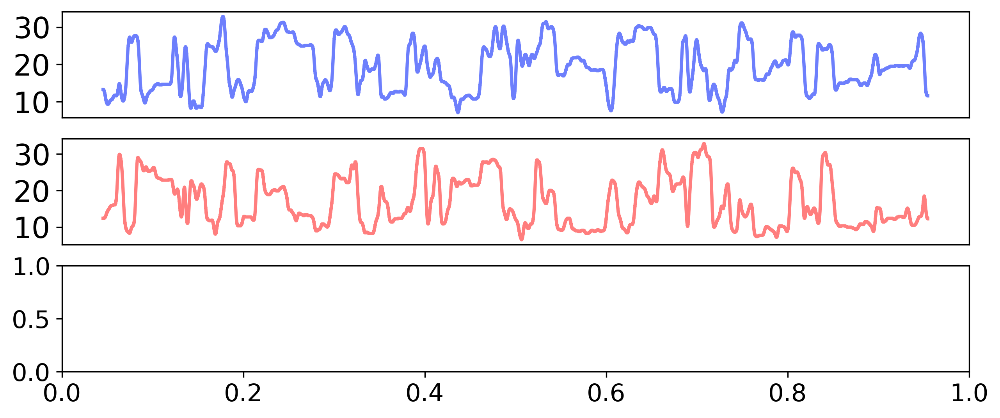

In [261]:
coord = session_stack[:, :, -1]  # Assuming session_stack is predefined
labelsize = 18

fig, ax = plt.subplots(3, 1, figsize=(10, 4), dpi=300)

# Plotting x(t)
ax[0].plot(coord[:, 0]/pixel_cm - 2.5, color=colors['darkblue'], alpha=0.8, linewidth=2)
ax[0].set_xticks([])  # Remove x-ticks
ax[0].tick_params(axis='both', labelsize=labelsize)  # Upsize the font of the ticks

# Plotting y(t)
ax[1].plot(coord[:, 1]/pixel_cm - 2.5, color=colors['red'], alpha=0.8, linewidth=2)
ax[1].set_xticks([])  # Remove x-ticks
ax[1].tick_params(axis='both', labelsize=labelsize)  # Upsize the font of the ticks

# Plotting z(t)
ax[2].plot(coord[:, 2], color=depth_color, linewidth=2)
ax[2].set_xticks([])  # Remove x-ticks
ax[2].tick_params(axis='both', labelsize=labelsize)  # Upsize the font of the ticks

# Adjust layout to prevent overlapping
plt.tight_layout()

# Optionally, adjust subplots spacing manually if needed
fig.subplots_adjust(hspace=0.1)  # Increase horizontal space

ax[0].set_xlim([0,18000])
ax[1].set_xlim([0,18000])
ax[2].set_xlim([0,18000])

# Show the plot
plt.savefig('/Users/vincentchouinard/Desktop/timeseries.svg')

# Event-Vector

In [471]:
actions_intervals_complete = [
    ("W", 0, 155), ("R", 155, 192), ("W", 192, 240), ("R", 240, 287),
    ("W", 287, 388), ("R", 388, 434), ("W", 434, 800), ("R", 800, 850),
    ("W", 850, 927), ("R", 927, 966), ("W", 966, 1010), ("S", 1010, 1025),
    ("W", 1025, 1060), ("R", 1060, 1103), ("W", 1103, 1536), ("R", 1536, 1560),
    ("S", 1560, 1586), ("W", 1586, 1646), ("S", 1646, 1670), ("R", 1670, 1710),
    ("S", 1710, 1748), ("W", 1748, 1830), ("G", 1830, 1923), ("W", 1923, 2088),
    ("R", 2088, 2144), ("G", 2144, 2200), ("W", 2200, 2500), ("G", 2500, 2530),
    ("R", 2530, 2570), ("W", 2570, 2743), ("R", 2743, 2797), ("W", 2797, 2930),
    ("R", 2930, 2980), ("W", 2980, 3100), ("S", 3100, 3120), ("W", 3120, 3150),
    ("R", 3150, 3200), ("W", 3200, 3538), ("S", 3538, 3570), ("R", 3570, 3610),
    ("W", 3610, 3680), ("G", 3680, 3710), ("W", 3710, 3794), ("G", 3794, 3830),
    ("W", 3830, 3920), ("R", 3920, 3970), ("W", 3970, 4078), ("S", 4078, 4114),
    ("W", 4114, 4170), ("W", 4170, 4220), ("S", 4220, 4345), ("W", 4345, 4420),
    ("R", 4420, 4460), ("W", 4460, 4515), ("G", 4515, 4625), ("W", 4625, 4735),
    ("G", 4735, 4950), ("R", 4950, 4990), ("W", 4990, 5095), ("R", 5095, 5135),
    ("W", 5135, 5185), ("R", 5185, 5235), ("W", 5235, 5300), ("R", 5300, 5380),
    ("W", 5380, 5765), ("R", 5765, 5810), ("W", 5810, 5990), ("S", 5990, 6025),
    ("W", 6025, 6040), ("R", 6040, 6100), ("W", 6100, 6870), ("R", 6870, 6900),
    ("W", 6900, 7020), ("R", 7020, 7070), ("S", 7070, 7152), # page 1 
    
    ("W", 7152, 7283), ("R", 7283, 7315), ("S", 7315, 7345), ("W", 7345, 7465),
    ("R", 7465, 7515), ("W", 7515, 7582), ("R", 7582, 7620), ("W", 7620, 7977),
    ("R", 7977, 8034), ("S", 8034, 8067), ("W", 8067, 8650), ("R", 8650, 8720),
    ("W", 8720, 8792), ("R", 8792, 8866), ("W", 8866, 9078), ("R", 9078, 9120),
    ("W", 9120, 9135), ("S", 9135, 9151), ("W", 9151, 9185), ("R", 9185, 9225),
    ("W", 9225, 9510), ("R", 9510, 9545), ("W", 9545, 9670), ("S", 9670, 9693),
    ("W", 9693, 9853), ("S", 9853, 9900), ("W", 9900, 9922), ("S", 9922, 9980),
    ("W", 9980, 10015), ("S", 10015, 10051), ("W", 10051, 10410), ("G", 10410, 10585),
    ("W", 10585, 10935), ("G", 10935, 11007), ("W", 11007, 11037), ("S", 11037, 11055),
    ("W", 11055, 11237), ("R", 11237, 11301), ("W", 11301, 11380), ("R", 11380, 11427),
    ("S", 11427, 11446), ("G", 11446, 11488), ("W", 11488, 11748), ("R", 11748, 11786),
    ("W", 11786, 11958), ("S", 11958, 12005), ("W", 12005, 12253), ("S", 12253, 12318),
    ("R", 12318, 12352), ("W", 12352, 12393), ("S", 12393, 12419), ("R", 12419, 12484),
    ("S", 12484, 12531), ("W", 12531, 12565), ("S", 12565, 12609), ("R", 12609, 12702),
    ("W", 12702, 12790), ("S", 12790, 12866), ("R", 12866, 12939), ("W", 12939, 13025),
    ("W", 13025, 13245), ("R", 13245, 13277), ("W", 13277, 13379), ("R", 13379, 13440),
    ("W", 13440, 13485), ("R", 13485, 13547), ("W", 13547, 13654), ("R", 13654, 13700),
    ("S", 13700, 13791), ("W", 13791, 13927), ("R", 13927, 13970), ("S", 13970, 14035),
    ("W", 14035, 14335), ("S", 14335, 14365), ("W", 14365, 14385), ("R", 14385, 14430),
    ("W", 14430, 14500), ("R", 14500, 14560), ("W", 14560, 14648), #page2
    
    ("S", 14648, 14726), ("W", 14726, 14976), ("S", 14976, 15005), ("G", 15005, 15040),
    ("S", 15040, 15115), ("W", 15115, 15210), ("S", 15210, 15270), ("W", 15270, 15425),
    ("S", 15425, 15532), ("W", 15532, 15608), ("S", 15608, 15770), ("W", 15770, 15795),
    ("S", 15795, 15853), ("W", 15853, 16026), ("S", 16026, 16178), ("W", 16178, 16330),
    ("S", 16330, 16418), ("W", 16418, 16497), ("S", 16497, 16582), ("W", 16582, 16653),
    ("G", 16653, 16723), ("S", 16723, 16755), ("W", 16755, 16790), ("G", 16790, 17150),
    ("W", 17150, 17276), ("S", 17276, 17328), ("W", 17328, 17596), ("R", 17596, 17671),
    ("S", 17671, 17720), ("W", 17720, 17904), ("S", 17904, 17934), ("W", 17934, 17980)  # Assuming 17980 is the last index needed
]

# Créons l'array avec la bonne taille, l'indice maximal étant 17980.
mouse_array_complete = list(np.zeros(17980))

# Maintenant, remplissons l'array avec les bons numéros pour l'ensemble des actions.
for action, start, end in actions_intervals_complete:
    # Assignons les numéros correspondants aux actions.
    number = 1 if action == "W" else 2 if action == "S" else 3 if action == "G" else 4
    # Remplissons les indices avec le numéro correspondant pour les intervalles.
    for i in range(start, end):  # +1 pour inclure l'indice de fin.
        mouse_array_complete[i] = number
        
manual_event = np.array(mouse_array_complete) -1

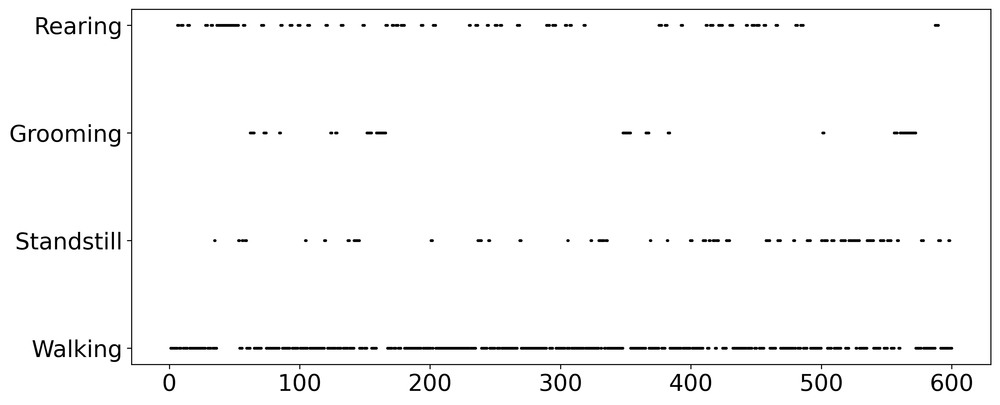

In [4]:
fig,ax=plt.subplots(figsize=(12,5), dpi=300)
plt.scatter(np.linspace(1,600,17980) , manual_event , s=1 , color='black')
ax.set_yticks([1,2,3,4])
ax.set_yticklabels(['Walking', 'Standstill', 'Grooming', 'Rearing'], fontsize=18)
ax.tick_params(axis='x', labelsize=18)
#ax.set_xticklabels(fontsize=18)
plt.show()

# Circularity

In [3]:
from skimage.measure import label, regionprops

def compute_circularity(dataset_path):
    mask_stack_path = dataset_path + "/" + "mask_video.tif"
    
    with tiff.TiffFile(mask_stack_path) as tif:
        # Get the number of frames in the stack
        n_frames = len(tif.pages)

        # Initialize an array to store the centroid coordinates
        circularity = np.zeros(n_frames, dtype=np.float32)

        # Process the stack frame by frame
        for i in range(n_frames):
            # Read the current frame
            binary_image = tif.pages[i].asarray()
    
            # Étiquete les régions connectées dans l'image
            labeled_image = label(binary_image)

            # Calcule les propriétés de ces régions
            regions = regionprops(labeled_image)

            # Trouve la région avec la plus grande aire
            largest_region = max(regions, key=lambda r: r.area)

            # Calcule le rapport de l'axe majeur sur l'axe mineur pour cette région
            circularity[i] = largest_region.major_axis_length / largest_region.minor_axis_length
    
    return circularity

In [1]:
# paper sur le bh et les vecteurs d'évènements

# https://sci-hub.yncjkj.com/10.1109/BioCAS.2015.7348456

In [6]:
event_datapath = '/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M28_S1'
circ = compute_circularity(event_datapath)
filtered_circ = gaussian_filter1d(circ,sigma=3)

# Test with threshold optimization

In [251]:
# Optimizing functions

def compute_metrics(dataset_path):
    # Load the coordinate data
    coord_dict = load_dict(dataset_path + "/metadata.pkl")
    coords = coord_dict['coords']
    
    # Compute velocity
    velocity = gaussian_filter1d(np.sqrt(np.diff(coords[:,0], axis=0)**2 + np.diff(coords[:,1], axis=0)**2), sigma=3)
    velocity = np.append(velocity, velocity[-1])  # Extend to match coords length
    
    # Compute circularity (assuming compute_circularity function exists and works correctly)
    circularity = gaussian_filter1d(compute_circularity(dataset_path),sigma=3)
    
    # Compute normalized depth
    depth = coords[:,2]
    norm_depth = -depth + np.max(depth)
    baseline_depth = baseline_minfilter(norm_depth, window=1500)
    bs_norm_depth = norm_depth - baseline_depth

    return velocity, circularity, bs_norm_depth

def classify_events(velocity, circularity, bs_norm_depth, thresholds, events):
    vector_length = len(velocity)
    event_vector = np.zeros(vector_length)
    event_indices = {event: idx + 1 for idx, event in enumerate(events)}
    
    # event discrimination loop
    for i in range(vector_length):
            
        if 'walking' in events:
            if velocity[i] > thresholds[0]:
                event_vector[i] = event_indices['walking']
                
        if 'standstill' in events:
            if velocity[i] <= thresholds[0]:
                event_vector[i] = event_indices['standstill']
                
        if 'grooming' in events:
            if circularity[i] < thresholds[2]:
                event_vector[i] = event_indices['grooming']

        if 'rearing' in events:
            if bs_norm_depth[i] > thresholds[1]:
                    event_vector[i] = event_indices['rearing']
                    


    return event_vector


def optimize_single_threshold(velocity, circularity, bs_norm_depth, manual_event, fixed_thresholds, index_to_optimize, range_and_step):
    best_score = -np.inf
    best_threshold = fixed_thresholds[index_to_optimize]
    
    for threshold in np.arange(range_and_step[0], range_and_step[1], range_and_step[2]):
        current_thresholds = fixed_thresholds[:]
        current_thresholds[index_to_optimize] = threshold
        computed_event = classify_events(velocity, circularity, bs_norm_depth, current_thresholds, ['walking', 'standstill', 'grooming', 'rearing'])
        score = calculate_metric(manual_event, computed_event)
        
        if score > best_score:
            best_score = score
            best_threshold = threshold
    
    return best_threshold, best_score


def calculate_metric(ground_truth, result):
    return np.where(ground_truth-result == 0)[0].shape[0] / result.shape[0]


def sequential_optimization(dataset_path, manual_event, initial_thresholds, threshold_ranges):
    # Compute metrics once
    velocity, circularity, bs_norm_depth = compute_metrics(dataset_path)
    
    current_thresholds = initial_thresholds[:]
    for i in range(len(current_thresholds)):
        print(f"Optimizing threshold {i+1}")
        best_threshold, best_score = optimize_single_threshold(velocity, circularity, bs_norm_depth, manual_event, current_thresholds, i, threshold_ranges[i])
        current_thresholds[i] = best_threshold
        print(f"Best threshold for index {i+1}: {best_threshold}, Score: {best_score}")
    
    return current_thresholds


# Example usage
dataset_path = event_datapath
initial_thresholds = [0.25, 0.65, 1.35]  # Initial guesses for thresholds
threshold_ranges = [(0.1, 0.5, 0.001), (0.3, 0.7, 0.001), (1.0, 2.0, 0.001)]

optimized_thresholds = sequential_optimization(dataset_path, manual_event, initial_thresholds, threshold_ranges)
print("Optimized Thresholds:", optimized_thresholds)

Optimizing threshold 1
Best threshold for index 1: 0.23900000000000013, Score: 0.768075639599555
Optimizing threshold 2
Best threshold for index 2: 0.5650000000000002, Score: 0.7708565072302559
Optimizing threshold 3
Best threshold for index 3: 1.3479999999999617, Score: 0.7710789766407119
Optimized Thresholds: [0.23900000000000013, 0.5650000000000002, 1.3479999999999617]


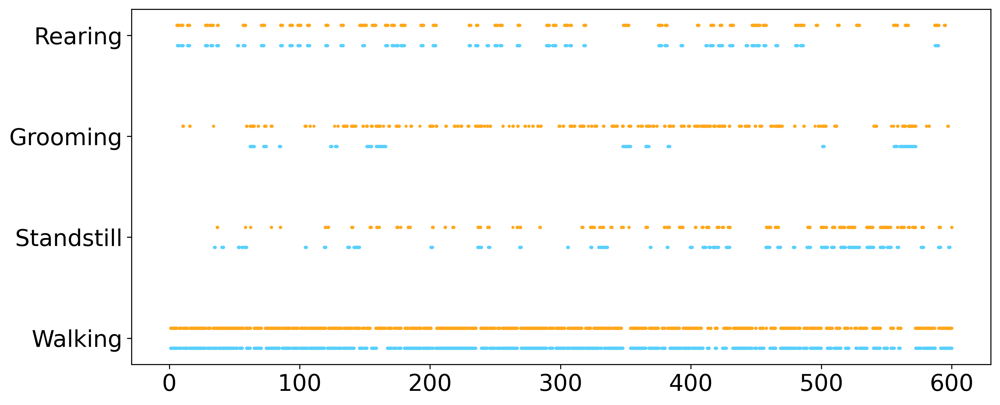

In [201]:
fig,ax=plt.subplots(figsize=(12,5), dpi=300)
plt.scatter(np.linspace(1,600,17980) , manual_event - 0.1 , s=2 , color=colors['blue'])
plt.scatter(np.linspace(1,600,17980) , event + 0.1 , s=2 , color=colors['orange'])
ax.set_yticks([1,2,3,4])
ax.set_yticklabels(['Walking', 'Standstill', 'Grooming', 'Rearing'], fontsize=18)
ax.tick_params(axis='x', labelsize=18)
#ax.set_xticklabels(fontsize=18)
plt.show()

In [7]:
from scipy.ndimage import gaussian_filter1d, minimum_filter1d

def baseline_minfilter(signal, window=300, sigma1=5, sigma2=100, debug=False):
    signal_flatstart = np.copy(signal)
    signal_flatstart[0] = signal[1]
    smooth = gaussian_filter1d(signal_flatstart, sigma1)
    mins = minimum_filter1d(smooth, window)
    baseline = gaussian_filter1d(mins, sigma2)
    if debug:
        debug_out = np.asarray([smooth, mins, baseline])
        return debug_out
    else:
        return baseline

# Training Testing d'un SVM

# Creating X

In [21]:
event_datapath = '/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M28_S1'
coords_dict = load_dict(event_datapath + '/metadata.pkl')
coords = coords_dict['coords']

circ = compute_circularity(event_datapath)
filtered_circ = gaussian_filter1d(circ,sigma=3)


# Necessary informations to discriminate events
velocity = gaussian_filter1d(np.sqrt(np.diff(coords[:,0], axis=0)**2 + np.diff(coords[:,1], axis=0)**2),sigma=3)
velocity = np.append(velocity, velocity[-1])

depth = coords[:,2]
norm_depth = -depth + np.max(depth)
baseline_depth = baseline_minfilter(norm_depth, window=1500)
bs_norm_depth = norm_depth - baseline_depth


X = np.column_stack((velocity, filtered_circ, bs_norm_depth))

scaler = StandardScaler()
X = scaler.fit_transform(X)

#normalized features
#norm_velocity = min_max_normalize(velocity)
#norm_circularity = min_max_normalize(filtered_circ)
#norm_depth = min_max_normalize(bs_norm_depth)

In [452]:
import numpy as np
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import StandardScaler

# Assuming you have velocity, circularity, bs_norm_depth, and manual_events defined
# Normalize your features using StandardScaler or any preferred method
scaler = StandardScaler()

# X is obtained in the cell above.
X = scaler.fit_transform(X)  # Normalize the feature matrix
y = manual_event  # Your manually labeled events

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Create an SVM classifier with a radial basis function kernel using the best parameters
svm_classifier = SVC(kernel='rbf', C=10, gamma=1)

# Train the SVM classifier
svm_classifier.fit(X_train, y_train)

# Predict the labels on the test set
y_pred = svm_classifier.predict(X_test)

# Evaluate the classifier
print("Classification Report:")
print(classification_report(y_test, y_pred))
print("Accuracy:", accuracy_score(y_test, y_pred))

Classification Report:
              precision    recall  f1-score   support

           1       0.82      0.94      0.88      3492
           2       0.71      0.47      0.57       710
           3       0.73      0.54      0.62       367
           4       0.83      0.65      0.73       825

    accuracy                           0.81      5394
   macro avg       0.77      0.65      0.70      5394
weighted avg       0.80      0.81      0.80      5394

Accuracy: 0.8088616981831664


# Results with SVM 

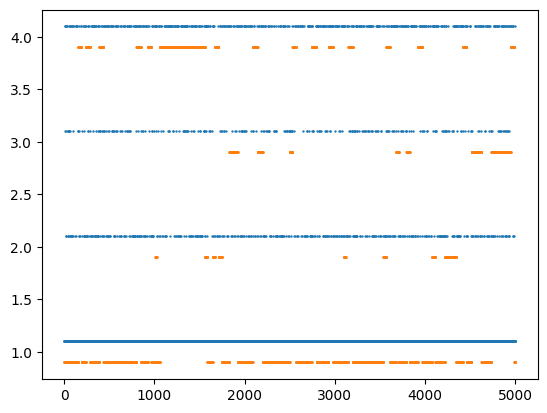

In [447]:
plt.scatter(np.linspace(0,5000,5000),y_pred[0:5000]+0.1, s=0.5)
#plt.scatter(np.linspace(0,5000,5000),medfilt(y_pred[0:5000],kernel_size=7), s=0.5)
plt.scatter(np.linspace(0,5000,5000),manual_event[0:5000]-0.1, s=0.5)

# Testing with a machine learning approach

In [4]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

2024-04-29 10:39:24.715377: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [428]:
# Normaliser les données
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y-1, test_size=0.3, random_state=42)

In [429]:
model = Sequential([
    Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    Dropout(0.5),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(len(np.unique(y)), activation='softmax')  # Utilisez softmax pour la classification multi-classes
])

model.compile(optimizer=Adam(), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [430]:
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2)

Epoch 1/50
315/315 [==============================] - 1s 2ms/step - loss: 0.8327 - accuracy: 0.7077 - val_loss: 0.6886 - val_accuracy: 0.7609
Epoch 2/50
315/315 [==============================] - 1s 2ms/step - loss: 0.7322 - accuracy: 0.7427 - val_loss: 0.6657 - val_accuracy: 0.7744
Epoch 3/50
315/315 [==============================] - 0s 2ms/step - loss: 0.7075 - accuracy: 0.7538 - val_loss: 0.6509 - val_accuracy: 0.7832
Epoch 4/50
315/315 [==============================] - 0s 1ms/step - loss: 0.6942 - accuracy: 0.7595 - val_loss: 0.6422 - val_accuracy: 0.7804
Epoch 5/50
315/315 [==============================] - 1s 2ms/step - loss: 0.6864 - accuracy: 0.7661 - val_loss: 0.6364 - val_accuracy: 0.7836
Epoch 6/50
315/315 [==============================] - 0s 2ms/step - loss: 0.6780 - accuracy: 0.7674 - val_loss: 0.6322 - val_accuracy: 0.7855
Epoch 7/50
315/315 [==============================] - 0s 2ms/step - loss: 0.6706 - accuracy: 0.7695 - val_loss: 0.6277 - val_accuracy: 0.7911
Epoch 

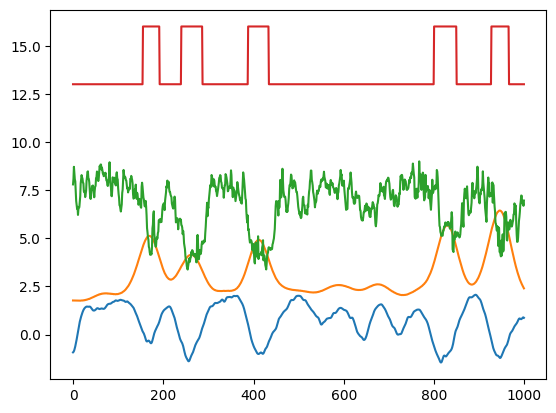

In [450]:
plt.plot(X[0:1000,0])
plt.plot(X[0:1000,2]+ 3)
plt.plot(X[0:1000,1]+ 6)
#plt.plot(X[:,2])
plt.plot(manual_event[0:1000]+12)

# Discussion avec Patrick: Je devrais peut-être lui feed des blocs de timeseries pis downsample mon vidéo à plus petit, genre 0.3s par état au lieu d'essayer de lui faire deviner les états avec juste 3 points...

# Tests avec blocs

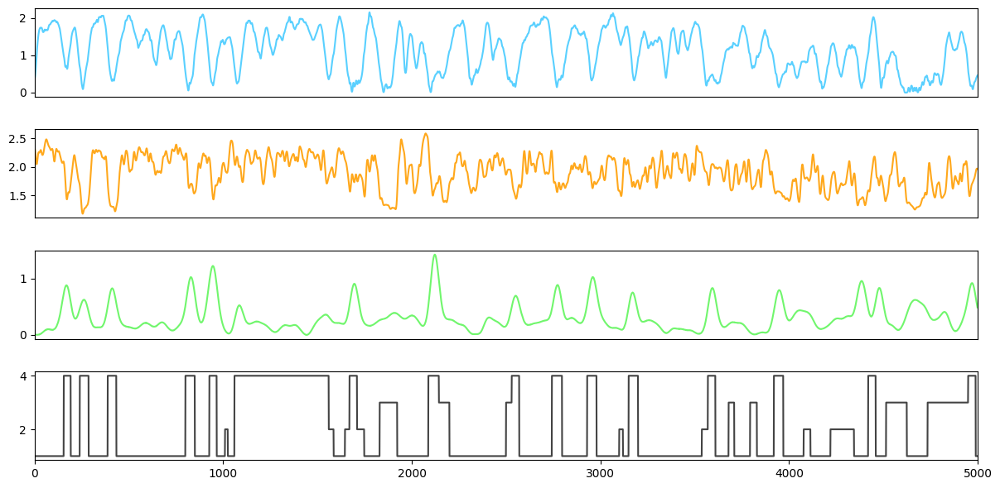

In [577]:
fig, ax = plt.subplots(4,1,figsize=(12,6))
ax[0].plot(X[:5000,0], color=colors['blue'])
ax[1].plot(X[:5000,1], color=colors['orange'])
ax[2].plot(X[:5000,2], color=colors['green'])
ax[3].plot(manual_event[:5000], color=colors['black'])

plt.tight_layout()
ax[0].set_xlim([0,5000])
ax[1].set_xlim([0,5000])
ax[2].set_xlim([0,5000])
ax[3].set_xlim([0,5000])

ax[0].set_xticks([])
ax[1].set_xticks([])
ax[2].set_xticks([])

# Show the plot
plt.show()

In [9]:
from scipy.stats import mode

def calculate_mode_per_block(data, time_steps=10):
    # Nombre de blocs complets que l'on peut former
    num_blocks = data.shape[0] // time_steps
    
    # Initialiser un array pour stocker le mode de chaque bloc
    mode_values = np.zeros(num_blocks, dtype=int)
    
    # Calculer le mode pour chaque bloc
    for i in range(num_blocks):
        start_index = i * time_steps
        end_index = start_index + time_steps
        block = data[start_index:end_index]
        
        # Calculer le mode pour le bloc actuel
        mode_value, count = mode(block, axis=None)
        mode_values[i] = mode_value[0]  # mode renvoie un objet ModeResult, nous voulons le mode réel
    
    return mode_values

In [10]:
block_events = calculate_mode_per_block(manual_event) - 1 # Pas le choix de soustraire 1 pour le training

/var/folders/w6/s9qjh5156jg5p8dh9sd4bysr0000gn/T/ipykernel_53950/1863267893.py:17: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode_value, count = mode(block, axis=None)


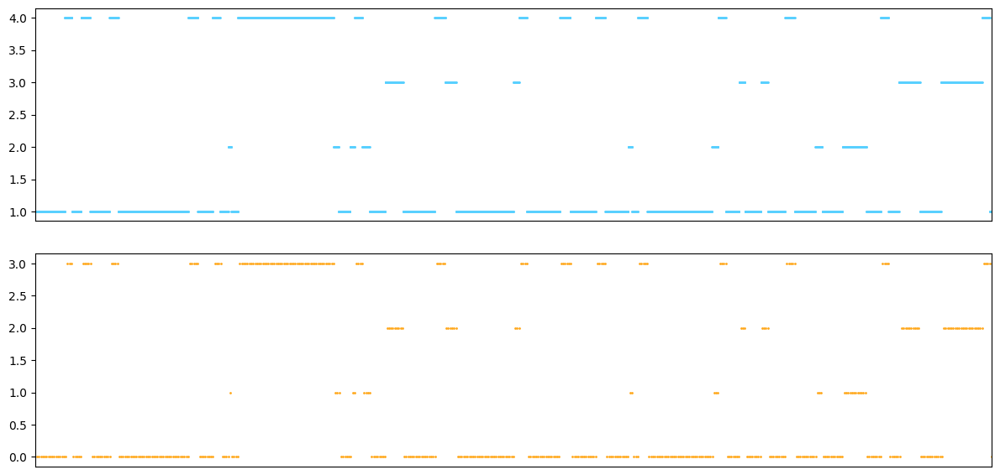

In [13]:
fig, ax = plt.subplots(2,1,figsize=(12,6))
ax[0].scatter(np.linspace(1,5000,5000), manual_event[:5000], color=colors['blue'], s=1)
ax[1].scatter(np.linspace(1,500,500), block_events[:500], color=colors['orange'], s=1)


plt.tight_layout()
ax[0].set_xlim([0,5000])
ax[1].set_xlim([0,500])

ax[0].set_xticks([])
ax[1].set_xticks([])


# Show the plot
plt.show()

In [16]:
import numpy as np
from sklearn.model_selection import train_test_split

def apply_gaussian_filter(X, sigma=1):
    """
    Applique un filtre gaussien sur chaque série temporelle dans la dimension 0 de l'array X.
    
    Parameters:
    X (numpy.ndarray): L'array de données à filtrer. Assumé d'être de forme (t, features).
    sigma (float): L'écart-type pour le filtre gaussien, qui détermine le degré de lissage.
    
    Returns:
    numpy.ndarray: L'array filtré.
    """
    # Appliquer le filtre gaussien pour chaque colonne indépendamment
    X_filtered = np.array([gaussian_filter1d(X[:, i], sigma=sigma) for i in range(X.shape[1])])
    
    # Transposer le résultat pour remettre les features en colonnes
    return X_filtered.T

# Fonction pour redimensionner X en blocs de 10x3
def reshape_X_for_CNN(X, time_steps=10):
    # Assurez-vous que la longueur de X est divisible par time_steps
    num_complete_blocks = X.shape[0] // time_steps
    X_cropped = X[:num_complete_blocks * time_steps]
    X_reshaped = X_cropped.reshape(-1, time_steps, 3, 1)  # Ajout d'une dimension pour les canaux
    return X_reshaped

X_filt = apply_gaussian_filter(X,sigma=3.5)
block_features = reshape_X_for_CNN(X_filt)

NameError: name 'X' is not defined

In [594]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Division en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(block_features, block_events, test_size=0.3, random_state=42)

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Flatten, Dense

model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(10, 3, 1)),
    Conv2D(64, (3, 1), activation='relu'),
    Flatten(),
    Dense(64, activation='relu'),
    Dense(4, activation='softmax')  # Assumant 4 états possibles
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])


# Callback pour l'arrêt précoce pour éviter le surajustement
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Callback pour réduire le taux d'apprentissage si la perte de validation ne s'améliore pas
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.001)

# Augmenter le nombre d'époches car EarlyStopping peut arrêter l'entraînement prématurément
# Réduire la taille du batch pour augmenter la généralisation et ajuster l'apprentissage
history = model.fit(
    X_train, y_train, 
    epochs=100,  # Augmentation du nombre d'époches
    validation_split=0.2, 
    batch_size=16,  # Réduction de la taille du batch
    callbacks=[early_stopping, reduce_lr]  # Utilisation des callbacks
)

# Évaluation sur l'ensemble de test
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Loss: {loss}, Accuracy: {accuracy}")

Epoch 1/100
63/63 [==============================] - 1s 4ms/step - loss: 0.9168 - accuracy: 0.6581 - val_loss: 0.7118 - val_accuracy: 0.7302 - lr: 0.0010
Epoch 2/100
63/63 [==============================] - 0s 2ms/step - loss: 0.7579 - accuracy: 0.7247 - val_loss: 0.6804 - val_accuracy: 0.7579 - lr: 0.0010
Epoch 3/100
63/63 [==============================] - 0s 2ms/step - loss: 0.7253 - accuracy: 0.7545 - val_loss: 0.6742 - val_accuracy: 0.7579 - lr: 0.0010
Epoch 4/100
63/63 [==============================] - 0s 3ms/step - loss: 0.7046 - accuracy: 0.7614 - val_loss: 0.6579 - val_accuracy: 0.7659 - lr: 0.0010
Epoch 5/100
63/63 [==============================] - 0s 3ms/step - loss: 0.6977 - accuracy: 0.7654 - val_loss: 0.6693 - val_accuracy: 0.7778 - lr: 0.0010
Epoch 6/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6938 - accuracy: 0.7684 - val_loss: 0.6460 - val_accuracy: 0.7778 - lr: 0.0010
Epoch 7/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6

Epoch 54/100
63/63 [==============================] - 0s 3ms/step - loss: 0.6150 - accuracy: 0.7863 - val_loss: 0.6002 - val_accuracy: 0.7937 - lr: 0.0010
Epoch 55/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6067 - accuracy: 0.7932 - val_loss: 0.6210 - val_accuracy: 0.7857 - lr: 0.0010
Epoch 56/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6140 - accuracy: 0.7873 - val_loss: 0.5984 - val_accuracy: 0.7897 - lr: 0.0010
Epoch 57/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6069 - accuracy: 0.7932 - val_loss: 0.6036 - val_accuracy: 0.7778 - lr: 0.0010
Epoch 58/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6140 - accuracy: 0.7883 - val_loss: 0.6039 - val_accuracy: 0.7897 - lr: 0.0010
Epoch 59/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6137 - accuracy: 0.7903 - val_loss: 0.6193 - val_accuracy: 0.7778 - lr: 0.0010
Epoch 60/100
63/63 [==============================] - 0s 2ms/step - lo

In [513]:
# Obtenir les prédictions du modèle sous forme de probabilités
predictions_prob = model.predict(X_test)

# Convertir les probabilités en étiquettes de classe prédites
predicted_classes = np.argmax(predictions_prob, axis=1)

17/17 [==============================] - 0s 1ms/step


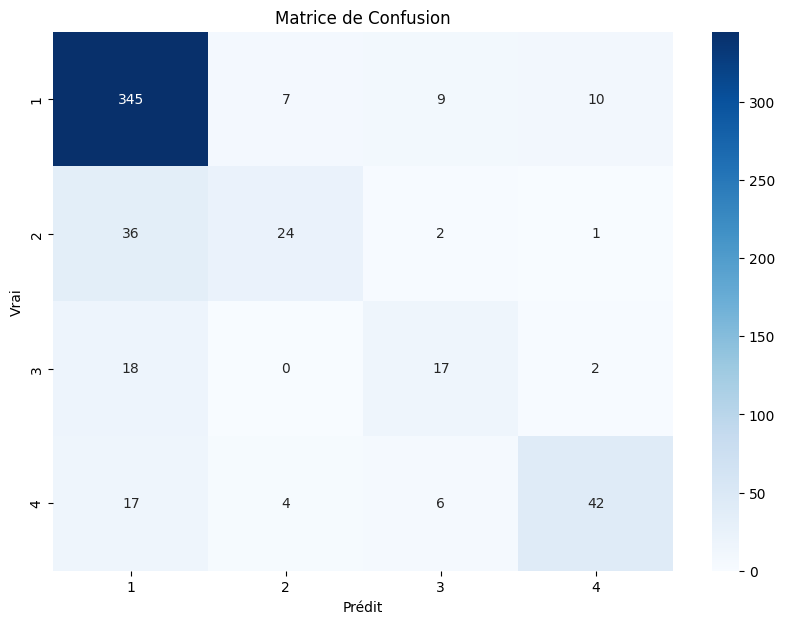

              precision    recall  f1-score   support

           0       0.83      0.93      0.88       371
           1       0.69      0.38      0.49        63
           2       0.50      0.46      0.48        37
           3       0.76      0.61      0.68        69

    accuracy                           0.79       540
   macro avg       0.69      0.59      0.63       540
weighted avg       0.78      0.79      0.78       540



In [514]:
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# Calcul de la matrice de confusion
conf_matrix = confusion_matrix(y_test, predicted_classes)

# Affichage de la matrice de confusion
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap='Blues', xticklabels=[1, 2, 3, 4], yticklabels=[1, 2, 3, 4])
plt.title('Matrice de Confusion')
plt.xlabel('Prédit')
plt.ylabel('Vrai')
plt.show()

# Rapport de classification
print(classification_report(y_test, predicted_classes))

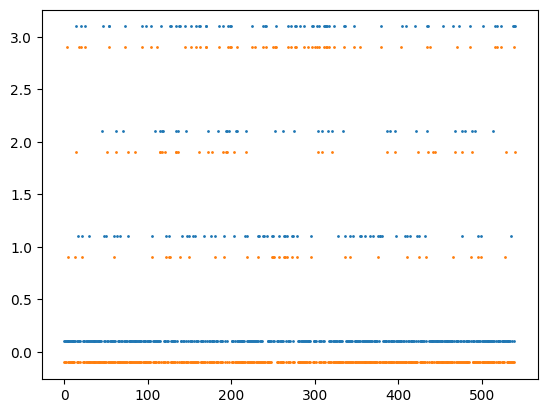

In [519]:
plt.scatter(np.linspace(0,y_test.shape[0], y_test.shape[0]), y_test + 0.1, s=1)
plt.scatter(np.linspace(0,predicted_classes.shape[0], predicted_classes.shape[0]), predicted_classes-0.1, s=1)

# Ok vraiment pas pire. Je vais continuer à optimiser

# Ici on tente d'obtenir un sigma optimal en runnant plein de modèles avec le data à différentes valeurs de sigma pour le gaussian blurring. Sigma optimal = 3.5

In [587]:

import numpy as np
from scipy.ndimage import gaussian_filter1d
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Flatten, Dense
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

def apply_gaussian_filter(X, sigma=1):
    """ Applique un filtre gaussien à chaque feature de l'array X. """
    return np.array([gaussian_filter1d(X[:, i], sigma=sigma) for i in range(X.shape[1])]).T

def reshape_X_for_CNN(X, time_steps=10):
    """ Redimensionne X en blocs pour l'entrée CNN. """
    num_complete_blocks = X.shape[0] // time_steps
    X_cropped = X[:num_complete_blocks * time_steps]
    return X_cropped.reshape(-1, time_steps, X.shape[1], 1)

def create_model(input_shape):
    """ Construit et compile le modèle CNN. """
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
        Conv2D(64, (3, 1), activation='relu'),
        Flatten(),
        Dense(64, activation='relu'),
        Dense(4, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model


sigmas = np.linspace(0.5, 20, 40)  # Plage de valeurs sigma à tester
results = []

for sigma in sigmas:
    X_filt = apply_gaussian_filter(X, sigma=sigma)
    test_block_features = reshape_X_for_CNN(X_filt)
    
    X_train, X_test, y_train, y_test = train_test_split(test_block_features, block_events, test_size=0.3, random_state=42)
    
    model = create_model((10, 3, 1))
    
    # Configuration des callbacks
    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.001)

    # Entraînement du modèle
    model.fit(X_train, y_train, epochs=100, validation_split=0.2, batch_size=16, callbacks=[early_stopping, reduce_lr])
    
    # Évaluation du modèle
    loss, accuracy = model.evaluate(X_test, y_test)
    results.append((sigma, accuracy))
    print(f"Sigma: {sigma:.2f}, Loss: {loss:.4f}, Accuracy: {accuracy:.4f}")

# Trouver le sigma avec la meilleure accuracy
best_sigma, best_accuracy = max(results, key=lambda x: x[1])
print(f"Best Sigma: {best_sigma}, Best Accuracy: {best_accuracy}")

Epoch 1/100
63/63 [==============================] - 1s 4ms/step - loss: 0.8869 - accuracy: 0.6660 - val_loss: 0.7240 - val_accuracy: 0.7579 - lr: 0.0010
Epoch 2/100
63/63 [==============================] - 0s 2ms/step - loss: 0.7399 - accuracy: 0.7515 - val_loss: 0.6798 - val_accuracy: 0.7698 - lr: 0.0010
Epoch 3/100
63/63 [==============================] - 0s 2ms/step - loss: 0.7132 - accuracy: 0.7485 - val_loss: 0.6642 - val_accuracy: 0.7659 - lr: 0.0010
Epoch 4/100
63/63 [==============================] - 0s 2ms/step - loss: 0.7062 - accuracy: 0.7545 - val_loss: 0.7447 - val_accuracy: 0.7698 - lr: 0.0010
Epoch 5/100
63/63 [==============================] - 0s 3ms/step - loss: 0.7046 - accuracy: 0.7624 - val_loss: 0.6442 - val_accuracy: 0.7817 - lr: 0.0010
Epoch 6/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6960 - accuracy: 0.7684 - val_loss: 0.6391 - val_accuracy: 0.7897 - lr: 0.0010
Epoch 7/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6

63/63 [==============================] - 0s 2ms/step - loss: 0.6864 - accuracy: 0.7634 - val_loss: 0.6498 - val_accuracy: 0.7778 - lr: 0.0010
Epoch 9/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6894 - accuracy: 0.7604 - val_loss: 0.6555 - val_accuracy: 0.7738 - lr: 0.0010
Epoch 10/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6782 - accuracy: 0.7734 - val_loss: 0.6390 - val_accuracy: 0.7857 - lr: 0.0010
Epoch 11/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6753 - accuracy: 0.7694 - val_loss: 0.6640 - val_accuracy: 0.7698 - lr: 0.0010
Epoch 12/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6731 - accuracy: 0.7684 - val_loss: 0.6319 - val_accuracy: 0.7937 - lr: 0.0010
Epoch 13/100
63/63 [==============================] - 0s 4ms/step - loss: 0.6651 - accuracy: 0.7753 - val_loss: 0.6574 - val_accuracy: 0.7619 - lr: 0.0010
Epoch 14/100
63/63 [==============================] - 0s 3ms/step - loss: 0.6626 - a

63/63 [==============================] - 0s 5ms/step - loss: 0.6846 - accuracy: 0.7664 - val_loss: 0.6925 - val_accuracy: 0.7659 - lr: 0.0010
Epoch 10/100
63/63 [==============================] - 0s 3ms/step - loss: 0.6747 - accuracy: 0.7714 - val_loss: 0.6444 - val_accuracy: 0.7698 - lr: 0.0010
Epoch 11/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6755 - accuracy: 0.7704 - val_loss: 0.6411 - val_accuracy: 0.7698 - lr: 0.0010
Epoch 12/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6672 - accuracy: 0.7734 - val_loss: 0.6304 - val_accuracy: 0.7897 - lr: 0.0010
Epoch 13/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6586 - accuracy: 0.7744 - val_loss: 0.6894 - val_accuracy: 0.7500 - lr: 0.0010
Epoch 14/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6664 - accuracy: 0.7714 - val_loss: 0.6508 - val_accuracy: 0.7817 - lr: 0.0010
Epoch 15/100
63/63 [==============================] - 0s 3ms/step - loss: 0.6617 - 

63/63 [==============================] - 0s 2ms/step - loss: 0.6688 - accuracy: 0.7724 - val_loss: 0.6608 - val_accuracy: 0.7698 - lr: 0.0010
Epoch 13/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6668 - accuracy: 0.7734 - val_loss: 0.6522 - val_accuracy: 0.7897 - lr: 0.0010
Epoch 14/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6639 - accuracy: 0.7773 - val_loss: 0.6256 - val_accuracy: 0.7897 - lr: 0.0010
Epoch 15/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6569 - accuracy: 0.7803 - val_loss: 0.6521 - val_accuracy: 0.7698 - lr: 0.0010
Epoch 16/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6610 - accuracy: 0.7793 - val_loss: 0.6361 - val_accuracy: 0.7817 - lr: 0.0010
Epoch 17/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6570 - accuracy: 0.7853 - val_loss: 0.6362 - val_accuracy: 0.7778 - lr: 0.0010
Epoch 18/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6516 - 

17/17 [==============================] - 0s 1ms/step - loss: 0.6288 - accuracy: 0.7963
Sigma: 4.50, Loss: 0.6288, Accuracy: 0.7963
Epoch 1/100
63/63 [==============================] - 1s 4ms/step - loss: 0.8493 - accuracy: 0.6829 - val_loss: 0.7041 - val_accuracy: 0.7619 - lr: 0.0010
Epoch 2/100
63/63 [==============================] - 0s 2ms/step - loss: 0.7319 - accuracy: 0.7525 - val_loss: 0.6859 - val_accuracy: 0.7738 - lr: 0.0010
Epoch 3/100
63/63 [==============================] - 0s 2ms/step - loss: 0.7083 - accuracy: 0.7485 - val_loss: 0.6537 - val_accuracy: 0.7698 - lr: 0.0010
Epoch 4/100
63/63 [==============================] - 0s 2ms/step - loss: 0.7074 - accuracy: 0.7674 - val_loss: 0.6587 - val_accuracy: 0.7857 - lr: 0.0010
Epoch 5/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6924 - accuracy: 0.7704 - val_loss: 0.6501 - val_accuracy: 0.7778 - lr: 0.0010
Epoch 6/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6904 - accuracy: 0.7674 

63/63 [==============================] - 1s 4ms/step - loss: 0.9170 - accuracy: 0.6491 - val_loss: 0.7384 - val_accuracy: 0.7579 - lr: 0.0010
Epoch 2/100
63/63 [==============================] - 0s 2ms/step - loss: 0.7560 - accuracy: 0.7376 - val_loss: 0.6891 - val_accuracy: 0.7500 - lr: 0.0010
Epoch 3/100
63/63 [==============================] - 0s 2ms/step - loss: 0.7277 - accuracy: 0.7525 - val_loss: 0.6642 - val_accuracy: 0.7738 - lr: 0.0010
Epoch 4/100
63/63 [==============================] - 0s 2ms/step - loss: 0.7102 - accuracy: 0.7604 - val_loss: 0.6570 - val_accuracy: 0.7937 - lr: 0.0010
Epoch 5/100
63/63 [==============================] - 0s 2ms/step - loss: 0.7203 - accuracy: 0.7555 - val_loss: 0.6900 - val_accuracy: 0.7857 - lr: 0.0010
Epoch 6/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6928 - accuracy: 0.7714 - val_loss: 0.6525 - val_accuracy: 0.7937 - lr: 0.0010
Epoch 7/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6867 - accura

Epoch 54/100
63/63 [==============================] - 0s 3ms/step - loss: 0.6158 - accuracy: 0.7922 - val_loss: 0.5981 - val_accuracy: 0.7937 - lr: 0.0010
Epoch 55/100
63/63 [==============================] - 0s 3ms/step - loss: 0.6133 - accuracy: 0.7833 - val_loss: 0.6394 - val_accuracy: 0.7698 - lr: 0.0010
Epoch 56/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6149 - accuracy: 0.7843 - val_loss: 0.6064 - val_accuracy: 0.7976 - lr: 0.0010
Epoch 57/100
63/63 [==============================] - 0s 3ms/step - loss: 0.6148 - accuracy: 0.7863 - val_loss: 0.5946 - val_accuracy: 0.7937 - lr: 0.0010
Epoch 58/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6152 - accuracy: 0.7863 - val_loss: 0.6013 - val_accuracy: 0.7937 - lr: 0.0010
Epoch 59/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6167 - accuracy: 0.7873 - val_loss: 0.5985 - val_accuracy: 0.7976 - lr: 0.0010
Epoch 60/100
63/63 [==============================] - 0s 2ms/step - lo

63/63 [==============================] - 0s 4ms/step - loss: 0.6480 - accuracy: 0.7783 - val_loss: 0.6294 - val_accuracy: 0.7937 - lr: 0.0010
Epoch 30/100
17/17 [==============================] - 0s 1ms/step - loss: 0.6236 - accuracy: 0.7981
Sigma: 7.00, Loss: 0.6236, Accuracy: 0.7981
Epoch 1/100
63/63 [==============================] - 2s 6ms/step - loss: 0.9249 - accuracy: 0.6342 - val_loss: 0.7468 - val_accuracy: 0.7421 - lr: 0.0010
Epoch 2/100
63/63 [==============================] - 0s 3ms/step - loss: 0.7792 - accuracy: 0.7435 - val_loss: 0.6809 - val_accuracy: 0.7619 - lr: 0.0010
Epoch 3/100
63/63 [==============================] - 0s 4ms/step - loss: 0.7277 - accuracy: 0.7475 - val_loss: 0.6718 - val_accuracy: 0.7659 - lr: 0.0010
Epoch 4/100
63/63 [==============================] - 0s 5ms/step - loss: 0.7208 - accuracy: 0.7525 - val_loss: 0.6480 - val_accuracy: 0.7897 - lr: 0.0010
Epoch 5/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6987 - accuracy: 0.7634

17/17 [==============================] - 0s 1ms/step - loss: 0.6145 - accuracy: 0.7963
Sigma: 8.00, Loss: 0.6145, Accuracy: 0.7963
Epoch 1/100
63/63 [==============================] - 1s 4ms/step - loss: 0.8648 - accuracy: 0.6859 - val_loss: 0.6853 - val_accuracy: 0.7619 - lr: 0.0010
Epoch 2/100
63/63 [==============================] - 0s 2ms/step - loss: 0.7544 - accuracy: 0.7406 - val_loss: 0.6850 - val_accuracy: 0.7619 - lr: 0.0010
Epoch 3/100
63/63 [==============================] - 0s 2ms/step - loss: 0.7216 - accuracy: 0.7515 - val_loss: 0.6638 - val_accuracy: 0.7897 - lr: 0.0010
Epoch 4/100
63/63 [==============================] - 0s 2ms/step - loss: 0.7043 - accuracy: 0.7644 - val_loss: 0.6648 - val_accuracy: 0.7738 - lr: 0.0010
Epoch 5/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6998 - accuracy: 0.7724 - val_loss: 0.6802 - val_accuracy: 0.7817 - lr: 0.0010
Epoch 6/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6953 - accuracy: 0.7684 

63/63 [==============================] - 0s 3ms/step - loss: 0.6546 - accuracy: 0.7724 - val_loss: 0.6342 - val_accuracy: 0.7817 - lr: 0.0010
Epoch 19/100
63/63 [==============================] - 0s 3ms/step - loss: 0.6522 - accuracy: 0.7724 - val_loss: 0.6749 - val_accuracy: 0.7817 - lr: 0.0010
Epoch 20/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6445 - accuracy: 0.7744 - val_loss: 0.6232 - val_accuracy: 0.7897 - lr: 0.0010
Epoch 21/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6514 - accuracy: 0.7793 - val_loss: 0.6124 - val_accuracy: 0.7937 - lr: 0.0010
Epoch 22/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6543 - accuracy: 0.7753 - val_loss: 0.6070 - val_accuracy: 0.7897 - lr: 0.0010
Epoch 23/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6569 - accuracy: 0.7744 - val_loss: 0.6040 - val_accuracy: 0.7976 - lr: 0.0010
Epoch 24/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6469 - 

63/63 [==============================] - 0s 2ms/step - loss: 0.6336 - accuracy: 0.7773 - val_loss: 0.6074 - val_accuracy: 0.7976 - lr: 0.0010
Epoch 49/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6222 - accuracy: 0.7853 - val_loss: 0.6057 - val_accuracy: 0.7897 - lr: 0.0010
Epoch 50/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6201 - accuracy: 0.7793 - val_loss: 0.6033 - val_accuracy: 0.7976 - lr: 0.0010
Epoch 51/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6281 - accuracy: 0.7793 - val_loss: 0.6077 - val_accuracy: 0.8095 - lr: 0.0010
Epoch 52/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6238 - accuracy: 0.7843 - val_loss: 0.5934 - val_accuracy: 0.7937 - lr: 0.0010
Epoch 53/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6275 - accuracy: 0.7773 - val_loss: 0.6141 - val_accuracy: 0.8095 - lr: 0.0010
Epoch 54/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6172 - 

63/63 [==============================] - 0s 2ms/step - loss: 0.6399 - accuracy: 0.7833 - val_loss: 0.6255 - val_accuracy: 0.7897 - lr: 0.0010
Epoch 38/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6290 - accuracy: 0.7843 - val_loss: 0.6296 - val_accuracy: 0.8016 - lr: 0.0010
Epoch 39/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6421 - accuracy: 0.7704 - val_loss: 0.6263 - val_accuracy: 0.7817 - lr: 0.0010
Epoch 40/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6358 - accuracy: 0.7744 - val_loss: 0.6173 - val_accuracy: 0.7976 - lr: 0.0010
Epoch 41/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6439 - accuracy: 0.7803 - val_loss: 0.6231 - val_accuracy: 0.7817 - lr: 0.0010
Epoch 42/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6346 - accuracy: 0.7823 - val_loss: 0.6264 - val_accuracy: 0.7857 - lr: 0.0010
Epoch 43/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6411 - 

63/63 [==============================] - 0s 2ms/step - loss: 0.6473 - accuracy: 0.7753 - val_loss: 0.6009 - val_accuracy: 0.8016 - lr: 0.0010
Epoch 34/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6439 - accuracy: 0.7803 - val_loss: 0.6227 - val_accuracy: 0.7817 - lr: 0.0010
Epoch 35/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6439 - accuracy: 0.7763 - val_loss: 0.6084 - val_accuracy: 0.8016 - lr: 0.0010
Epoch 36/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6358 - accuracy: 0.7793 - val_loss: 0.6047 - val_accuracy: 0.8056 - lr: 0.0010
Epoch 37/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6335 - accuracy: 0.7704 - val_loss: 0.6092 - val_accuracy: 0.7976 - lr: 0.0010
Epoch 38/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6352 - accuracy: 0.7694 - val_loss: 0.6143 - val_accuracy: 0.8016 - lr: 0.0010
Epoch 39/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6355 - 

Epoch 86/100
63/63 [==============================] - 0s 2ms/step - loss: 0.5890 - accuracy: 0.7793 - val_loss: 0.5850 - val_accuracy: 0.8016 - lr: 0.0010
Epoch 87/100
17/17 [==============================] - 0s 2ms/step - loss: 0.5869 - accuracy: 0.7981
Sigma: 12.50, Loss: 0.5869, Accuracy: 0.7981
Epoch 1/100
63/63 [==============================] - 1s 4ms/step - loss: 0.9234 - accuracy: 0.6660 - val_loss: 0.7497 - val_accuracy: 0.7619 - lr: 0.0010
Epoch 2/100
63/63 [==============================] - 0s 2ms/step - loss: 0.7660 - accuracy: 0.7336 - val_loss: 0.6955 - val_accuracy: 0.7817 - lr: 0.0010
Epoch 3/100
63/63 [==============================] - 0s 2ms/step - loss: 0.7288 - accuracy: 0.7416 - val_loss: 0.6954 - val_accuracy: 0.7579 - lr: 0.0010
Epoch 4/100
63/63 [==============================] - 0s 2ms/step - loss: 0.7268 - accuracy: 0.7535 - val_loss: 0.6525 - val_accuracy: 0.7817 - lr: 0.0010
Epoch 5/100
63/63 [==============================] - 0s 2ms/step - loss: 0.7131 - ac

63/63 [==============================] - 0s 2ms/step - loss: 0.6783 - accuracy: 0.7634 - val_loss: 0.6313 - val_accuracy: 0.7857 - lr: 0.0010
Epoch 18/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6792 - accuracy: 0.7654 - val_loss: 0.6324 - val_accuracy: 0.7937 - lr: 0.0010
Epoch 19/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6718 - accuracy: 0.7684 - val_loss: 0.6308 - val_accuracy: 0.7738 - lr: 0.0010
Epoch 20/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6734 - accuracy: 0.7684 - val_loss: 0.6608 - val_accuracy: 0.7857 - lr: 0.0010
Epoch 21/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6674 - accuracy: 0.7664 - val_loss: 0.6225 - val_accuracy: 0.7976 - lr: 0.0010
Epoch 22/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6669 - accuracy: 0.7614 - val_loss: 0.6359 - val_accuracy: 0.7817 - lr: 0.0010
Epoch 23/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6657 - 

63/63 [==============================] - 0s 2ms/step - loss: 0.6454 - accuracy: 0.7734 - val_loss: 0.6016 - val_accuracy: 0.7897 - lr: 0.0010
Epoch 42/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6310 - accuracy: 0.7783 - val_loss: 0.6186 - val_accuracy: 0.7817 - lr: 0.0010
Epoch 43/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6374 - accuracy: 0.7684 - val_loss: 0.5942 - val_accuracy: 0.7976 - lr: 0.0010
Epoch 44/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6412 - accuracy: 0.7783 - val_loss: 0.6022 - val_accuracy: 0.7857 - lr: 0.0010
Epoch 45/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6412 - accuracy: 0.7674 - val_loss: 0.6168 - val_accuracy: 0.7897 - lr: 0.0010
Epoch 46/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6389 - accuracy: 0.7674 - val_loss: 0.6036 - val_accuracy: 0.7937 - lr: 0.0010
Epoch 47/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6470 - 

63/63 [==============================] - 0s 2ms/step - loss: 0.6512 - accuracy: 0.7714 - val_loss: 0.6402 - val_accuracy: 0.7738 - lr: 0.0010
Epoch 39/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6599 - accuracy: 0.7694 - val_loss: 0.6514 - val_accuracy: 0.7659 - lr: 0.0010
Epoch 40/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6515 - accuracy: 0.7664 - val_loss: 0.6236 - val_accuracy: 0.7778 - lr: 0.0010
Epoch 41/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6430 - accuracy: 0.7704 - val_loss: 0.6173 - val_accuracy: 0.7897 - lr: 0.0010
Epoch 42/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6422 - accuracy: 0.7684 - val_loss: 0.6084 - val_accuracy: 0.7937 - lr: 0.0010
Epoch 43/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6438 - accuracy: 0.7734 - val_loss: 0.6181 - val_accuracy: 0.7937 - lr: 0.0010
Epoch 44/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6469 - 

63/63 [==============================] - 0s 2ms/step - loss: 0.7465 - accuracy: 0.7396 - val_loss: 0.7058 - val_accuracy: 0.7659 - lr: 0.0010
Epoch 4/100
63/63 [==============================] - 0s 2ms/step - loss: 0.7315 - accuracy: 0.7485 - val_loss: 0.6660 - val_accuracy: 0.7897 - lr: 0.0010
Epoch 5/100
63/63 [==============================] - 0s 2ms/step - loss: 0.7188 - accuracy: 0.7555 - val_loss: 0.6724 - val_accuracy: 0.7738 - lr: 0.0010
Epoch 6/100
63/63 [==============================] - 0s 2ms/step - loss: 0.7251 - accuracy: 0.7565 - val_loss: 0.6760 - val_accuracy: 0.7738 - lr: 0.0010
Epoch 7/100
63/63 [==============================] - 0s 2ms/step - loss: 0.7061 - accuracy: 0.7565 - val_loss: 0.6500 - val_accuracy: 0.7937 - lr: 0.0010
Epoch 8/100
63/63 [==============================] - 0s 2ms/step - loss: 0.7058 - accuracy: 0.7604 - val_loss: 0.6733 - val_accuracy: 0.7778 - lr: 0.0010
Epoch 9/100
63/63 [==============================] - 0s 2ms/step - loss: 0.7037 - accura

63/63 [==============================] - 0s 2ms/step - loss: 0.7086 - accuracy: 0.7594 - val_loss: 0.6716 - val_accuracy: 0.7857 - lr: 0.0010
Epoch 9/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6967 - accuracy: 0.7604 - val_loss: 0.6550 - val_accuracy: 0.7937 - lr: 0.0010
Epoch 10/100
63/63 [==============================] - 0s 2ms/step - loss: 0.7068 - accuracy: 0.7594 - val_loss: 0.6665 - val_accuracy: 0.7659 - lr: 0.0010
Epoch 11/100
63/63 [==============================] - 0s 2ms/step - loss: 0.7082 - accuracy: 0.7485 - val_loss: 0.6602 - val_accuracy: 0.7778 - lr: 0.0010
Epoch 12/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6990 - accuracy: 0.7555 - val_loss: 0.6562 - val_accuracy: 0.7857 - lr: 0.0010
Epoch 13/100
63/63 [==============================] - 0s 2ms/step - loss: 0.7000 - accuracy: 0.7634 - val_loss: 0.6683 - val_accuracy: 0.7897 - lr: 0.0010
Epoch 14/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6946 - a

Epoch 56/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6317 - accuracy: 0.7704 - val_loss: 0.6430 - val_accuracy: 0.7579 - lr: 0.0010
Epoch 57/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6351 - accuracy: 0.7753 - val_loss: 0.6170 - val_accuracy: 0.7698 - lr: 0.0010
Epoch 58/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6314 - accuracy: 0.7694 - val_loss: 0.6205 - val_accuracy: 0.7897 - lr: 0.0010
Epoch 59/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6275 - accuracy: 0.7753 - val_loss: 0.6678 - val_accuracy: 0.7619 - lr: 0.0010
Epoch 60/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6353 - accuracy: 0.7664 - val_loss: 0.5990 - val_accuracy: 0.7897 - lr: 0.0010
Epoch 61/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6306 - accuracy: 0.7694 - val_loss: 0.6255 - val_accuracy: 0.7857 - lr: 0.0010
Epoch 62/100
63/63 [==============================] - 0s 2ms/step - lo

63/63 [==============================] - 0s 2ms/step - loss: 0.6604 - accuracy: 0.7624 - val_loss: 0.6210 - val_accuracy: 0.7817 - lr: 0.0010
Epoch 39/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6771 - accuracy: 0.7624 - val_loss: 0.6387 - val_accuracy: 0.7897 - lr: 0.0010
Epoch 40/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6681 - accuracy: 0.7565 - val_loss: 0.6298 - val_accuracy: 0.7857 - lr: 0.0010
Epoch 41/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6557 - accuracy: 0.7644 - val_loss: 0.6526 - val_accuracy: 0.7817 - lr: 0.0010
Epoch 42/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6750 - accuracy: 0.7604 - val_loss: 0.6249 - val_accuracy: 0.7857 - lr: 0.0010
Epoch 43/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6521 - accuracy: 0.7654 - val_loss: 0.6526 - val_accuracy: 0.7738 - lr: 0.0010
Epoch 44/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6705 - 

63/63 [==============================] - 0s 2ms/step - loss: 0.6427 - accuracy: 0.7624 - val_loss: 0.6275 - val_accuracy: 0.7778 - lr: 0.0010
Epoch 40/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6474 - accuracy: 0.7724 - val_loss: 0.6140 - val_accuracy: 0.7976 - lr: 0.0010
Epoch 41/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6449 - accuracy: 0.7664 - val_loss: 0.6530 - val_accuracy: 0.7817 - lr: 0.0010
Epoch 42/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6398 - accuracy: 0.7604 - val_loss: 0.6208 - val_accuracy: 0.7976 - lr: 0.0010
Epoch 43/100
63/63 [==============================] - 0s 2ms/step - loss: 0.6492 - accuracy: 0.7644 - val_loss: 0.6040 - val_accuracy: 0.7976 - lr: 0.0010
Epoch 44/100
63/63 [==============================] - 0s 3ms/step - loss: 0.6494 - accuracy: 0.7565 - val_loss: 0.6537 - val_accuracy: 0.7817 - lr: 0.0010
Epoch 45/100
63/63 [==============================] - 0s 3ms/step - loss: 0.6490 - 

# On conserve les probabilités et on filtre les états qui sont trop incertains:

In [599]:
def calculate_confidence_intervals(probabilities):
    """
    Calcule l'écart entre la classe la plus probable et la deuxième classe la plus probable pour chaque prédiction.
    
    Parameters:
    probabilities (numpy.ndarray): Le tableau des probabilités prédites par le modèle pour chaque classe.
    
    Returns:
    numpy.ndarray: Un tableau contenant l'écart pour chaque prédiction.
    """
    # Trier les probabilités en ordre décroissant pour chaque prédiction
    sorted_probs = np.sort(probabilities, axis=1)[:, ::-1]
    
    # Calculer l'écart entre les deux probabilités les plus élevées
    gaps = sorted_probs[:, 0] - sorted_probs[:, 1]
    
    # Calculer le ratio entre la classe la plus probable et la deuxième classe la plus probable
    ratios = sorted_probs[:, 0] / sorted_probs[:, 1]
    
    return gaps, ratios

# Supposons que 'probabilities' contient les probabilités prédites par votre modèle
# Vous pouvez obtenir ces probabilités en utilisant la méthode predict de votre modèle comme suit :
# probabilities = model.predict(X_test)

gaps, ratios = calculate_confidence_intervals(predictions_prob)

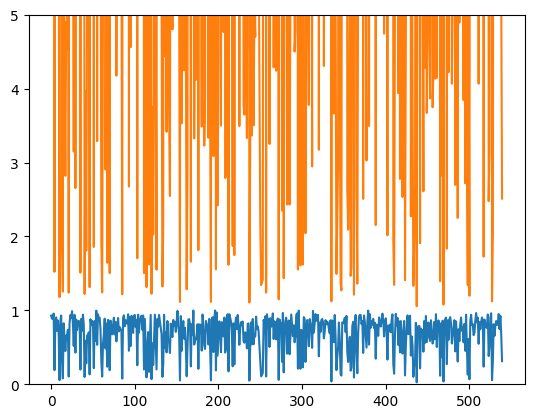

In [619]:
plt.plot(gaps)
plt.plot(ratios)
plt.ylim([0,5])
plt.show()

In [620]:
def calculate_entropy(probabilities):
    # Éviter le log de zéro en ajoutant un très petit nombre aux probabilités
    epsilon = 1e-10
    return -np.sum(probabilities * np.log(probabilities + epsilon), axis=1)

In [622]:
entropy = calculate_entropy(predictions_prob)

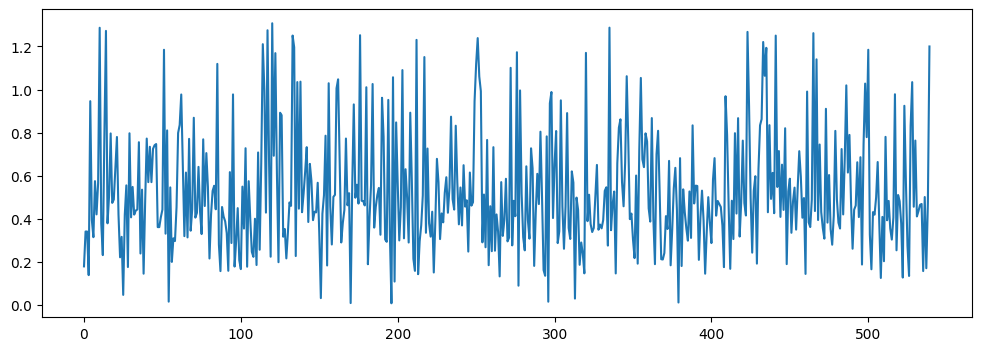

In [624]:
fig,ax = plt.subplots(figsize=(12,4))
plt.plot(entropy)

# Ça, c'est l'entropie

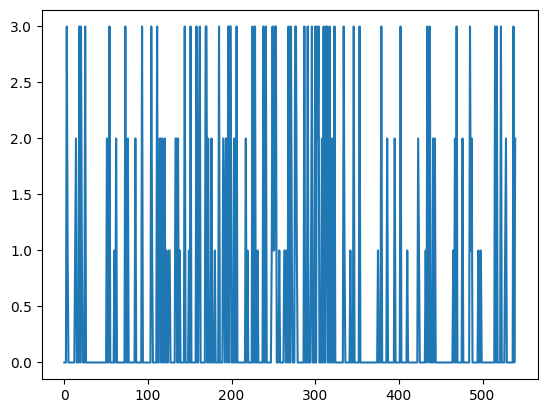

In [635]:
plt.plot(predicted_classes)

In [639]:
predictions_confiantes = entropy[entropy<0.8]

In [641]:
predictions_confiantes = entropy < 0.8

In [644]:
# Rapport de classification
print(classification_report(y_test[predictions_confiantes], predicted_classes[predictions_confiantes]))

              precision    recall  f1-score   support

           0       0.85      0.97      0.91       339
           1       0.94      0.33      0.49        48
           2       0.75      0.30      0.43        20
           3       0.79      0.72      0.76        47

    accuracy                           0.85       454
   macro avg       0.83      0.58      0.65       454
weighted avg       0.85      0.85      0.83       454



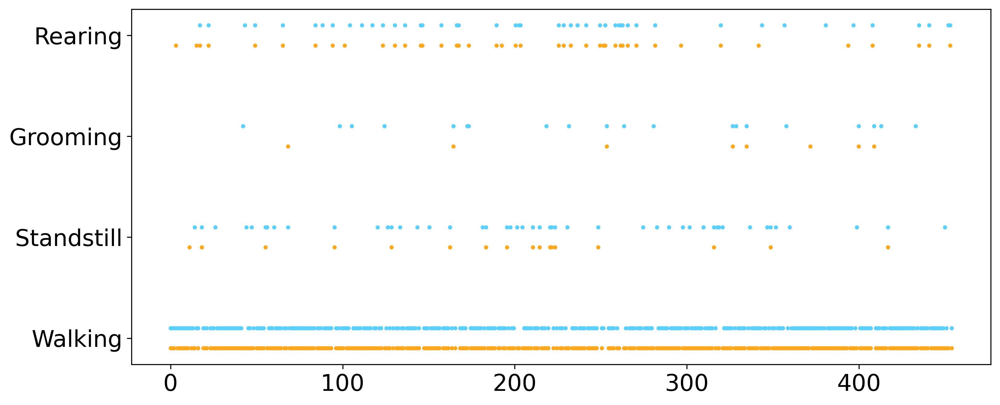

In [653]:
fig,ax=plt.subplots(figsize=(12,5), dpi=300)
l = y_test[predictions_confiantes].shape[0]
plt.scatter(np.linspace(0 , l , l), y_test[predictions_confiantes] + 0.1, s=5, color=colors['blue'])
plt.scatter(np.linspace(0 , l , l), predicted_classes[predictions_confiantes] - 0.1, s=5, color=colors['orange'])

ax.set_yticks([0,1,2,3])
ax.set_yticklabels(['Walking', 'Standstill', 'Grooming', 'Rearing'], fontsize=18)
ax.tick_params(axis='x', labelsize=18)
#ax.set_xticklabels(fontsize=18)
plt.show()

# Trying with full mouse images

In [301]:
from skimage.measure import label, regionprops
from sklearn.preprocessing import StandardScaler
from scipy.ndimage import gaussian_filter1d, minimum_filter1d
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, LSTM, TimeDistributed, concatenate

def compute_orientations(dataset_path):
    mask_stack_path = dataset_path + "/" + "mask_video.tif"
    
    with tiff.TiffFile(mask_stack_path) as tif:
        # Get the number of frames in the stack
        n_frames = len(tif.pages)

        # Initialize an array to store the orientations
        orientations = np.zeros(n_frames, dtype=np.float32)

        # Process the stack frame by frame
        for i in range(n_frames):
            # Read the current frame
            binary_image = tif.pages[i].asarray()
    
            # Label connected regions in the image
            labeled_image = label(binary_image)

            # Calculate properties of these regions
            regions = regionprops(labeled_image)

            if regions:  # Ensure there are regions in the frame
                # Find the region with the largest area (presumably the main mouse region)
                largest_region = max(regions, key=lambda r: r.area)

                # Calculate the orientation of the major axis for this region
                orientations[i] = largest_region.orientation
            else:
                orientations[i] = np.nan  # Use NaN to indicate no region found

    return orientations




def baseline_minfilter(signal, window=300, sigma1=5, sigma2=100, debug=False):
    signal_flatstart = np.copy(signal)
    signal_flatstart[0] = signal[1]
    smooth = gaussian_filter1d(signal_flatstart, sigma1)
    mins = minimum_filter1d(smooth, window)
    baseline = gaussian_filter1d(mins, sigma2)
    if debug:
        debug_out = np.asarray([smooth, mins, baseline])
        return debug_out
    else:
        return baseline


def compute_principal_axis_length(dataset_path):
    mask_stack_path = dataset_path + "/" + "mask_video.tif"
    
    with tiff.TiffFile(mask_stack_path) as tif:
        # Get the number of frames in the stack
        n_frames = len(tif.pages)

        # Initialize an array to store the lengths of the principal axes
        principal_axis_lengths = np.zeros(n_frames, dtype=np.float32)

        # Process the stack frame by frame
        for i in range(n_frames):
            # Read the current frame
            binary_image = tif.pages[i].asarray()
    
            # Label connected regions in the image
            labeled_image = label(binary_image)

            # Calculate properties of these regions
            regions = regionprops(labeled_image)

            if regions:  # Ensure there are regions in the frame
                # Find the region with the largest area (presumably the main mouse region)
                largest_region = max(regions, key=lambda r: r.area)

                # Retrieve the length of the major axis for this region
                principal_axis_lengths[i] = largest_region.major_axis_length
            else:
                principal_axis_lengths[i] = np.nan  # Use NaN to indicate no region found

    return principal_axis_lengths


def unwrap_principal_axis(orientation, threshold, flip = True):
    
    jumps = np.diff(orientation)
    positives = jumps > threshold
    negatives = jumps < - threshold
    
    continuous_orientation = np.zeros(orientation.shape)
    
    phase = np.zeros(orientation.shape)
    
    for i in range(orientation.shape[0]):
        if i == 0:
            if flip:
                phase[0] = 1
            else:
                phase[0] = 0
            
        else:
            
            if positives[i-1]:
                phase[i] += phase[i-1] - 1 
            elif negatives[i-1]:
                phase[i] += phase[i-1] + 1
            else:
                phase[i] = phase[i-1]
                
        
        continuous_orientation[i] = (np.pi*int(phase[i])) + orientation[i]
    
    return continuous_orientation, phase, jumps

orientations = compute_orientations(datapath)  # Load the orientations calculated earlier
smooth_orientations , _ , _ = unwrap_principal_axis(orientations, threshold = flip_parameters[0], flip = flip_parameters[1])


def find_max_pixel_value(file_path):
    # Open the video file
    file_path = file_path + "/bg_sub_cropped_video.avi"
    
    cap = cv2.VideoCapture(file_path)
    if not cap.isOpened():
        print(f"Error: Could not open file {file_path}.")
        return None

    max_pixel = 0
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        max_pixel = max(max_pixel, frame.max())

    # Release the video capture object
    cap.release()

    return max_pixel


import cv2
import numpy as np
import tifffile as tiff
from tqdm import tqdm

def create_mouse_box(datapath, box_size=90, flip_parameters = [1.5, True], verbose=False):
    # Load centroids from the pickle file
    centroids = compute_centroids(datapath)
    orientations = compute_orientations(datapath)  # Load the orientations calculated earlier
    max_intensity = find_max_pixel_value(datapath)

    smooth_orientations , _ , jumps = unwrap_principal_axis(orientations, threshold = flip_parameters[0], flip = flip_parameters[1])
    
    # Path to the video file
    file_path = datapath + '/bg_sub_cropped_video.avi'
    output_path = datapath + '/boxed_video.tif'
    
    # Open the video file
    cap = cv2.VideoCapture(file_path)
    if not cap.isOpened():
        print(f"Error: Could not open file {file_path}.")
        return None, None

    # Prepare to write to a TIFF file
    with tiff.TiffWriter(output_path) as tif:
        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        
        # Loop over each frame in the video
        for i in tqdm(range(total_frames)):
            ret, frame = cap.read()
            if not ret:
                print("Error: Could not read frame.")
                break
            
            #convert to gray
            gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
            
            # Get the centroid and orientation for the current frame
            centroid_x, centroid_y = int(centroids[i][0]), int(centroids[i][1])
            angle = np.degrees(smooth_orientations[i])  # Convert radians to degrees for cv2.rotate

            # Rotate the frame to align the major axis with the x or y-axis
            (h, w) = frame.shape[:2]
            center = (centroid_x, centroid_y)
            M = cv2.getRotationMatrix2D(center, -angle, 1.0)  # Negative to correct the orientation
            rotated = cv2.warpAffine(gray_frame, M, (w, h))
            
            # Calculate the top-left corner of the cropping square post-rotation
            start_x = max(centroid_x - box_size // 2, 0)
            start_y = max(centroid_y - box_size // 2, 0)
            
            # Ensure the cropping square does not go outside of the frame boundaries
            end_x = min(start_x + box_size, w)
            end_y = min(start_y + box_size, h)
            
            # Crop the rotated frame
            cropped_frame = rotated[start_y:end_y, start_x:end_x]
            
            # If the crop is smaller than expected (at edges), pad it to maintain size
            if cropped_frame.shape[0] < box_size or cropped_frame.shape[1] < box_size:
                cropped_frame = cv2.copyMakeBorder(cropped_frame,
                                                   top=max(0, box_size - cropped_frame.shape[0]),
                                                   bottom=0,
                                                   left=max(0, box_size - cropped_frame.shape[1]),
                                                   right=0,
                                                   borderType=cv2.BORDER_CONSTANT,
                                                   value=[0, 0, 0])  # Assuming black padding
            
            # Write the cropped frame to the TIFF file
            tif.write(cropped_frame.astype(np.float32)/max_intensity, photometric='minisblack')

    # Release the video capture object
    cap.release()
    
    if verbose:
        print("Cropping complete, output saved to", output_path)
    return jumps


def load_tif_stack(filepath):

    with tiff.TiffFile(filepath) as tif:
        # Pre-allocate a numpy array with the correct shape
        # Assuming all images in the stack are of the same shape and data type
        num_images = len(tif.pages)
        sample_image = tif.pages[0].asarray()
        stack = np.empty((num_images, sample_image.shape[0], sample_image.shape[1]), dtype=sample_image.dtype)

        # Iterate over each page and store it in the array
        for i, page in enumerate(tif.pages):
            stack[i, :, :] = page.asarray()

    return stack

def apply_gaussian_filter(X, sigma=1):
    """ Applique un filtre gaussien à chaque feature de l'array X. """
    return np.array([gaussian_filter1d(X[:, i], sigma=sigma) for i in range(X.shape[1])]).T

In [9]:
create_mouse_box(event_datapath, flip_parameters = [1.2,True])

100%|███████████████████████████████████| 17980/17980 [00:16<00:00, 1057.87it/s]


In [20]:
# dont forget manual_event

event_datapath = '/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M28_S1'
coords_dict = load_dict(event_datapath + '/metadata.pkl')
coords = coords_dict['coords']

circ = compute_circularity(event_datapath)
filtered_circ = gaussian_filter1d(circ,sigma=3)



orientations = compute_orientations(datapath)  # Load the orientations calculated earlier
smooth_orientations , _ , _ = unwrap_principal_axis(orientations, threshold = flip_parameters[0], flip = flip_parameters[1])

# Necessary informations to discriminate events
velocity = gaussian_filter1d(np.sqrt(np.diff(coords[:,0], axis=0)**2 + np.diff(coords[:,1], axis=0)**2),sigma=3)
velocity = np.append(velocity, velocity[-1])

depth = coords[:,2]
norm_depth = -depth + np.max(depth)
baseline_depth = baseline_minfilter(norm_depth, window=1500)
bs_norm_depth = norm_depth - baseline_depth


X = np.column_stack((velocity, bs_norm_depth))

scaler = StandardScaler()
X = scaler.fit_transform(X)

X_filt_features = apply_gaussian_filter(X,sigma=3.5)

if not os.path.exists(event_datapath + '/boxed_video.tif'):
    # For video: 
    create_mouse_box(event_datapath, flip_parameters = [1.2 , False])

video_features = load_tif_stack(event_datapath + '/boxed_video.tif')

NameError: name 'apply_gaussian_filter' is not defined

In [61]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, LSTM, TimeDistributed, concatenate
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

# Prepare your data inputs
video_features = video_features.reshape(-1, 90, 90, 1)  # Adding channel dimension for CNN
X_filt_features = X_filt_features.reshape(-1, 1, 4)     # Adding time step dimension for LSTM

# Split data for training and testing
X1_train, X1_test, X2_train, X2_test, y_train, y_test = train_test_split(
    X_filt_features[:12000], video_features[:12000], manual_event[:12000], test_size=0.3, random_state=42)

# Input for the filtered features
time_series_input = Input(shape=(1, 4))  # Each feature set is of shape (1, 2)
time_series_processed = LSTM(32, return_sequences=False)(time_series_input)
time_series_branch = Dense(32, activation='relu')(time_series_processed)

# Input for the video frames
video_input = Input(shape=(90, 90, 1))  # Each video frame is 90x90 with 1 channel
x = Conv2D(32, (3, 3), activation='relu')(video_input)
x = MaxPooling2D((2, 2))(x)
x = Flatten()(x)
video_branch = Dense(32, activation='relu')(x)

# Concatenate both branches
combined = concatenate([time_series_branch, video_branch])

# Output layer
output = Dense(4, activation='softmax')(combined)  # Assuming 4 possible states

# Model assembly and compilation
model = Model(inputs=[time_series_input, video_input], outputs=output)
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Setup callbacks for efficient training
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.01)

# Train the model
history = model.fit(
    [X1_train, X2_train], y_train,
    validation_data=([X1_test, X2_test], y_test),
    epochs=3,
    batch_size=16,
    callbacks=[early_stopping, reduce_lr]
)

# Evaluate the model on the test set
loss, accuracy = model.evaluate([X1_test, X2_test], y_test)
print(f"Loss: {loss}, Accuracy: {accuracy}")

Epoch 1/3
525/525 [==============================] - 16s 28ms/step - loss: 0.5921 - accuracy: 0.8010 - val_loss: 0.5015 - val_accuracy: 0.8214 - lr: 0.0010
Epoch 2/3
525/525 [==============================] - 15s 29ms/step - loss: 0.4402 - accuracy: 0.8455 - val_loss: 0.4195 - val_accuracy: 0.8464 - lr: 0.0010
Epoch 3/3
113/113 [==============================] - 2s 13ms/step - loss: 0.4049 - accuracy: 0.8519
Loss: 0.404940664768219, Accuracy: 0.8519444465637207


In [62]:
# Make predictions on the test set
predictions = model.predict([X_filt_features[12000:], video_features[12000:]])

# Optionally, you might want to convert these predictions from probabilities to class labels
# assuming your outputs are using softmax and you want the class with the highest probability
predicted_classes = np.argmax(predictions, axis=1)

187/187 [==============================] - 3s 12ms/step


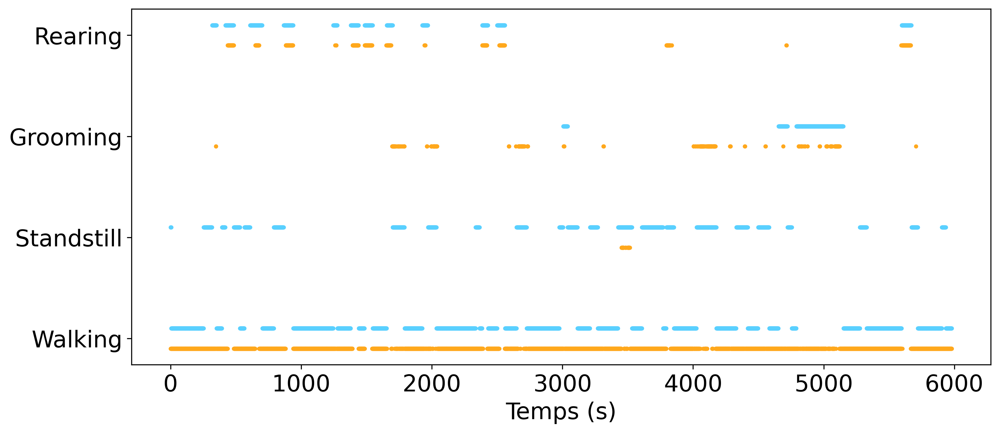

In [63]:
fig,ax=plt.subplots(figsize=(12,5), dpi=300)
l = manual_event[12000:].shape[0]
plt.scatter(np.linspace(0 , l , l), manual_event[12000:] + 0.1, s=5, color=colors['blue'])
plt.scatter(np.linspace(0 , l , l), predicted_classes - 0.1, s=5, color=colors['orange'])

ax.set_yticks([0,1,2,3])
ax.set_yticklabels(['Walking', 'Standstill', 'Grooming', 'Rearing'], fontsize=18)
ax.tick_params(axis='x', labelsize=18)
#ax.set_xticklabels(fontsize=18)
ax.set_xlabel('Temps (s)', fontsize=18)
plt.show()

In [64]:
from sklearn.metrics import classification_report, accuracy_score

print(classification_report(manual_event[12000:], predicted_classes))

              precision    recall  f1-score   support

           0       0.64      0.99      0.78      3320
           1       1.00      0.03      0.06      1506
           2       0.23      0.17      0.19       465
           3       0.92      0.61      0.73       689

    accuracy                           0.64      5980
   macro avg       0.70      0.45      0.44      5980
weighted avg       0.73      0.64      0.55      5980



In [136]:
import numpy as np
from sklearn.model_selection import train_test_split

def apply_gaussian_filter(X, sigma=3.5):
    """
    Applique un filtre gaussien sur chaque série temporelle dans la dimension 0 de l'array X.
    
    Parameters:
    X (numpy.ndarray): L'array de données à filtrer. Assumé d'être de forme (t, features).
    sigma (float): L'écart-type pour le filtre gaussien, qui détermine le degré de lissage.
    
    Returns:
    numpy.ndarray: L'array filtré.
    """
    # Appliquer le filtre gaussien pour chaque colonne indépendamment
    X_filtered = np.array([gaussian_filter1d(X[:, i], sigma=sigma) for i in range(X.shape[1])])
    
    # Transposer le résultat pour remettre les features en colonnes
    return X_filtered.T

# Fonction pour redimensionner X en blocs de 10x3
def reshape_X_for_CNN(X, time_steps=10):
    # Assurez-vous que la longueur de X est divisible par time_steps
    num_complete_blocks = X.shape[0] // time_steps
    X_cropped = X[:num_complete_blocks * time_steps]
    X_reshaped = X_cropped.reshape(-1, time_steps, 3, 1)  # Ajout d'une dimension pour les canaux
    return X_reshaped

#X_filt_features = apply_gaussian_filter(X,sigma=3.5)
# block_features = reshape_X_for_CNN(X_filt)

In [11]:
video_features.shape

NameError: name 'video_features' is not defined

# Tests with 4 coords and video

In [112]:
# dont forget manual_event

event_datapath = '/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M28_S1'
coords_dict = load_dict(event_datapath + '/metadata.pkl')
coords = coords_dict['coords']

axial_length = compute_principal_axis_length(event_datapath)


# Necessary informations to discriminate events
velocity = gaussian_filter1d(np.sqrt(np.diff(coords[:,0], axis=0)**2 + np.diff(coords[:,1], axis=0)**2),sigma=3)
velocity = np.append(velocity, velocity[-1])

depth = coords[:,2]
norm_depth = -depth + np.max(depth)
baseline_depth = baseline_minfilter(norm_depth, window=1500)
bs_norm_depth = norm_depth - baseline_depth

if not os.path.exists(event_datapath + '/boxed_video.tif'):
    # For video: 
    create_mouse_box(event_datapath, flip_parameters = [1.2 , False])

video_features = load_tif_stack(event_datapath + '/boxed_video.tif')

motion_energy = np.sum(np.sqrt(np.diff(video_features,axis=0)**2), axis=(1,2))
motion_energy = np.append(motion_energy, motion_energy[-1])


X = np.column_stack((velocity, bs_norm_depth, axial_length, motion_energy))

scaler = StandardScaler()
X = scaler.fit_transform(X)

# gaussian filter
X_filt_features = apply_gaussian_filter(X,sigma=3.5)


# Prepare your data inputs
video_features = video_features.reshape(-1, 90, 90, 1)  # Adding channel dimension for CNN
X_filt_features = X_filt_features.reshape(-1, 1, 4)     # Adding time step dimension for LSTM

In [119]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.model_selection import train_test_split


# Assuming 'video_features' is no longer used and X_filt_features is now your main dataset shaped as (samples, timesteps, features)
# Let's rename X_filt_features to clarify its role

# Split data for training and testing
X_train, X_test, y_train, y_test = train_test_split(
    X_filt_features[:12000], manual_event[:12000], test_size=0.3, random_state=42)

# Input for the time series data
time_series_input = Input(shape=(None, 4))  # None for variable sequence lengths, 3 features per step

# LSTM layer
lstm_output = LSTM(32, return_sequences=False)(time_series_input)
output_layer = Dense(32, activation='relu')(lstm_output)

# Output layer
output = Dense(4, activation='softmax')(output_layer)  # Assuming 4 possible states

# Model assembly and compilation
model = Model(inputs=time_series_input, outputs=output)
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Setup callbacks for efficient training
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.001)

# Train the model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=25,
    batch_size=32,
    callbacks=[early_stopping, reduce_lr]
)

# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Loss: {loss}, Accuracy: {accuracy}")

Epoch 1/25
263/263 [==============================] - 3s 4ms/step - loss: 0.8448 - accuracy: 0.7576 - val_loss: 0.6654 - val_accuracy: 0.7753 - lr: 0.0010
Epoch 2/25
263/263 [==============================] - 1s 2ms/step - loss: 0.6245 - accuracy: 0.7844 - val_loss: 0.6204 - val_accuracy: 0.7931 - lr: 0.0010
Epoch 3/25
263/263 [==============================] - 1s 2ms/step - loss: 0.6049 - accuracy: 0.7925 - val_loss: 0.6050 - val_accuracy: 0.8033 - lr: 0.0010
Epoch 4/25
263/263 [==============================] - 1s 2ms/step - loss: 0.5955 - accuracy: 0.7983 - val_loss: 0.5984 - val_accuracy: 0.7925 - lr: 0.0010
Epoch 5/25
263/263 [==============================] - 1s 2ms/step - loss: 0.5892 - accuracy: 0.7975 - val_loss: 0.5945 - val_accuracy: 0.8067 - lr: 0.0010
Epoch 6/25
263/263 [==============================] - 1s 2ms/step - loss: 0.5827 - accuracy: 0.8025 - val_loss: 0.5906 - val_accuracy: 0.7992 - lr: 0.0010
Epoch 7/25
263/263 [==============================] - 1s 3ms/step - lo

In [177]:
# Make predictions on the test set
predictions = model.predict(X_filt_features[12000:])

# Optionally, you might want to convert these predictions from probabilities to class labels
# assuming your outputs are using softmax and you want the class with the highest probability
predicted_classes = np.argmax(predictions, axis=1)

187/187 [==============================] - 0s 1ms/step


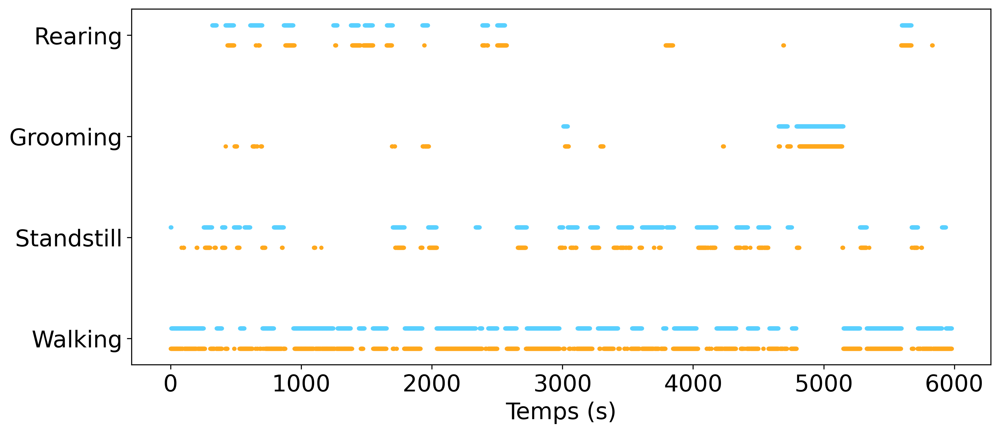

In [178]:
fig,ax=plt.subplots(figsize=(12,5), dpi=300)
l = manual_event[12000:].shape[0]
plt.scatter(np.linspace(0 , l , l), manual_event[12000:] + 0.1, s=5, color=colors['blue'])
plt.scatter(np.linspace(0 , l , l), predicted_classes - 0.1, s=5, color=colors['orange'])

ax.set_yticks([0,1,2,3])
ax.set_yticklabels(['Walking', 'Standstill', 'Grooming', 'Rearing'], fontsize=18)
ax.tick_params(axis='x', labelsize=18)
#ax.set_xticklabels(fontsize=18)
ax.set_xlabel('Temps (s)', fontsize=18)
plt.show()

In [180]:
from sklearn.metrics import classification_report, accuracy_score

print(classification_report(manual_event[12000:], predicted_classes))

              precision    recall  f1-score   support

           0       0.79      0.93      0.86      3320
           1       0.81      0.52      0.64      1506
           2       0.67      0.78      0.72       465
           3       0.79      0.67      0.73       689

    accuracy                           0.79      5980
   macro avg       0.77      0.73      0.74      5980
weighted avg       0.79      0.79      0.78      5980



# Creating a better dataset with a fuckton of grooming, standstill, rearing and walking information, all equal in quantity

In [159]:
from scipy.stats import mode

from scipy.stats import mode
import numpy as np

def calculate_mode_per_block(data, time_steps=10):
    if time_steps <= 0:
        raise ValueError("time_steps must be a positive integer")
    
    # Calculate the number of complete blocks and the remainder
    num_complete_blocks = data.shape[0] // time_steps
    remainder = data.shape[0] % time_steps

    # Initialize an array for mode values
    mode_values = np.zeros(num_complete_blocks + (1 if remainder else 0), dtype=int)
    
    # Calculate the mode for each complete block
    for i in range(num_complete_blocks):
        start_index = i * time_steps
        end_index = start_index + time_steps
        block = data[start_index:end_index]
        mode_value, count = mode(block, axis=None)
        mode_values[i] = mode_value[0]  # mode returns a ModeResult, extract the mode itself
    
    # Handle the remainder if there is any
    if remainder:
        block = data[-remainder:]  # Get the last 'remainder' elements
        mode_value, count = mode(block, axis=None)
        mode_values[-1] = mode_value[0]  # Append the mode of the remainder

    return mode_values

def rescale_mode_vector_and_evaluate_loss(mode_vector, original_vector, time_steps):
    """
    Étend chaque mode sur le nombre de pas de temps d'un bloc pour atteindre la longueur du vecteur original et
    évalue la perte de résolution temporelle en comparant avec le vecteur original.

    Parameters:
    mode_vector (numpy.array): Le vecteur de modes calculés par bloc.
    original_vector (numpy.array): Le vecteur original de données.
    time_steps (int): Le nombre de pas dans chaque bloc utilisé pour calculer les modes.

    Returns:
    numpy.array: Un vecteur rescalé à la longueur originale.
    float: Pourcentage de correspondance des valeurs entre le vecteur original et le vecteur rescalé.
    """
    # Calculer le nombre total de blocs qui peuvent être formés
    num_blocks = len(original_vector) // time_steps
    
    # Initialiser le vecteur rescalé
    rescaled_vector = np.repeat(mode_vector, time_steps)

    # Si le vecteur original n'est pas un multiple parfait du nombre de time_steps,
    # ajuster la longueur du vecteur rescalé pour correspondre exactement à celle du vecteur original
    if len(original_vector) % time_steps != 0:
        rescaled_vector = rescaled_vector[:len(original_vector)]
    
    # Comparer le vecteur rescalé avec le vecteur original
    matches = rescaled_vector == original_vector
    resolution_loss_percentage = 100 * np.mean(matches)  # Pourcentage de valeurs correspondantes

    return rescaled_vector, resolution_loss_percentage

/var/folders/w6/s9qjh5156jg5p8dh9sd4bysr0000gn/T/ipykernel_74454/3427474422.py:22: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode_value, count = mode(block, axis=None)
/var/folders/w6/s9qjh5156jg5p8dh9sd4bysr0000gn/T/ipykernel_74454/3427474422.py:28: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to Tr

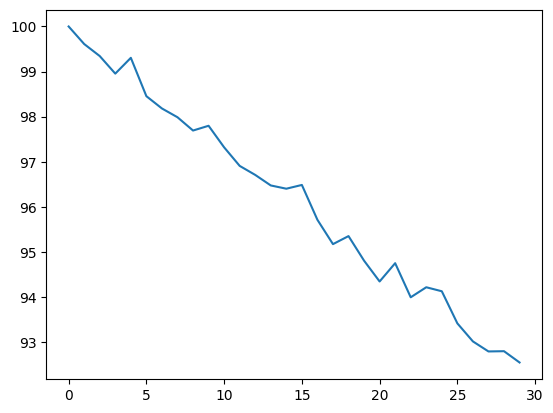

In [167]:
loss = []
for i in range(30):
    # Exemple d'utilisation
    block_events = calculate_mode_per_block(manual_event, i+1)
    rescaled_vector, loss_percentage = rescale_mode_vector_and_evaluate_loss(block_events, manual_event, i + 1)
    #print("Vecteur rescalé :", rescaled_vector)
    #print("time_steps: ", i, "Pourcentage de résolution restant :", loss_percentage)
    loss.append(loss_percentage)
plt.plot(loss)

In [264]:
block_events = calculate_mode_per_block(manual_event[12000:], 15)
block_predictions = calculate_mode_per_block(predicted_classes, 15)

/var/folders/w6/s9qjh5156jg5p8dh9sd4bysr0000gn/T/ipykernel_74454/3427474422.py:22: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode_value, count = mode(block, axis=None)
/var/folders/w6/s9qjh5156jg5p8dh9sd4bysr0000gn/T/ipykernel_74454/3427474422.py:28: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to Tr

In [265]:
print(classification_report(block_events, block_predictions))

              precision    recall  f1-score   support

           0       0.80      0.94      0.87       223
           1       0.82      0.55      0.65        99
           2       0.69      0.78      0.74        32
           3       0.83      0.67      0.74        45

    accuracy                           0.80       399
   macro avg       0.79      0.73      0.75       399
weighted avg       0.80      0.80      0.79       399



# États avec zones d'entropie élevée (>1)

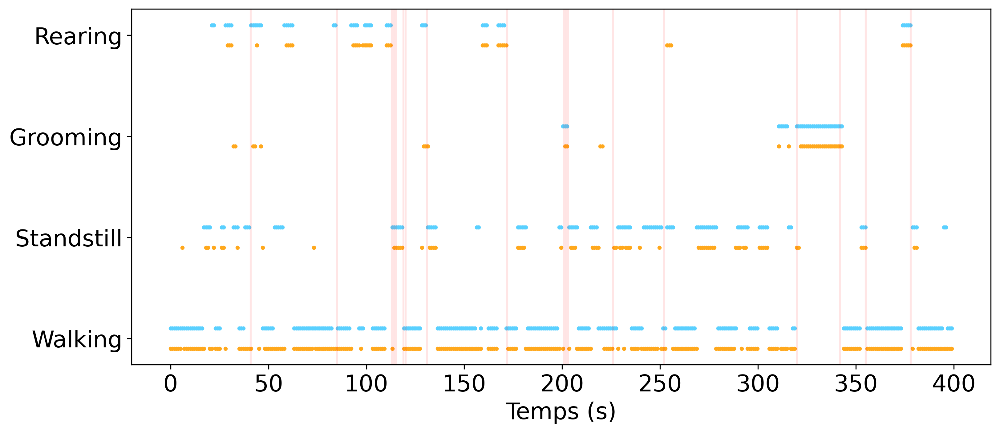

In [288]:
fig,ax=plt.subplots(figsize=(12,5), dpi=300)
l = block_events.shape[0]
plt.scatter(np.linspace(0 , l , l), block_events + 0.1, s=5, color=colors['blue'])
plt.scatter(np.linspace(0 , l , l), block_predictions - 0.1, s=5, color=colors['orange'])

# Ajouter des lignes verticales là où l'entropie est supérieure à 1
count=0
for index, entropy_value in enumerate(block_entropy):
    if entropy_value > 0.8:
        ax.axvline(x=index, color='red', alpha=0.1)
        count+=1


ax.set_yticks([0,1,2,3])
ax.set_yticklabels(['Walking', 'Standstill', 'Grooming', 'Rearing'], fontsize=18)
ax.tick_params(axis='x', labelsize=18)
#ax.set_xticklabels(fontsize=18)
ax.set_xlabel('Temps (s)', fontsize=18)
plt.show()

In [192]:
def count_elements(vector):
    unique, counts = np.unique(vector, return_counts=True)
    return dict(zip(unique, counts))

In [193]:
print(count_elements(block_events))
print(count_elements(block_predictions))

{0: 110, 1: 53, 2: 15, 3: 22}
{0: 130, 1: 31, 2: 17, 3: 22}


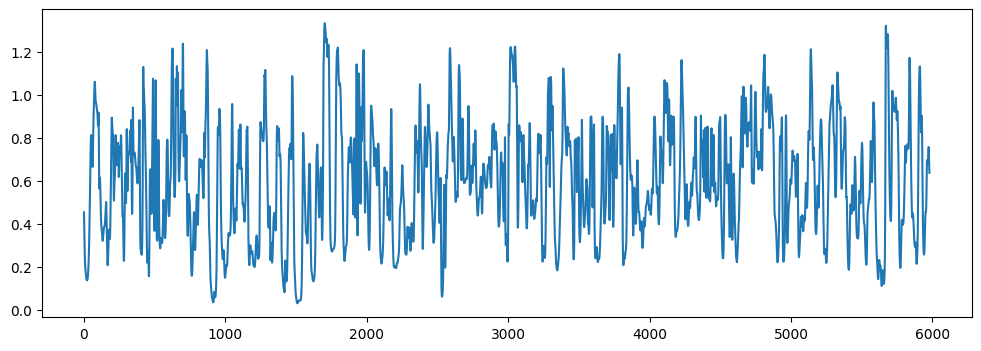

In [220]:
def calculate_entropy(probabilities):

    # Éviter le log de zéro en ajoutant un très petit nombre aux probabilités
    epsilon = 1e-10

    return -np.sum(probabilities * np.log(probabilities + epsilon), axis=1)

                   
entropy = calculate_entropy(predictions)
                   
fig,ax = plt.subplots(figsize=(12,4))
plt.plot(entropy)

In [267]:
block_predictions.shape

(399,)

In [271]:
def calculate_mean_per_block(data, time_steps=10):
    if time_steps <= 0:
        raise ValueError("time_steps must be a positive integer")
    
    # Calculate the number of complete blocks and the remainder
    num_complete_blocks = data.shape[0] // time_steps
    remainder = data.shape[0] % time_steps

    # Initialize an array for mode values
    mean_values = np.zeros(num_complete_blocks + (1 if remainder else 0))
    
    # Calculate the mode for each complete block
    for i in range(num_complete_blocks):
        start_index = i * time_steps
        end_index = start_index + time_steps
        block = data[start_index:end_index]
        mean_value = np.mean(block)
        mean_values[i] = mean_value  # mode returns a ModeResult, extract the mode itself
    
    # Handle the remainder if there is any
    if remainder:
        block = data[-remainder:]  # Get the last 'remainder' elements
        mean_value = np.mean(block)
        mean_values[-1] = mean_value  # Append the mode of the remainder

    return mean_values

In [272]:
block_entropy = calculate_mean_per_block(entropy, 15)

In [273]:
binary_entropy = block_entropy>1

In [277]:
count_elements(block_predictions[binary_entropy])

{0: 10, 1: 4, 2: 4}

array([0.25779673, 0.14611775, 0.36387214, 0.75424039, 0.85867494,
       0.99212795, 0.90131754, 0.58480853, 0.3622542 , 0.37865084,
       0.4201498 , 0.29045716, 0.48992911, 0.82276505, 0.63353336,
       0.72324878, 0.70610988, 0.72643685, 0.35923308, 0.52143294,
       0.68481898, 0.77299666, 0.64946574, 0.76720327, 0.67131859,
       0.64860147, 0.49804506, 0.49987191, 0.94508868, 0.44162792,
       0.24830167, 0.56056082, 0.78794849, 0.59392017, 0.42174709,
       0.47334293, 0.31582955, 0.43583265, 0.42747346, 0.66311085,
       0.52373087, 1.05804038, 0.66833508, 0.95669907, 0.83257174,
       0.80551928, 0.99153477, 0.79019314, 0.57081401, 0.49039581,
       0.27112913, 0.32372114, 0.35909349, 0.47630909, 0.65860081,
       0.67130435, 0.6317237 , 0.96142322, 0.87686169, 0.2291424 ,
       0.05666696, 0.06164812, 0.28455019, 0.8549245 , 0.60213411,
       0.26178175, 0.18020162, 0.2372591 , 0.34939352, 0.64692634,
       0.51278067, 0.42639074, 0.65473807, 0.76481831, 0.59060

In [310]:
jumps = create_mouse_box(event_datapath, flip_parameters = [2.7 , False])

100%|████████████████████████████████████| 17981/17981 [00:18<00:00, 955.16it/s]


In [481]:
# dont forget manual_event

event_datapath = '/Users/vincentchouinard/Documents/Maitrise/Behavior/BH_S1/BH_M28_S1'
coords_dict = load_dict(event_datapath + '/metadata.pkl')
coords = coords_dict['coords']

#axial_length = compute_principal_axis_length(event_datapath)


# Necessary informations to discriminate events
velocity = gaussian_filter1d(np.sqrt(np.diff(coords[:,0], axis=0)**2 + np.diff(coords[:,1], axis=0)**2),sigma=3)
velocity = np.append(velocity, velocity[-1])

depth = coords[:,2]
flat_depth = -depth + np.max(depth)
baseline_depth = baseline_minfilter(flat_depth, window=1500)
bs_depth = flat_depth - baseline_depth
bs_norm_depth = bs_depth / np.max(bs_depth)

del bs_depth, baseline_depth, flat_depth, depth

if not os.path.exists(event_datapath + '/boxed_video_rotating.tif'):
    # For video: 
    _ = create_mouse_box_v2(event_datapath)

video_features = load_tif_stack(event_datapath + '/boxed_video_rotating.tif')

#motion_energy = np.sum(np.sqrt(np.diff(video_features,axis=0)**2), axis=(1,2))
#motion_energy = np.append(motion_energy, motion_energy[-1])


X = np.column_stack((velocity, bs_norm_depth))


# gaussian filter
X_filt_features = apply_gaussian_filter(X,sigma=3.5)


## Prepare your data inputs
#video_features = video_features.reshape(-1, 90, 90, 1)  # Adding channel dimension for CNN
#X_filt_features = X_filt_features.reshape(-1, 1, 4)     # Adding time step dimension for LSTM

(17980, 2)

In [345]:
def create_mouse_box_v2(datapath, box_size=90, verbose=False):
    # Load centroids from the pickle file
    centroids = compute_centroids(datapath)
    filt_centroids = gaussian_filter1d(centroids, sigma=1.5, axis=0)
    max_intensity = find_max_pixel_value(datapath)
    
    # Path to the video file
    file_path = datapath + '/bg_sub_cropped_video.avi'
    output_path = datapath + '/boxed_video_rotating.tif'
    
    # Open the video file
    cap = cv2.VideoCapture(file_path)
    if not cap.isOpened():
        print(f"Error: Could not open file {file_path}.")
        return None, None

    # Prepare to write to a TIFF file
    with tiff.TiffWriter(output_path) as tif:
        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        
        # Loop over each frame in the video
        for i in tqdm(range(total_frames)):
            ret, frame = cap.read()
            if not ret:
                print("Error: Could not read frame.")
                break
            
            #convert to gray
            gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
            
            # Get the centroid and orientation for the current frame
            centroid_x, centroid_y = int(filt_centroids[i][0]), int(filt_centroids[i][1])

            # Rotate the frame to align the major axis with the x or y-axis
            (h, w) = frame.shape[:2]
            center = (centroid_x, centroid_y)
            
            # Calculate the top-left corner of the cropping square post-rotation
            start_x = max(centroid_x - box_size // 2, 0)
            start_y = max(centroid_y - box_size // 2, 0)
            
            # Ensure the cropping square does not go outside of the frame boundaries
            end_x = min(start_x + box_size, w)
            end_y = min(start_y + box_size, h)
            
            # Crop the rotated frame
            cropped_frame = gray_frame[start_y:end_y, start_x:end_x]
            
            # If the crop is smaller than expected (at edges), pad it to maintain size
            if cropped_frame.shape[0] < box_size or cropped_frame.shape[1] < box_size:
                cropped_frame = cv2.copyMakeBorder(cropped_frame,
                                                   top=max(0, box_size - cropped_frame.shape[0]),
                                                   bottom=0,
                                                   left=max(0, box_size - cropped_frame.shape[1]),
                                                   right=0,
                                                   borderType=cv2.BORDER_CONSTANT,
                                                   value=[0, 0, 0])  # Assuming black padding
            
            # Write the cropped frame to the TIFF file
            tif.write(cropped_frame.astype(np.float32)/max_intensity, photometric='minisblack')

    # Release the video capture object
    cap.release()
    
    if verbose:
        print("Cropping complete, output saved to", output_path)
    return jumps

In [346]:
_ = create_mouse_box_v2(event_datapath)

100%|███████████████████████████████████| 17981/17981 [00:11<00:00, 1544.15it/s]


array([ 0.04637897, -0.01337478, -0.00804818, ..., -0.00243157,
        0.01376802, -0.04050292], dtype=float32)

In [360]:
def rotate_frame(frame, k):
    """Rotates a frame by 90 degrees 'k' times."""
    return np.rot90(frame, k)

def data_augmentation(video_features, manual_events, X_filt_features):
    # Extract the number of frames
    num_frames = video_features.shape[0]
    
    # Prepare arrays to store augmented data
    augmented_video_features = np.empty((4 * num_frames, 90, 90), dtype=video_features.dtype)
    associated_manual_events = np.empty(4 * num_frames, dtype=manual_events.dtype)
    augmented_X_filt_features = np.empty((4 * num_frames, 2), dtype=X_filt_features.dtype)
    
    # Process each frame
    for i in range(num_frames):
        frame = video_features[i, :, :]
        event = manual_events[i]
        filt_features = X_filt_features[i, :]
        # Rotate frame and copy event and X_filt_features 4 times
        for k in range(4):
            augmented_video_features[4 * i + k, :, :] = rotate_frame(frame, k)
            associated_manual_events[4 * i + k] = event
            augmented_X_filt_features[4 * i + k, :] = filt_features
    
    return augmented_video_features, associated_manual_events, augmented_X_filt_features

In [475]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, LSTM, TimeDistributed, concatenate
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

# Prepare your data inputs
video_features = aug_video.reshape(-1, 90, 90, 1)  # Adding channel dimension for CNN
X_filt_features = aug_X.reshape(-1, 1, 2)     # Adding time step dimension for LSTM

# Split data for training and testing
X1_train, X1_test, X2_train, X2_test, y_train, y_test = train_test_split(
    X_filt_features, video_features, aug_manual, test_size=0.3, random_state=42)

# Input for the filtered features
time_series_input = Input(shape=(1, 2))  # Each feature set is of shape (1, 2)
time_series_processed = LSTM(32, return_sequences=False)(time_series_input)
time_series_branch = Dense(32, activation='relu')(time_series_processed)

# Input for the video frames
video_input = Input(shape=(90, 90, 1))  # Each video frame is 90x90 with 1 channel
x = Conv2D(32, (3, 3), activation='relu')(video_input)
x = MaxPooling2D((2, 2))(x)
x = Flatten()(x)
video_branch = Dense(32, activation='relu')(x)

# Concatenate both branches
combined = concatenate([time_series_branch, video_branch])

# Output layer
output = Dense(4, activation='softmax')(combined)  # Assuming 4 possible states

# Model assembly and compilation
model = Model(inputs=[time_series_input, video_input], outputs=output)
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Setup callbacks for efficient training
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.01)

# Train the model
history = model.fit(
    [X1_train, X2_train], y_train,
    validation_data=([X1_test, X2_test], y_test),
    epochs=25,
    batch_size=32,
    callbacks=[early_stopping, reduce_lr]
)

# Evaluate the model on the test set
loss, accuracy = model.evaluate([X1_test, X2_test], y_test)
print(f"Loss: {loss}, Accuracy: {accuracy}")

Epoch 1/25
1574/1574 [==============================] - 101s 63ms/step - loss: 0.6259 - accuracy: 0.7803 - val_loss: 0.5328 - val_accuracy: 0.8141 - lr: 0.0010
Epoch 2/25
1574/1574 [==============================] - 95s 60ms/step - loss: 0.4746 - accuracy: 0.8328 - val_loss: 0.4572 - val_accuracy: 0.8371 - lr: 0.0010
Epoch 3/25
1574/1574 [==============================] - 93s 59ms/step - loss: 0.4140 - accuracy: 0.8527 - val_loss: 0.4137 - val_accuracy: 0.8523 - lr: 0.0010
Epoch 4/25
1574/1574 [==============================] - 92s 58ms/step - loss: 0.3729 - accuracy: 0.8660 - val_loss: 0.4167 - val_accuracy: 0.8540 - lr: 0.0010
Epoch 5/25
1574/1574 [==============================] - 92s 59ms/step - loss: 0.3414 - accuracy: 0.8769 - val_loss: 0.3665 - val_accuracy: 0.8724 - lr: 0.0010
Epoch 6/25
1574/1574 [==============================] - 90s 57ms/step - loss: 0.3182 - accuracy: 0.8861 - val_loss: 0.3636 - val_accuracy: 0.8692 - lr: 0.0010
Epoch 7/25
1574/1574 [=======================

In [482]:
# Use model to make predictions
# Prepare your data inputs
video_features = video_features.reshape(-1, 90, 90, 1)  # Adding channel dimension for CNN
X_filt_features = X_filt_features.reshape(-1, 1, 2)     # Adding time step dimension for LSTM

predictions = model.predict([X_filt_features, video_features])
predicted_classes = np.argmax(predictions, axis=1)

562/562 [==============================] - 7s 13ms/step


# Aucun downsampling

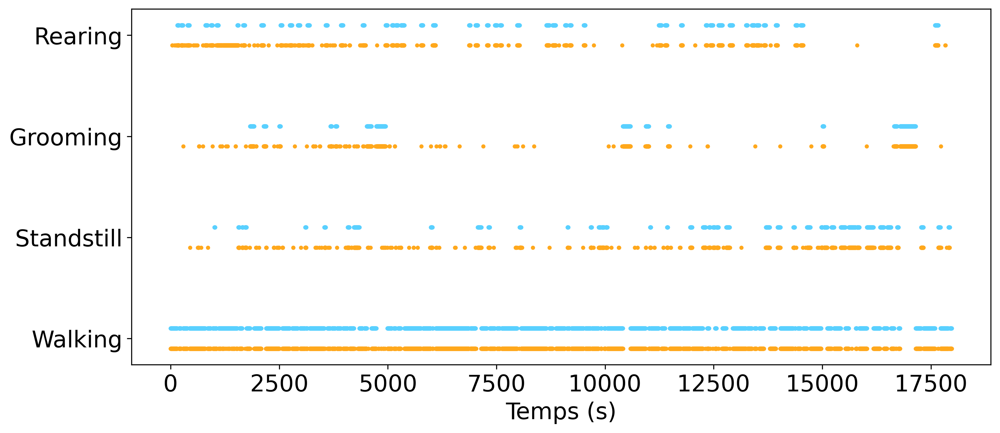

In [490]:
fig,ax=plt.subplots(figsize=(12,5), dpi=300)
l = predicted_classes.shape[0]
plt.scatter(np.linspace(0 , l , l), manual_event + 0.1, s=5, color=colors['blue'])
plt.scatter(np.linspace(0 , l , l), predicted_classes - 0.1, s=5, color=colors['orange'])


ax.set_yticks([0,1,2,3])
ax.set_yticklabels(['Walking', 'Standstill', 'Grooming', 'Rearing'], fontsize=18)
ax.tick_params(axis='x', labelsize=18)
#ax.set_xticklabels(fontsize=18)
ax.set_xlabel('Temps (s)', fontsize=18)
plt.savefig('/Users/vincentchouinard/Documents/Maitrise/Inkscape_figures/finished_figures/BH_CNN_RNN/predictions.svg')

In [484]:
# Initialize a dictionary to hold the total duration for each behavior
durations = {'W': 0, 'R': 0, 'S': 0, 'G': 0}

# Calculate the duration for each event and sum it up by type
for action, start, end in actions_intervals_complete:
    duration = end - start
    durations[action] += duration

# Calculate total duration of all events
total_duration = sum(durations.values())

# Calculate the proportion for each type of event
proportions = {action: duration / total_duration for action, duration in durations.items()}

# Print the results
for action, proportion in proportions.items():
    print(f"{action}: {proportion:.4f} ({proportion * 100:.2f}%)")

W: 0.6684 (66.84%)
R: 0.1322 (13.22%)
S: 0.1258 (12.58%)
G: 0.0736 (7.36%)


In [486]:
# Evaluate the classifier
print("Classification Report:")
print(classification_report(manual_event, predicted_classes))

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.94      0.96     12018
           1       0.91      0.95      0.93      2261
           2       0.93      0.95      0.94      1324
           3       0.81      0.94      0.87      2377

    accuracy                           0.94     17980
   macro avg       0.91      0.94      0.92     17980
weighted avg       0.94      0.94      0.94     17980



# Avec downsampling (2 hz au lieu de 30 hz)

In [487]:
block_events = calculate_mode_per_block(manual_event, 15)
block_predictions = calculate_mode_per_block(predicted_classes, 15)

/var/folders/w6/s9qjh5156jg5p8dh9sd4bysr0000gn/T/ipykernel_74454/3427474422.py:22: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode_value, count = mode(block, axis=None)
/var/folders/w6/s9qjh5156jg5p8dh9sd4bysr0000gn/T/ipykernel_74454/3427474422.py:28: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to Tr

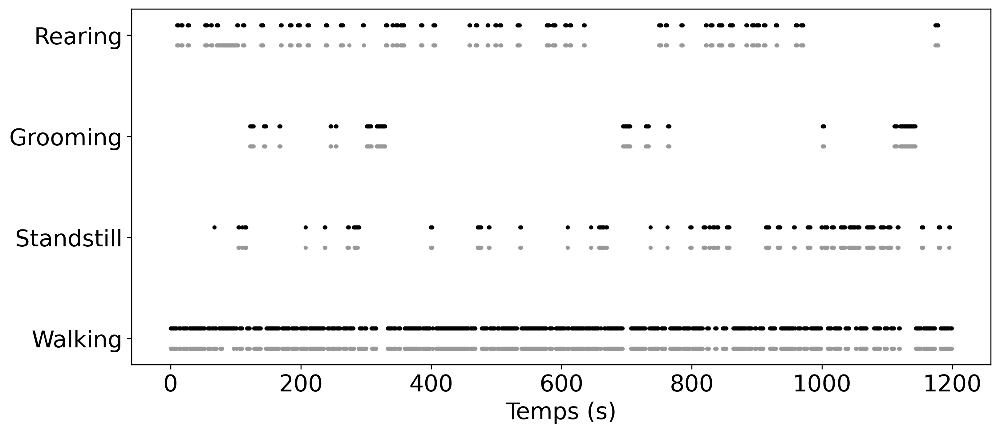

In [488]:
fig,ax=plt.subplots(figsize=(12,5), dpi=300)
l = block_events.shape[0]
plt.scatter(np.linspace(0 , l , l), block_events + 0.1, s=5, color='black',)
plt.scatter(np.linspace(0 , l , l), block_predictions - 0.1, s=5, color=colors['gray'])


ax.set_yticks([0,1,2,3])
ax.set_yticklabels(['Walking', 'Standstill', 'Grooming', 'Rearing'], fontsize=18)
ax.tick_params(axis='x', labelsize=18)
#ax.set_xticklabels(fontsize=18)
ax.set_xlabel('Temps (s)', fontsize=18)
plt.savefig('/Users/vincentchouinard/Documents/Maitrise/Inkscape_figures/finished_figures/BH_CNN_RNN/block_predictions.svg')

In [489]:
# Evaluate the classifier
print("Classification Report:")
print(classification_report(block_events, block_predictions))

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.96      0.97       803
           1       0.97      0.97      0.97       149
           2       0.99      0.99      0.99        89
           3       0.86      0.98      0.91       158

    accuracy                           0.97      1199
   macro avg       0.95      0.97      0.96      1199
weighted avg       0.97      0.97      0.97      1199



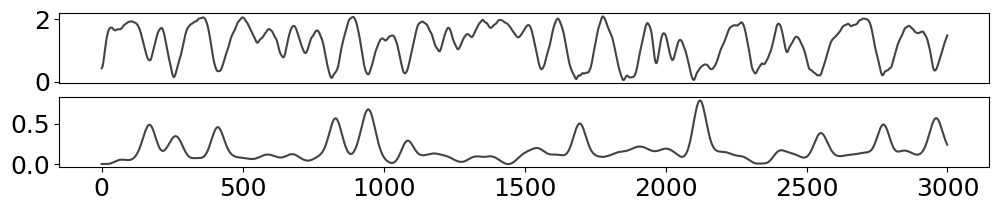

In [468]:
fig, ax = plt.subplots(2, 1, figsize=(12, 2))

# Plot data
ax[0].plot(X_filt_features[0:3000, 0, 0], color=colors['black'])
ax[1].plot(X_filt_features[0:3000, 0, 1], color=colors['black'])

# Set x limits
#ax[0].set_xlim([0, 18000])
#ax[1].set_xlim([0, 18000])
#ax[0].set_xticks([0,])

# Remove x ticks on the first subplot
ax[0].set_xticks([])
#ax[1].set_xticks([0,4000,8000,12000,16000])

# Customize font sizes
fontsize = 18  # You can adjust this size to your preference
ax[0].tick_params(axis='y', labelsize=fontsize)
ax[1].tick_params(axis='y', labelsize=fontsize)
ax[1].tick_params(axis='x', labelsize=fontsize)

# for a in ax:
#     a.spines['top'].set_visible(False)
#     a.spines['right'].set_visible(False)

# Show the plot
#plt.savefig('/Users/vincentchouinard/Documents/Maitrise/Inkscape_figures/finished_figures/BH_CNN_RNN/X_coords.svg')

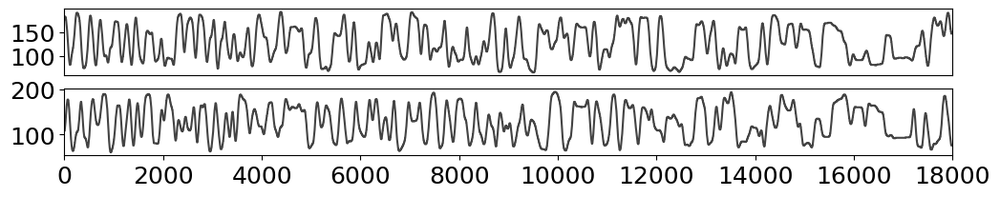

In [434]:
fig, ax = plt.subplots(2, 1, figsize=(12, 2))

# Plot data
ax[0].plot(coords[:, 0], color=colors['black'])
ax[1].plot(coords[:, 1], color=colors['black'])

# Set x limits
ax[0].set_xlim([0, 18000])
ax[1].set_xlim([0, 18000])
#ax[0].set_xticks([0,])

# Remove x ticks on the first subplot
ax[0].set_xticks([])
#ax[1].set_xticks([0,4000,8000,12000,16000])

# Customize font sizes
fontsize = 18  # You can adjust this size to your preference
ax[0].tick_params(axis='y', labelsize=fontsize)
ax[1].tick_params(axis='y', labelsize=fontsize)
ax[1].tick_params(axis='x', labelsize=fontsize)

# for a in ax:
#     a.spines['top'].set_visible(False)
#     a.spines['right'].set_visible(False)

# Show the plot
plt.savefig('/Users/vincentchouinard/Documents/Maitrise/Inkscape_figures/finished_figures/BH_CNN_RNN/xy_coords.svg')

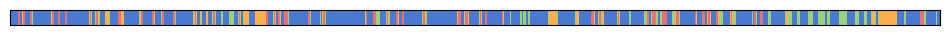

In [472]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

# Supposons que manual_event soit un numpy array. Par exemple:
# manual_event = np.array([0, 1, 2, 3, 0, 1, 2, 3, 0])

# Définir une palette de couleurs
coulors = ['#497AD0', '#9DD07B', '#FAB04E', '#E77173']  # Rouge pour 0, vert pour 1, etc.
cmap = ListedColormap(coulors)

# Créer une matrice où chaque ligne est le vecteur manual_event
event_matrix = np.tile(manual_event, (2, 1))  # Répéter le vecteur en 10 lignes pour visibilité

# Créer la figure et les axes
fig, ax = plt.subplots(figsize=(12, 0.2))  # Ajustez la taille selon vos besoins
ax.set_xticks([])
ax.set_yticks([])
# Afficher la matrice des évènements
cax = ax.imshow(event_matrix, cmap=cmap, aspect='auto')

# Ajouter une barre de couleur
#cbar = plt.colorbar(cax, ticks=[0.375, 1.125, 1.875, 2.625], ax=ax)
#cbar.ax.set_yticklabels(['0', '1', '2', '3'])  # Assurez-vous que les étiquettes correspondent aux valeurs

# Définir les limites pour les ticks de couleur
#cbar.set_ticklabels(['Event 0', 'Event 1', 'Event 2', 'Event 3'])

# Afficher la figure
plt.savefig('/Users/vincentchouinard/Documents/Maitrise/Inkscape_figures/finished_figures/BH_CNN_RNN/event_vect.svg')

# NOR 24h et 2week